# Sentiment analysis

Sentiment analysis is a NLP technique to determine the sentiment of a sentence. In this implementation, we will focus on determining the sentiment of the subject of the subject or object or the sentence.

Here I propose some possible sentences for our dataset, indicating where the meaning is encoded.

- Morose man cries. (morose)
- Irascible woman shouts. (irascible)
- Frightened woman shouts. (frightened)
- Joyful kid laughs. (joyful, laughs)
- Furious man snaps. (furious, snaps)
- Kid startles man. (startles)
- Woman grieves man. (grieves)
...


| Nouns | Verbs | Adjectives |
| --- | --- | --- |
| Man | cries | morose |
| Woman | laughs | irascible |
| Kid | shouts | frightened |
|  | snaps | cheerful |
|  | entertains | gloomy |
|  | grieves | furious |
|  | startles | terrified |
|  | irritates |joyful|

The proposed vocabulary has 19 words and two different kind of sentences:
- Adj + Subject + Intransitive verb
- Subject + Transitive verb + Object

## 1. Create dataset

The first step is to create a dataset using the presented vocabulary. We have to store the words in DisCoPy's Word objects, encoding their meaning (name) and their grammar (codomain). Then, we introduce the grammar of the allowed sentences and create all the possible grammatical sentences. The next step is to assign a sentiment to each sentence. However, there are sentences that although they are grammatically correct, their meaning makes no sense, so we would have to remove them. 

### 1.1. Define the vocabulary

The first step to create a dataset is to define the words, their meaning and the word type. We have four three types of words: nouns, adjectives, verbs. We also distinguish two different types of verbs: transitive and intransitive. 

In [1]:
import numpy as np
import pickle

In [2]:
from discopy import Ty, Word # Import the classes for the type of word and for the word

s, n = Ty('s'), Ty('n') # Define the types s and n
nphr, adj, tv, iv, vphr = Ty('NP'), Ty('ADJ'), Ty('TV'), Ty('IV'), Ty('VP')

# Define the words (notice that we include both meaning and grammar)

# nouns
man, woman, kid = Word('man', n), Word('woman', n), Word('kid', n)
# adjectives
morose, irascible = Word('morose', n @ n.l), Word('irascible', n @ n.l)
frightened, cheerful = Word('frightened', n @ n.l), Word('cheerful', n @ n.l)
gloomy, furious = Word('gloomy', n @ n.l), Word('furious', n @ n.l)
terrified, joyful = Word('terrified', n @ n.l), Word('joyful', n @ n.l)
downcast, miserable = Word('downcast', n @ n.l), Word('miserable', n @ n.l)
old, young = Word('old', n @ n.l), Word('young', n @ n.l)
# Intransitive verbs
cries, shouts = Word('cries', n.r @ s), Word('shouts', n.r @ s)
laughs, snaps = Word('laughs', n.r @ s), Word('snaps', n.r @ s)
# Transitive verbs
grieves, startles = Word('grieves', n.r @ s @ n.l), Word('startles', n.r @ s @ n.l)
entertains, irritates = Word('entertains', n.r @ s @ n.l), Word('irritates', n.r @ s @ n.l)

nouns = [man, woman, kid]
adjectives = [morose, irascible, frightened, cheerful, gloomy, furious, terrified, joyful, downcast, miserable, old, young]
int_verbs = [cries, shouts, laughs, snaps]
t_verbs = [grieves, startles, entertains, irritates]

vocab = nouns + int_verbs + t_verbs + adjectives

### 1.2. Define the grammar

In this dataset we are going to consider the following structures to construct the sentences:

- adj + noun + int. verb
- noun + t. verb + noun

- Intransitive sentence

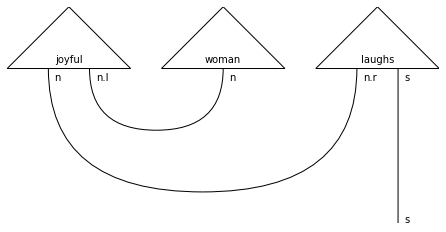

In [3]:
from discopy import Cup, Id, pregroup

grammar =  Id(n) @ Cup(n.l, n) @ Id(n.r @ s) >> Cup(n, n.r) @ Id(s) >> Id(s)
sentence = joyful @ woman @ laughs >> grammar
pregroup.draw(sentence)

- Transitive sentence

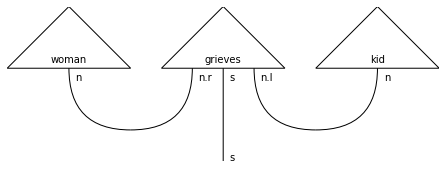

In [4]:
grammar =  Cup(n, n.r) @ Id(s) @ Cup(n.l, n)
sentence = woman @ grieves @ kid >> grammar
pregroup.draw(sentence)

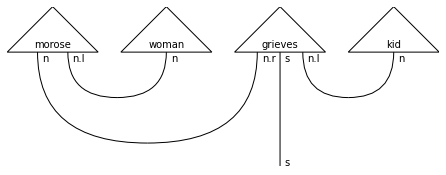

In [5]:
grammar =  Id(n) @ Cup(n.l, n) @ Id(n.r @ s) @ Cup(n.l, n) >> Cup(n, n.r) @ Id(s) >> Id(s)
sentence = morose @ woman @ grieves @ kid >> grammar
pregroup.draw(sentence)

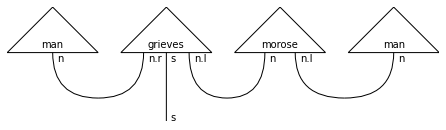

In [6]:
grammar =  Cup(n, n.r) @ Id(s) @ Cup(n.l, n) @ Cup(n.l, n) >> Id(s)
sentence =  man @ grieves @ morose @ man >> grammar
pregroup.draw(sentence)

Now we have seen how the grammatical structure of each type of sentence is, so we are ready to obtain all the grammatical sentences that we can construct with them with the vocabulary that we are using. 

In [7]:
from discopy import Diagram
from discopy.grammar import draw

# Store the grammatical structures in a dictionary 

grammar_dict = {
    'ADJ_N_IV' : Id(n) @ Cup(n.l, n) @ Id(n.r @ s) >> Cup(n, n.r) @ Id(s) >> Id(s),
    'N_TV_N': Cup(n, n.r) @ Id(s) @ Cup(n.l, n),
    'ADJ_N_TV_N': Id(n) @ Cup(n.l, n) @ Id(n.r @ s) @ Cup(n.l, n) >> Cup(n, n.r) @ Id(s) >> Id(s),
    'N_TV_ADJ_N': Cup(n, n.r) @ Id(s) @ Cup(n.l, n) @ Cup(n.l, n) >> Id(s)}
                                                                          

# Create parsing (grammatical analysis) dictionary where the grammatical sentences
# are the keys and the associated values are the diagrams (words + grammar)

data_psr = {}

# Intransitive sentences
parsing_int = {"{} {} {}.".format(adj, noun, int_verb): adj @ noun @ int_verb >> grammar_dict['ADJ_N_IV']
            for adj in adjectives for noun in nouns for int_verb in int_verbs}
sentences_int = list(parsing_int.keys())
for sentence in sentences_int:
    diagram = parsing_int[sentence]
    data_psr[sentence] = parsing_int[sentence]

# Transitive sentences (without adjective)
parsing_tra = {"{} {} {}.".format(subj, t_verb, obj):  subj @ t_verb @ obj >> grammar_dict['N_TV_N']
            for subj in nouns for t_verb in t_verbs for obj in nouns}


# Transitive sentences (with adjective)
parsing_tra_ladj = {"{} {} {} {}.".format(adj, subj, t_verb, obj):  adj @ subj @ t_verb @ obj >> grammar_dict['ADJ_N_TV_N']
            for adj in adjectives for subj in nouns for t_verb in t_verbs for obj in nouns}
parsing_tra_radj = {"{} {} {} {}.".format(subj, t_verb, adj, obj):  subj @ t_verb @ adj @ obj >> grammar_dict['N_TV_ADJ_N']
            for subj in nouns for t_verb in t_verbs for adj in adjectives for obj in nouns}

parsing_tra.update(parsing_tra_ladj) #merges transitive adjectives into original dict
parsing_tra.update(parsing_tra_radj)

sentences_tra = list(parsing_tra.keys())
for sentence in sentences_tra:
    diagram = parsing_tra[sentence]
    data_psr[sentence] = parsing_tra[sentence]

Now, we have the dataset with the sentences and their corresponding meaning and grammar. The next step is to design the corresponding quantum circuits to determine the sentiment for each sentence. We are aiming to distinguish between four different emotions: happy (0), sad (1), angry (2), scared (3). However, some sentences of the dataset cannot be clearly classified according to this criteria (for example, 'Old man cries'). Therefore, the next step is to manually modify the dataset so all the sentences can be classified according to this criteria. In order to do that we will create a .txt file and assign the corresponding class to the viable sentences.

### 1.3. Process the data

In [8]:
with open('./sentiment_large_corrected_balanced.txt') as f:
    data = f.readlines()

In [9]:
labels_dict = {}
data_psr_dict = {}
sent_type = {}
for sentence in data:
    sentstr = sentence[:-7]
    if sentence[-6:-3] == 'int':
        diagram = parsing_int[sentstr]
        data_psr_dict[sentstr] = diagram
        labels_dict[sentstr] = sentence[-2]
        sent_type[sentstr] = 'int'
    elif sentence[-6:-3] == 'tra':
        diagram = parsing_tra[sentstr]
        data_psr_dict[sentstr] = diagram
        labels_dict[sentstr] = sentence[-2]
        sent_type[sentstr] = 'tra'

In [10]:
c0 = 0
c1 = 0
c2 = 0
c3 = 0
for value in labels_dict.values():
    if value == '0':
        c0 +=1
    elif value == '1':
        c1 += 1
    elif value == '2':
        c2 += 1
    elif value == '3':
        c3 += 1
print('Number of elements for each sentiment')
print('Happy: ', c0)
print('Sad: ', c1)
print('Angry: ', c2)
print('Scared: ', c3)
print('Total', len(data_psr_dict))

Number of elements for each sentiment
Happy:  90
Sad:  96
Angry:  92
Scared:  87
Total 365


Now we have our dataset! The only problem left is the fact that the cups used in the diagrams are too resource consumming. Luckily, it is possible to remove them by transforming the states into effects (we are just doing this with the nouns as in https://github.com/CQCL/qnlp_lorenz_etal_2021_resources). Let us see some examples

- Intransitive sentence

In [11]:
from discopy import Cap, Box

woman2 = Box('woman', n.l, Ty())
words_new = (Cap(n, n.l)) >> (joyful @ Id(n) @ woman2 @ laughs)
sentence = words_new >> grammar_dict['ADJ_N_IV']
sentence = sentence.normal_form()

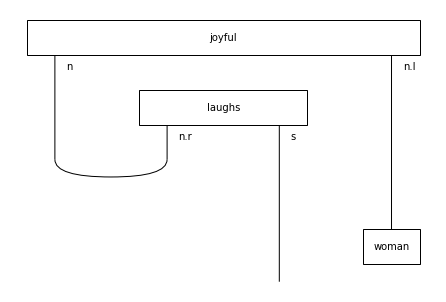

In [12]:
sentence.draw()

- Transitive sentence

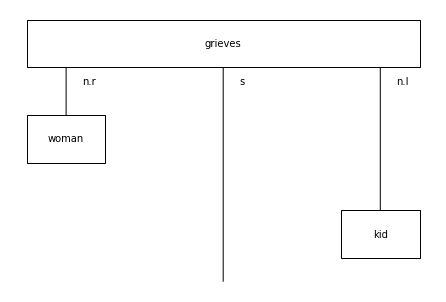

In [13]:
woman2 = Box('woman', n.r, Ty())
kid2 = Box('kid', n.l, Ty())
words_new = (Cap(n.r, n) @ Cap(n, n.l)) >> (woman2 @ Id(n) @ grieves @ Id(n) @ kid2)
sentence = words_new >> grammar_dict['N_TV_N']
sentence = sentence.normal_form()
sentence.draw()

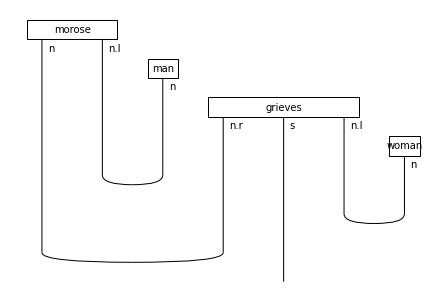

In [14]:
data_psr['morose man grieves woman.'].draw()

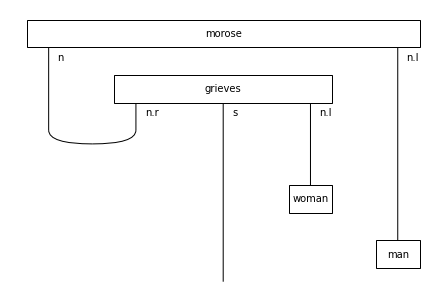

In [15]:
man2 = Box('man', n.l, Ty()) #I changed this to n.l to make everything fit but Im not certain I can just do that
woman2 = Box('woman', n.l, Ty())
words_new = (Cap(n, n.l) @ Cap(n, n.l)) >> (morose @ Id(n) @ man2 @ grieves @ Id(n) @ woman2)
sentence = words_new >> grammar_dict['ADJ_N_TV_N']
sentence = sentence.normal_form()
sentence.draw()

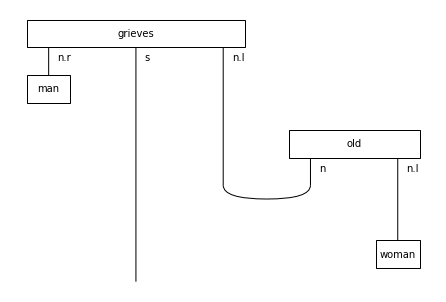

In [16]:
man2 = Box('man', n.r, Ty())
woman2 = Box('woman', n.l, Ty())
words_new = (Cap(n.r, n) @ Cap(n, n.l)) >> (man2 @ Id(n) @ grieves @ old @ Id(n) @ woman2)
sentence = words_new >> grammar_dict['N_TV_ADJ_N']
sentence = sentence.normal_form()
sentence.draw()

Let us apply this to our entire dataset.

In [17]:
data_new_psr_dict = {}
for sentstr in data_psr_dict.keys():
    num_words = len(sentstr.split(' '))
    words = data_psr_dict[sentstr].boxes[:num_words]
    if sent_type[sentstr] == 'int':
        noun = Box(words[1].name, n.l, Ty())
        words_new = (Cap(n, n.l)) >> (words[0] @ Id(n) @ noun @ words[2])
        sentence = words_new >> grammar_dict['ADJ_N_IV']
        data_new_psr_dict[sentstr] = sentence.normal_form()
    elif sent_type[sentstr] == 'tra':
        if num_words == 3:
            noun1 = Box(words[0].name, n.r, Ty())
            noun2 = Box(words[2].name, n.l, Ty())
            words_new = (Cap(n.r, n) @ Cap(n, n.l)) >> (noun1 @ Id(n) @ words[1] @ Id(n) @ noun2)
            sentence = words_new >> grammar_dict['N_TV_N']
            data_new_psr_dict[sentstr] = sentence.normal_form()
        elif words[0] in adjectives: #adjective at beginning
            noun1 = Box(words[1].name, n.l, Ty())
            noun2 = Box(words[3].name, n.l, Ty())
            words_new = (Cap(n, n.l) @ Cap(n, n.l)) >> (words[0] @ Id(n) @ noun1 @ words[2] @ Id(n) @ noun2)
            sentence = words_new >> grammar_dict['ADJ_N_TV_N']
            data_new_psr_dict[sentstr] = sentence.normal_form()
        else: #adjective on second noun
            noun1 = Box(words[0].name, n.r, Ty())
            noun2 = Box(words[3].name, n.l, Ty())
            words_new = (Cap(n.r, n) @ Cap(n, n.l)) >> (noun1 @ Id(n) @ words[1] @ words[2] @ Id(n) @ noun2)
            sentence = words_new >> grammar_dict['N_TV_ADJ_N']
            data_new_psr_dict[sentstr] = sentence.normal_form() 

The final step before the implementation of the quantum circuit is to redefine the vocabulary according to the new domain and codamain for the nouns as effects.

In [18]:
vocab_psr = []
for word in vocab:
    if word.cod == Ty('n'):
        vocab_psr.append(Box(word.name, n.r, Ty()))   # n.l case is dealt with in definition of quantum functor
    else:
        vocab_psr.append(word)

## 2. Create quantum circuit

Once the dataset and its corresponding diagrams are created, the next step is to construct the variational quantum circuits associated with them. In order to do that, we will use different ansätze depending on the type of the word that we want to represent. In this case we only have two types of words, nouns and verbs. Both types will have associated 2 qubits (as we have four sentiments, we need 4 quantum states to encode the result of the classification). Moreover, we will also distinguish between states and effects when constructing the ansätze.

In [19]:
from discopy.quantum import Ket, IQPansatz, Bra, qubit
from discopy.quantum.circuit import Functor, Id
from discopy.quantum.circuit import Circuit
from functools import reduce, partial
from discopy.quantum.gates import Rx, Rz

import numpy as np

q_s = 1 # number of qubits for type s (sentence)
q_n = 1 # number of qubits for type n (noun)
depth = 1 # depth of the IQPansatz
p_n = 3 # number of parameters for the single qubit iqp ansatz

# Define the dimensions of the objects of the circuit functor
ob = {s: q_s, n: q_n}                          
ob_cqmap = {s: qubit ** q_s, n: qubit ** q_n}   

# Define the ansätze for states and effects

def single_qubit_iqp_ansatz(params):
    if len(params) == 1:
        return Rx(params[0])  
    if len(params) == 2:
        return Rx(params[0]) >> Rz(params[1])
    if len(params) == 3:
        return IQPansatz(1, params)     
    
def ansatz_state(state, params):
    arity = sum(ob[Ty(factor.name)] for factor in state.cod) 
    if arity == 1:
        return Ket(0) >> single_qubit_iqp_ansatz(params)
    return Ket(*tuple([0 for i in range(arity)])) >> IQPansatz(arity, params)
    
def ansatz_effect(effect, params): 
    arity = sum(ob[Ty(factor.name)] for factor in effect.dom)
    if arity == 1:
        return single_qubit_iqp_ansatz(params) >> Bra(0)
    return IQPansatz(arity, params) >> Bra(*tuple([0 for i in range(arity)]))
       
def ansatz(box,params):
    dom_type = box.dom
    cod_type = box.cod
    if len(dom_type) == 0 and len(cod_type) != 0:
        return ansatz_state(box, params)
    if len(dom_type) != 0 and len(cod_type) == 0:
        return ansatz_effect(box, params)

# Construct the circuit functor
def F(params): 
    ar = dict()
    for i in range(len(vocab_psr)):
        pgbox = vocab_psr[i]
        qbox = ansatz(vocab_psr[i], params[i])
        ar.update({pgbox: qbox})
        if pgbox.cod == Ty():
            ar.update({Box(pgbox.name, n.l, Ty()): qbox})
    return Functor(ob_cqmap, ar)

In [20]:
#*****************************************************
# Functions to deal with the parametrisation
#*****************************************************

def paramshapes(vocab_psr):
    parshapes = []    
    for box in vocab_psr:
        dom_type = box.dom
        cod_type = box.cod
        dom_arity = sum(ob[Ty(factor.name)] for factor in box.dom)
        cod_arity = sum(ob[Ty(factor.name)] for factor in box.cod)
        if dom_arity == 0 or cod_arity == 0:  # states and effects
            arity = max(dom_arity, cod_arity)
            assert arity != 0
            if arity == 1:
                parshapes.append((p_n,))       
            if arity != 1:
                parshapes.append((depth, arity-1))
    return parshapes

def randparams(par_shapes):
    params = np.array([]) 
    for i in range(len(par_shapes)):
        params = np.concatenate((params, np.ravel(np.random.rand(*par_shapes[i])))) # np.ravel flattens an array
    return params 

def reshape_params(unshaped_pars, par_shapes):
    pars_reshaped = [[] for ii in range(len(par_shapes))]
    shift = 0
    for ss, s in enumerate(par_shapes):
        idx0 = 0 + shift
        if len(s) == 1:
            idx1 = s[0] + shift
        elif len(s) == 2:
            idx1 = s[0] * s[1] + shift
        pars_reshaped[ss] = np.reshape(unshaped_pars[idx0:idx1], s)
        if len(s) == 1:
            shift += s[0]
        elif len(s) == 2:
            shift += s[0] * s[1]
    return pars_reshaped

In [21]:
#****************************************
# Parameters of the current model
#****************************************

par_shapes = paramshapes(vocab_psr)
rand_unshaped_pars = randparams(par_shapes)
rand_shaped_pars = reshape_params(rand_unshaped_pars, par_shapes)

print('Number of parameters:    ', len(rand_unshaped_pars))

Number of parameters:     33


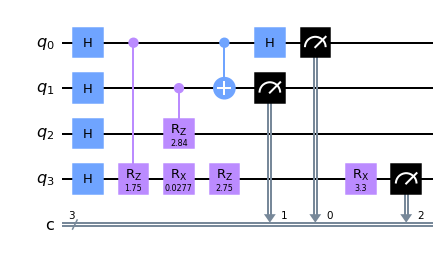

In [31]:
from pytket.extensions.qiskit import tk_to_qiskit
#func = F(rand_shaped_pars)

tk_to_qiskit(func(data_new_psr_dict['morose woman cries.']).to_tk()).draw(output='mpl')

morose woman cries.
morose >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


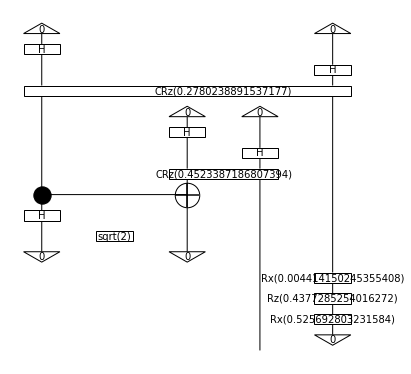

morose woman shouts.
morose >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


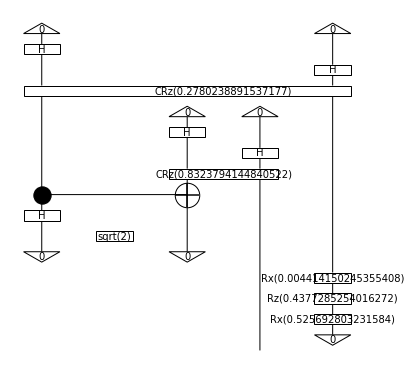

morose man cries.
morose >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


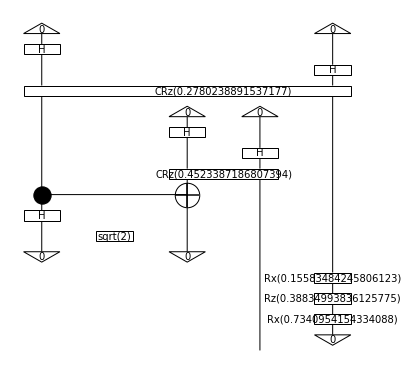

morose man shouts.
morose >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


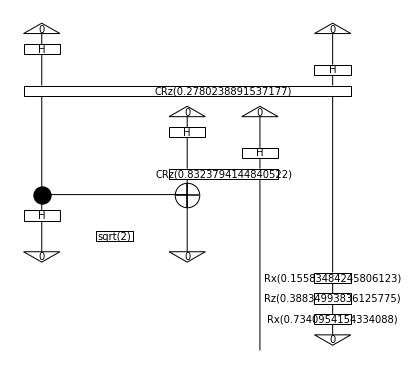

morose kid cries.
morose >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


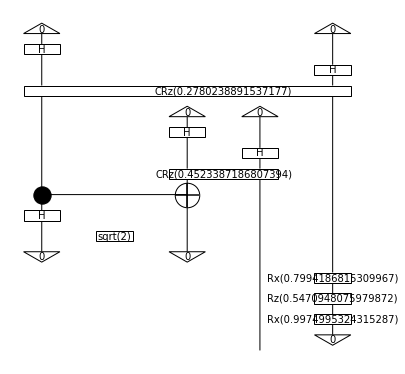

morose kid shouts.
morose >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


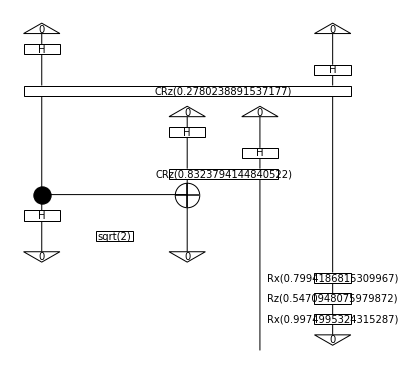

irascible woman cries.
irascible >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


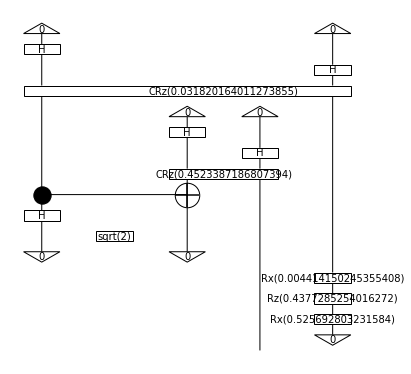

irascible woman shouts.
irascible >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


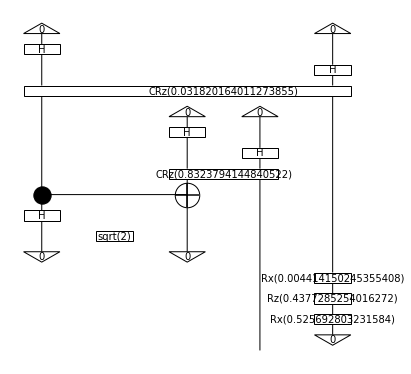

irascible woman snaps.
irascible >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


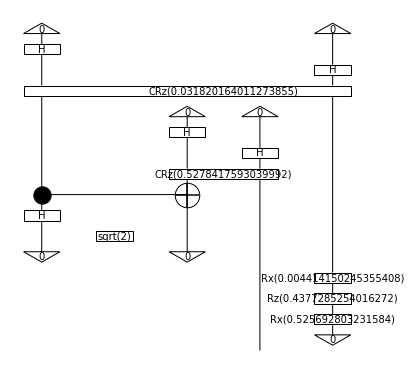

irascible man cries.
irascible >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


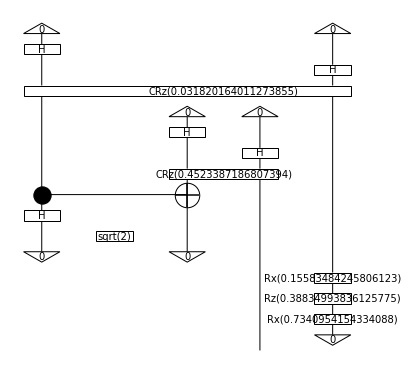

irascible man shouts.
irascible >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


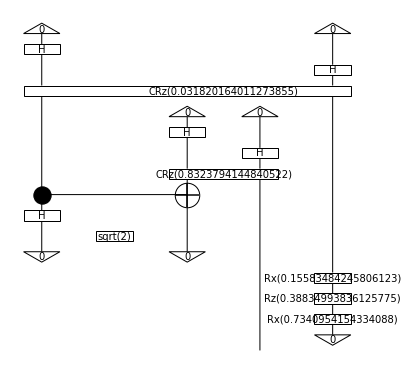

irascible man snaps.
irascible >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


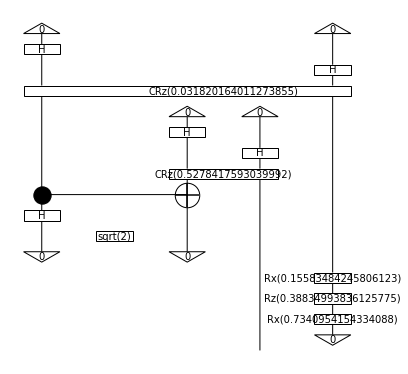

irascible kid cries.
irascible >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


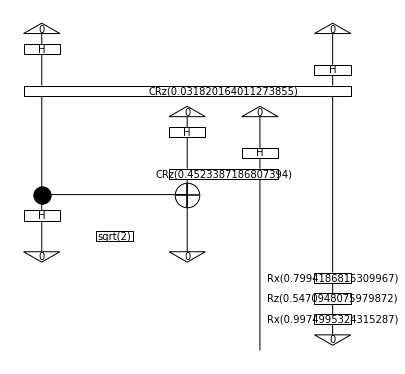

irascible kid shouts.
irascible >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


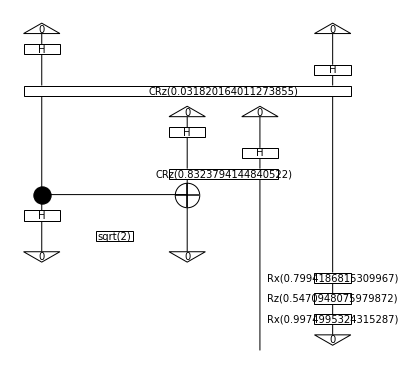

irascible kid snaps.
irascible >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


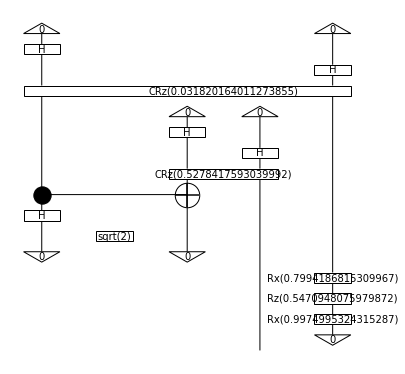

frightened woman cries.
frightened >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


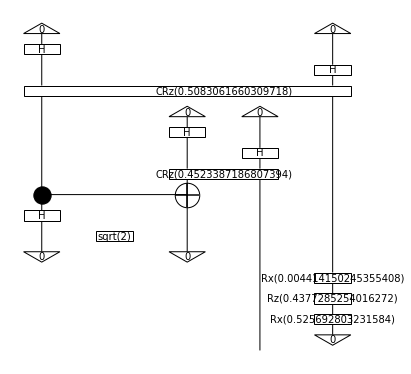

frightened woman shouts.
frightened >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


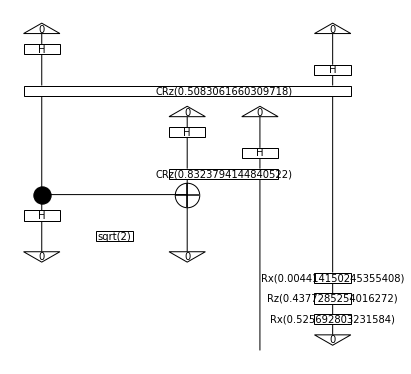

frightened woman snaps.
frightened >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


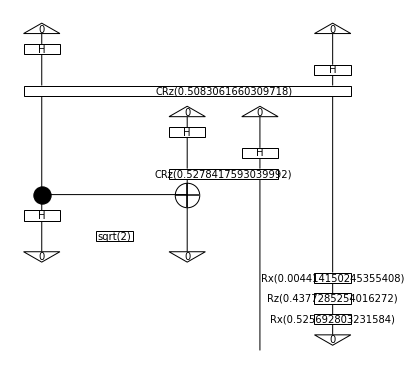

frightened man cries.
frightened >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


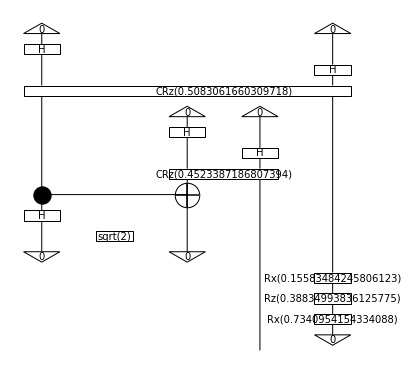

frightened man shouts.
frightened >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


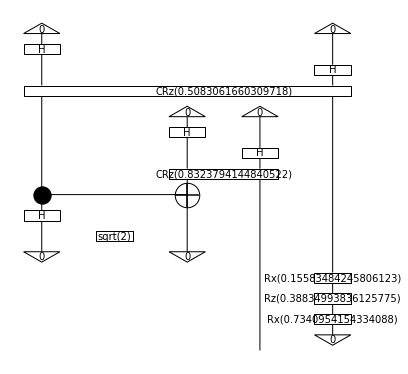

frightened man snaps.
frightened >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


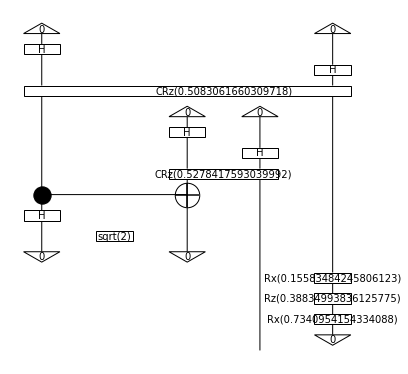

frightened kid cries.
frightened >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


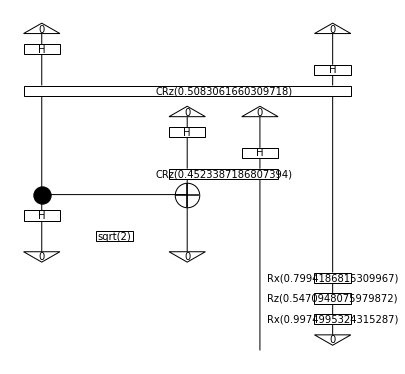

frightened kid shouts.
frightened >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


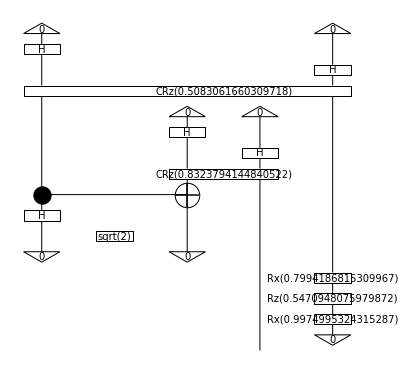

frightened kid snaps.
frightened >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


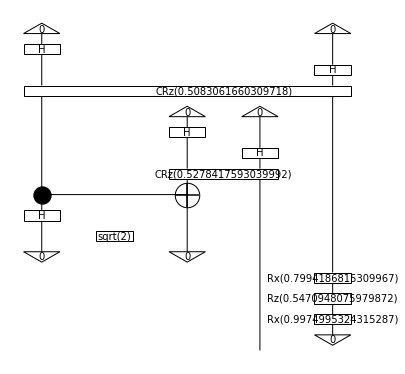

cheerful woman cries.
cheerful >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


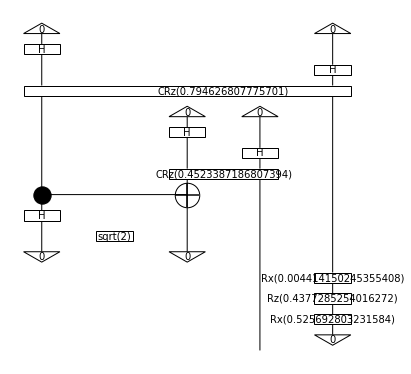

cheerful woman laughs.
cheerful >> Id(n) @ laughs @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


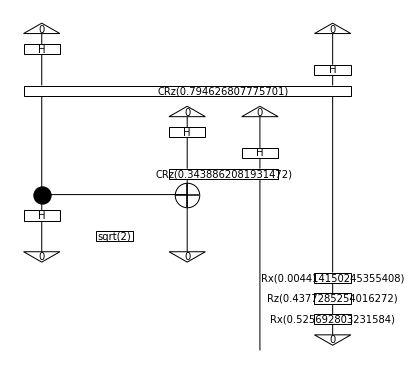

cheerful woman shouts.
cheerful >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


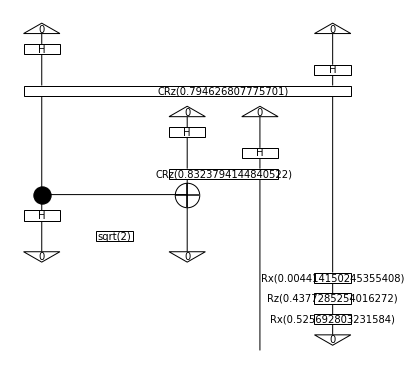

cheerful man cries.
cheerful >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


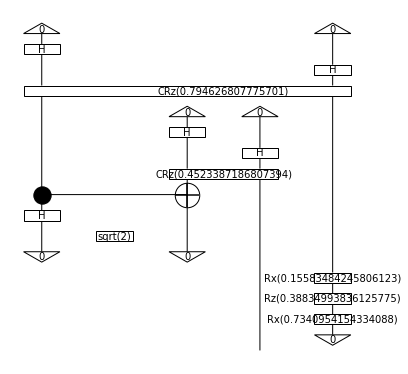

cheerful man shouts.
cheerful >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


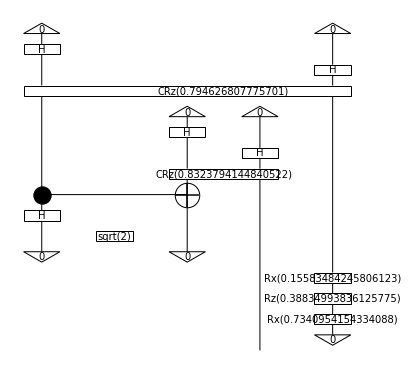

cheerful man laughs.
cheerful >> Id(n) @ laughs @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


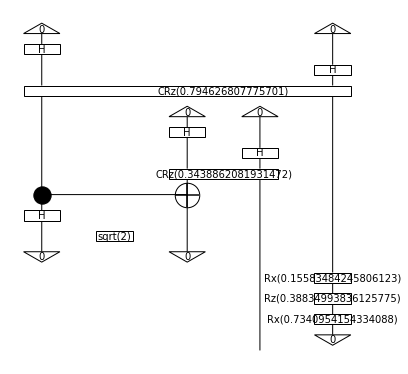

cheerful kid cries.
cheerful >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


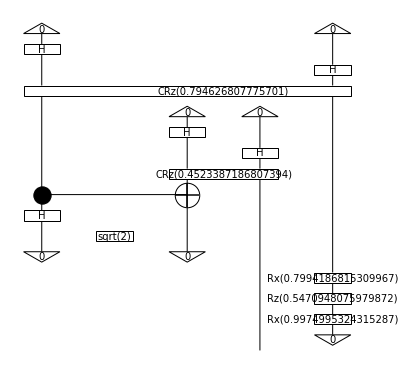

cheerful kid shouts.
cheerful >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


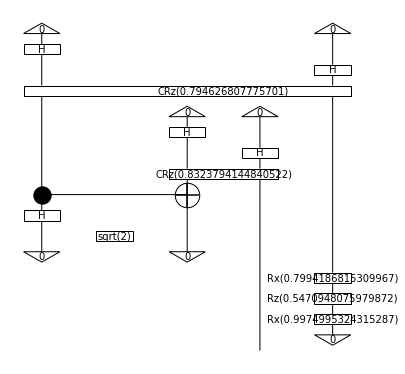

cheerful kid laughs.
cheerful >> Id(n) @ laughs @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


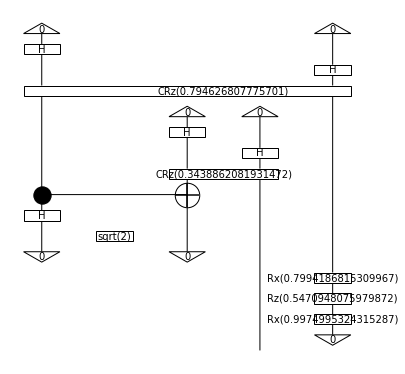

joyful woman cries.
joyful >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


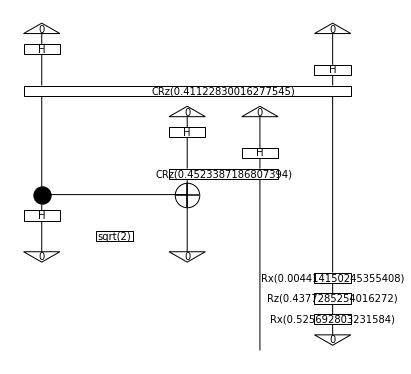

joyful woman shouts.
joyful >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


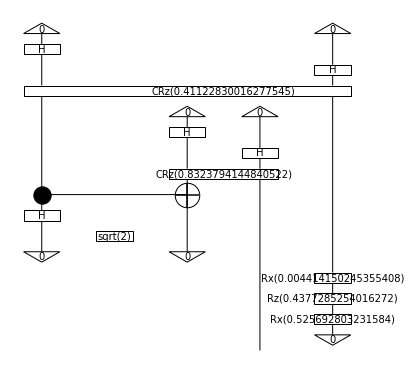

joyful woman laughs.
joyful >> Id(n) @ laughs @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


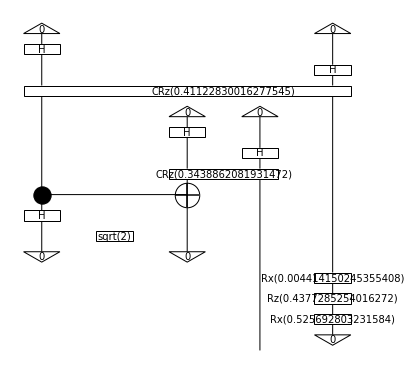

joyful man cries.
joyful >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


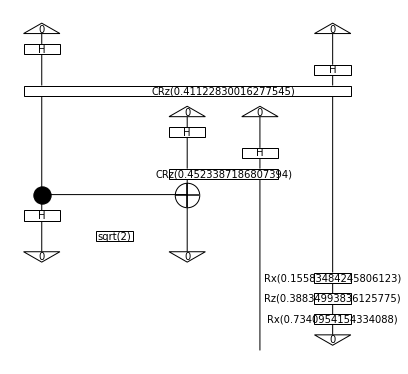

joyful man shouts.
joyful >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


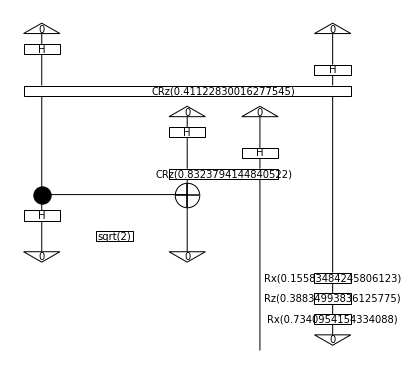

joyful man laughs.
joyful >> Id(n) @ laughs @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


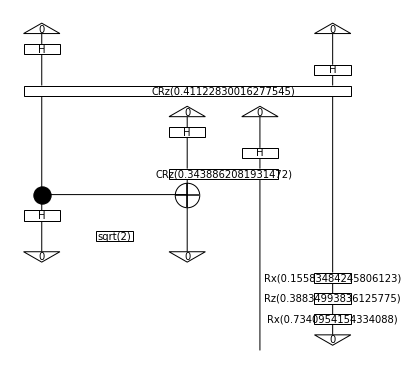

joyful kid cries.
joyful >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


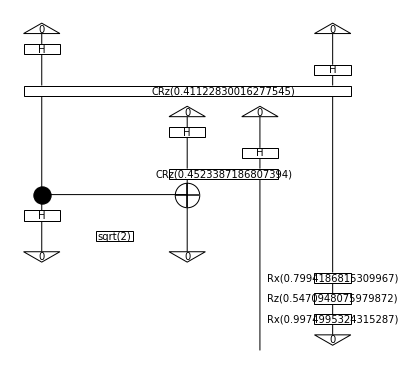

joyful kid shouts.
joyful >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


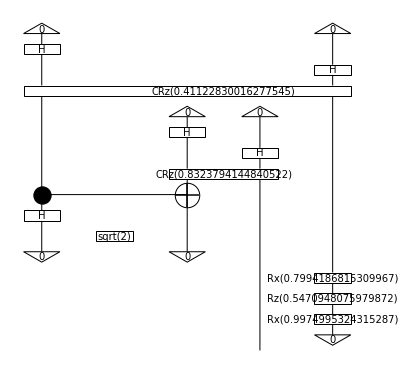

joyful kid laughs.
joyful >> Id(n) @ laughs @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


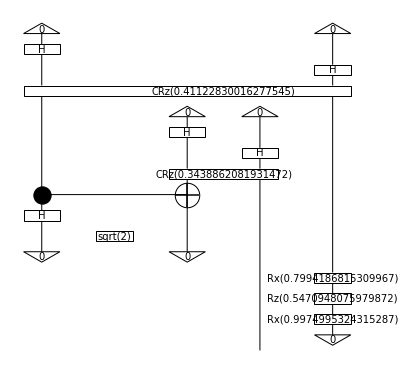

gloomy woman cries.
gloomy >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


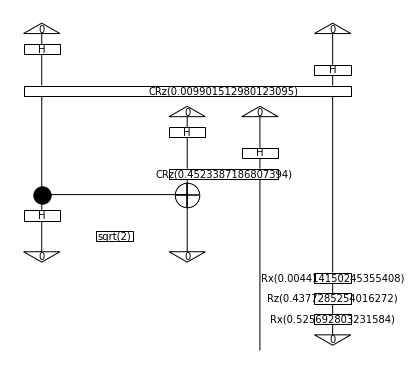

gloomy woman shouts.
gloomy >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


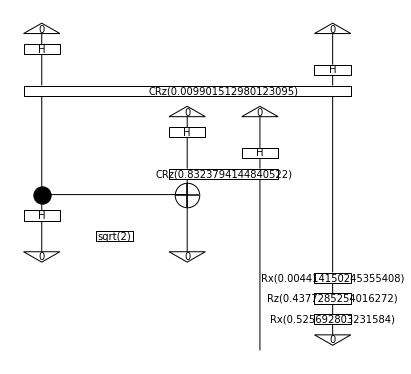

gloomy man cries.
gloomy >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


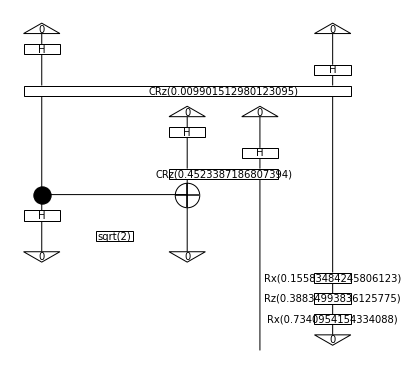

gloomy man shouts.
gloomy >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


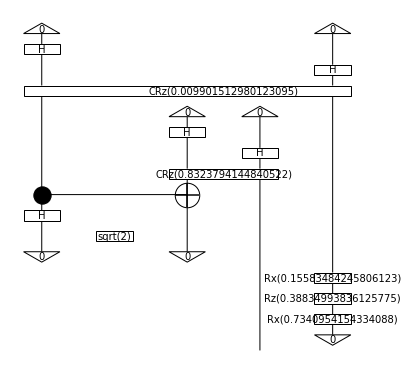

gloomy kid cries.
gloomy >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


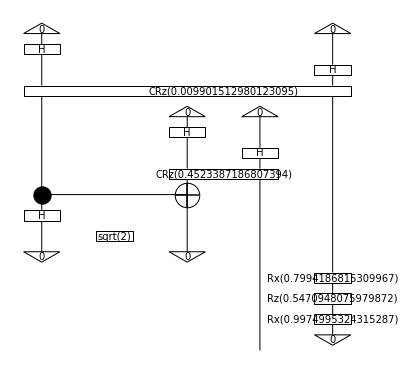

gloomy kid shouts.
gloomy >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


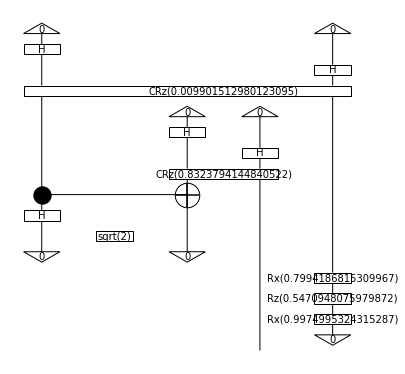

furious woman shouts.
furious >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


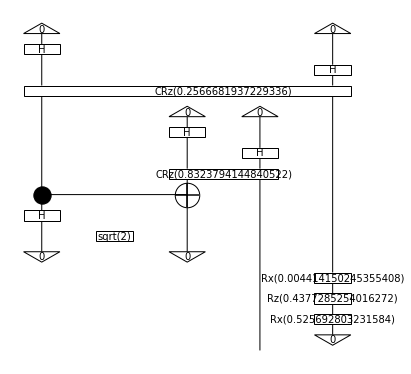

furious woman snaps.
furious >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


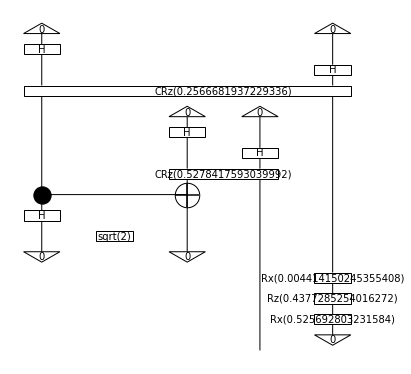

furious man cries.
furious >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


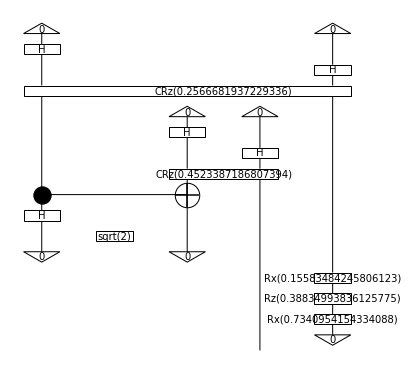

furious man shouts.
furious >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


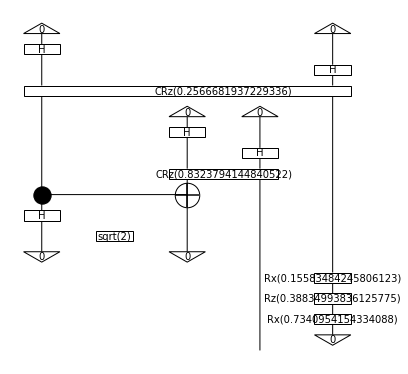

furious man snaps.
furious >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


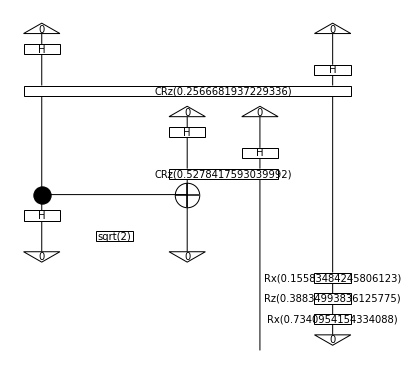

furious kid cries.
furious >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


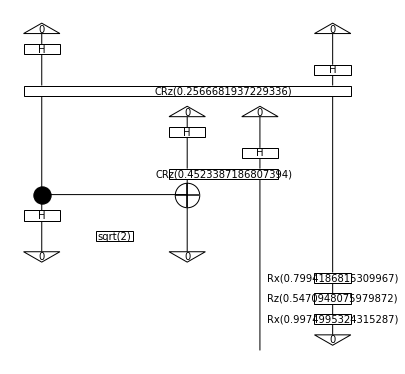

furious kid shouts.
furious >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


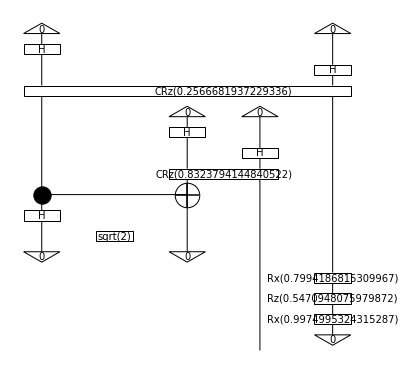

furious kid snaps.
furious >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


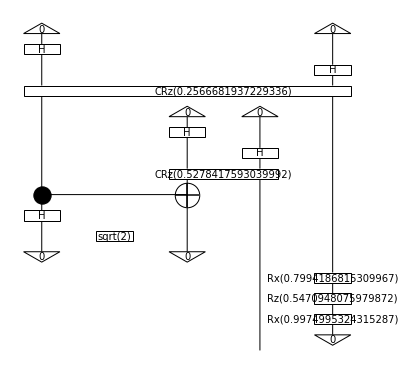

terrified woman cries.
terrified >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


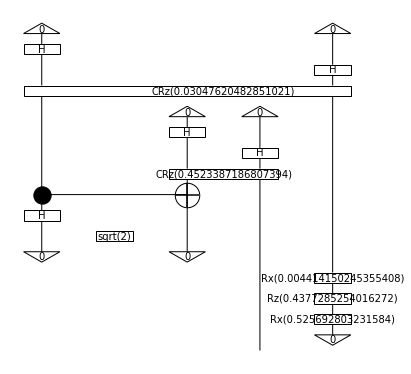

terrified woman shouts.
terrified >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


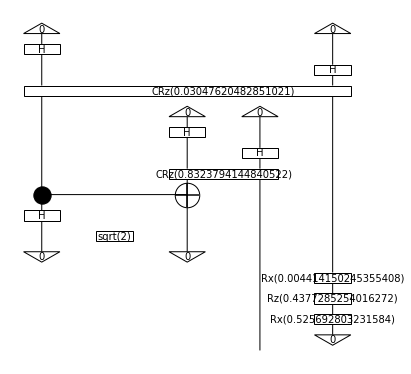

terrified woman snaps.
terrified >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


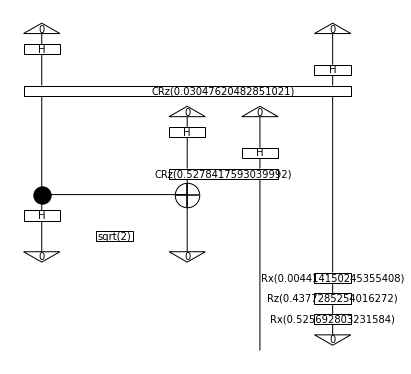

terrified man cries.
terrified >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


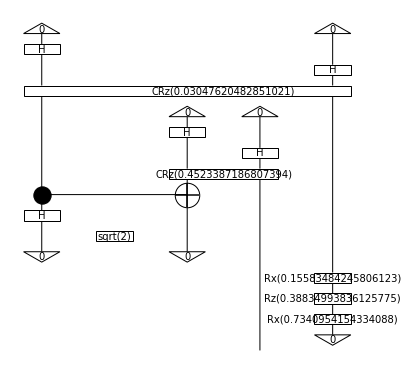

terrified man shouts.
terrified >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


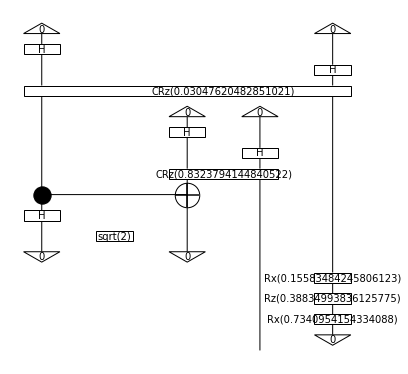

terrified man snaps.
terrified >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


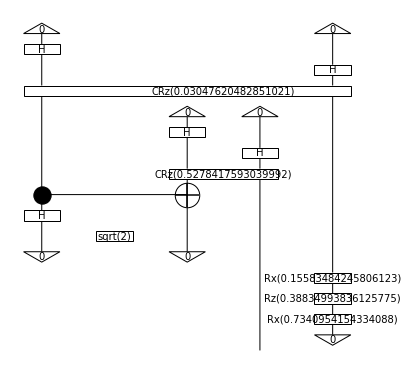

terrified kid cries.
terrified >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


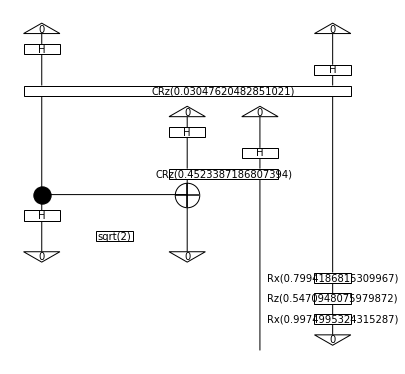

terrified kid shouts.
terrified >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


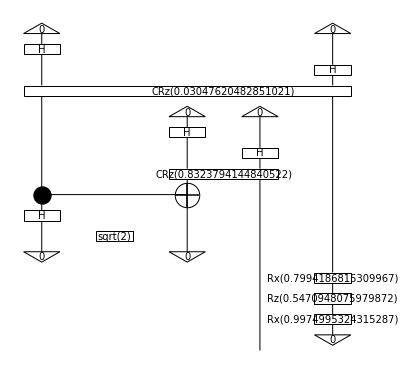

terrified kid snaps.
terrified >> Id(n) @ snaps @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


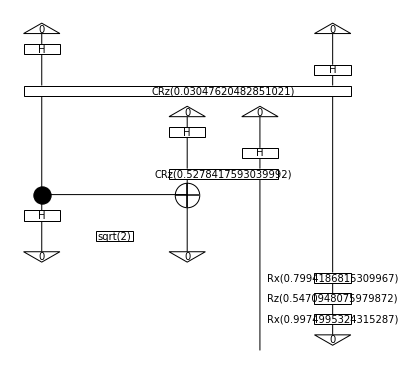

downcast man cries.
downcast >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


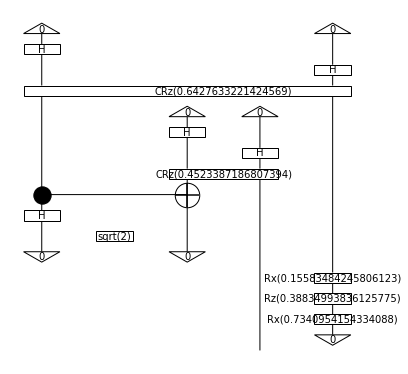

downcast man shouts.
downcast >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


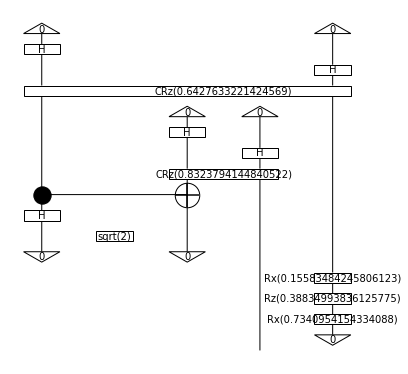

downcast woman cries.
downcast >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


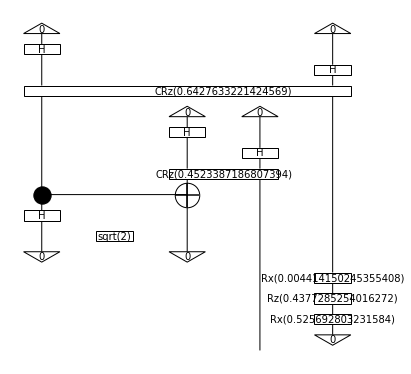

downcast woman shouts.
downcast >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


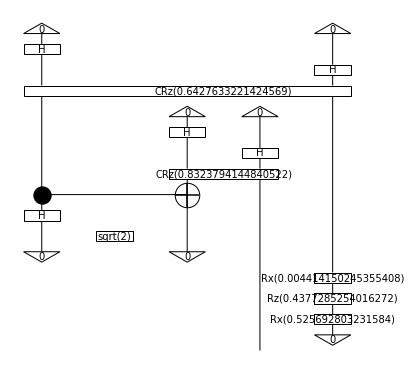

downcast kid cries.
downcast >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


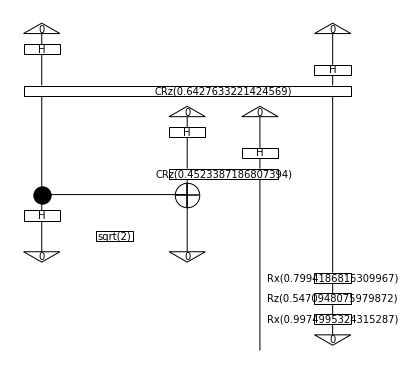

downcast kid shouts.
downcast >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


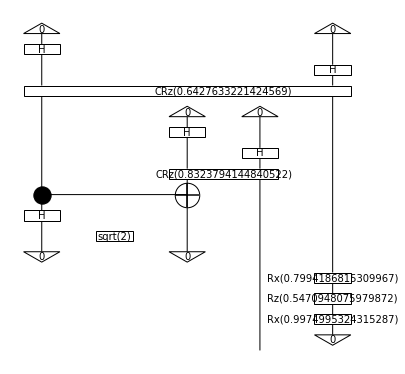

miserable man cries.
miserable >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


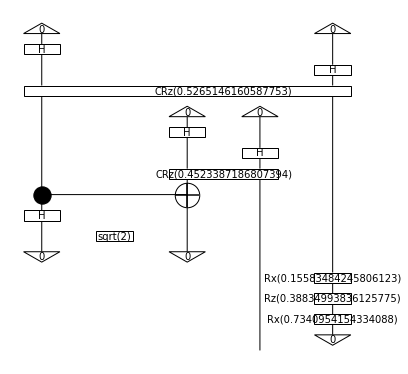

miserable man shouts.
miserable >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ man


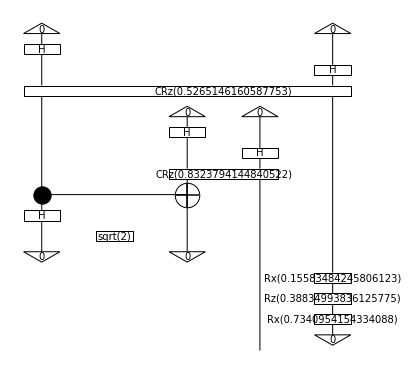

miserable woman cries.
miserable >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


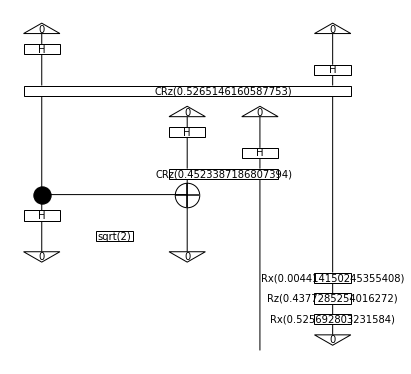

miserable woman shouts.
miserable >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ woman


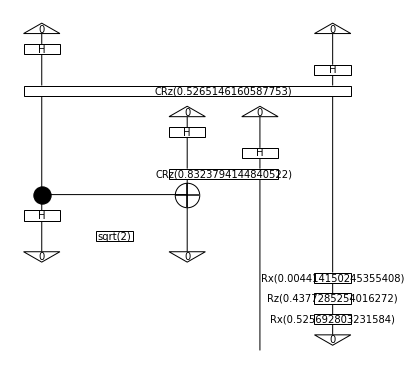

miserable kid cries.
miserable >> Id(n) @ cries @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


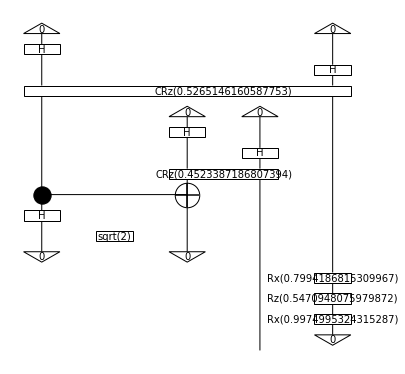

miserable kid shouts.
miserable >> Id(n) @ shouts @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l) >> Id(s) @ kid


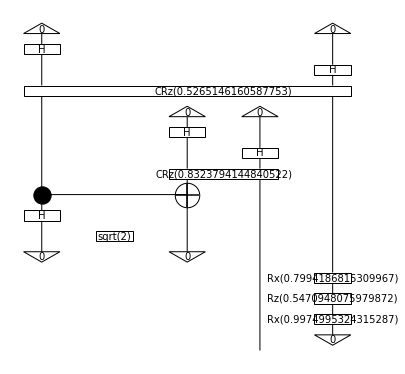

woman startles woman.
startles >> woman @ Id(s @ n.l) >> Id(s) @ woman


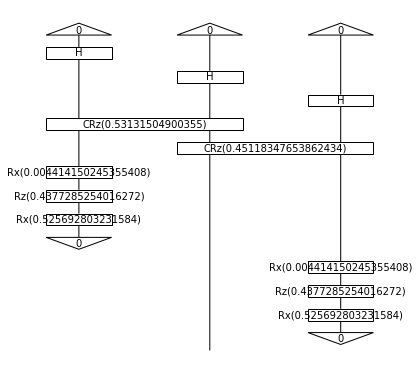

woman startles man.
startles >> woman @ Id(s @ n.l) >> Id(s) @ man


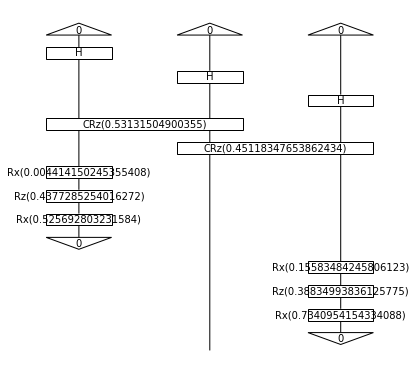

woman startles kid.
startles >> woman @ Id(s @ n.l) >> Id(s) @ kid


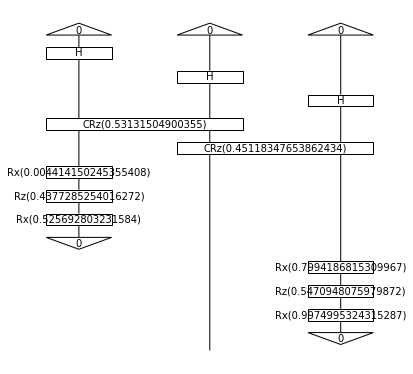

woman grieves woman.
grieves >> woman @ Id(s @ n.l) >> Id(s) @ woman


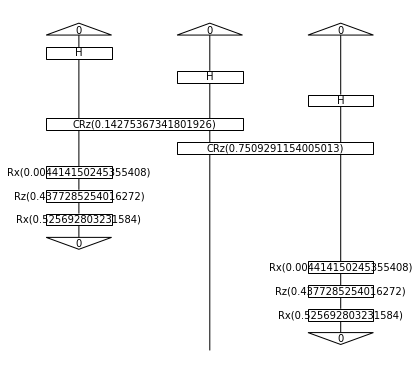

woman grieves man.
grieves >> woman @ Id(s @ n.l) >> Id(s) @ man


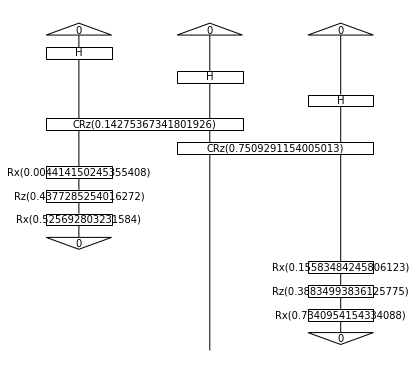

woman grieves kid.
grieves >> woman @ Id(s @ n.l) >> Id(s) @ kid


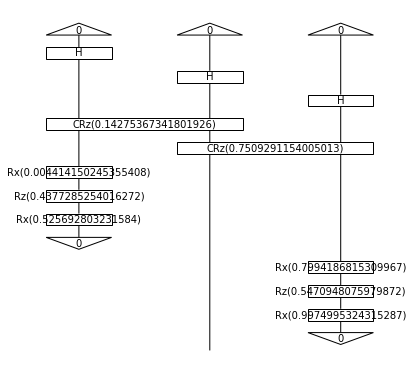

woman entertains woman.
entertains >> woman @ Id(s @ n.l) >> Id(s) @ woman


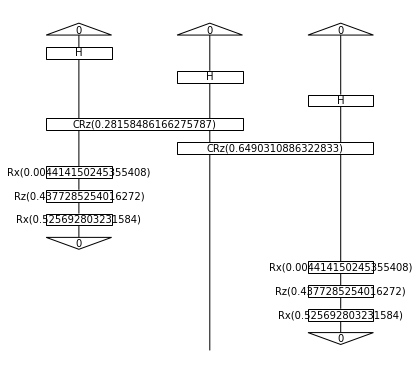

woman entertains man.
entertains >> woman @ Id(s @ n.l) >> Id(s) @ man


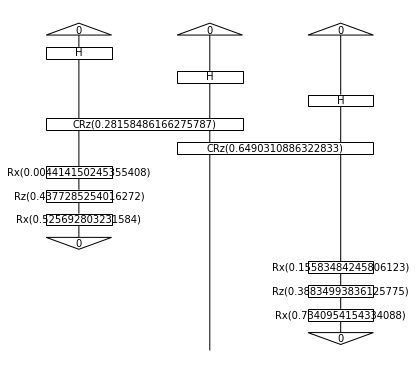

woman entertains kid.
entertains >> woman @ Id(s @ n.l) >> Id(s) @ kid


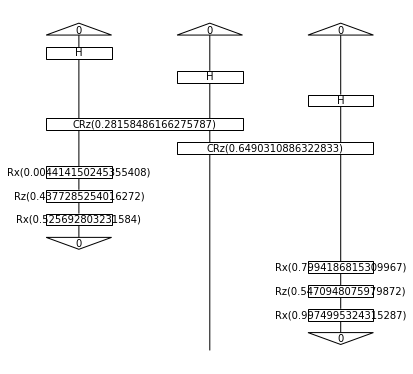

woman irritates woman.
irritates >> woman @ Id(s @ n.l) >> Id(s) @ woman


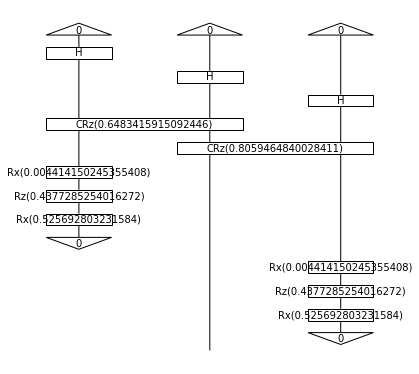

woman irritates man.
irritates >> woman @ Id(s @ n.l) >> Id(s) @ man


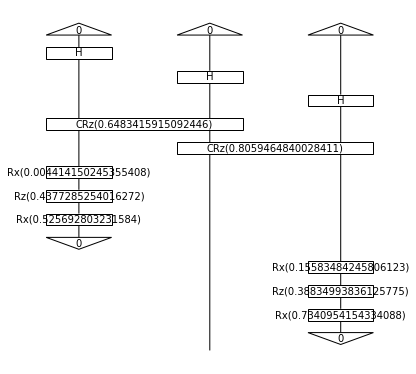

woman irritates kid.
irritates >> woman @ Id(s @ n.l) >> Id(s) @ kid


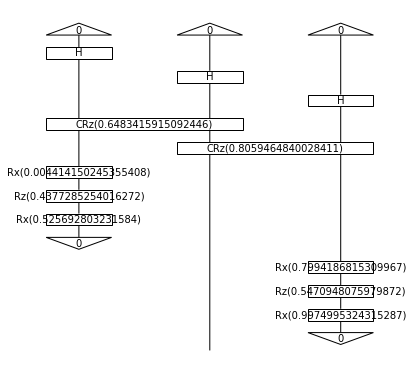

man startles woman.
startles >> man @ Id(s @ n.l) >> Id(s) @ woman


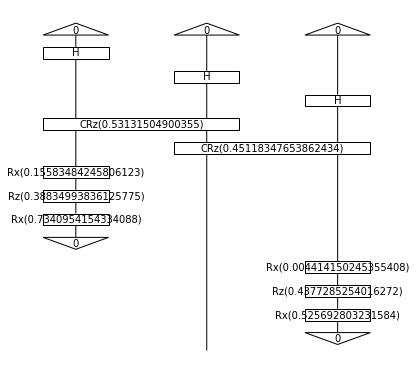

man startles man.
startles >> man @ Id(s @ n.l) >> Id(s) @ man


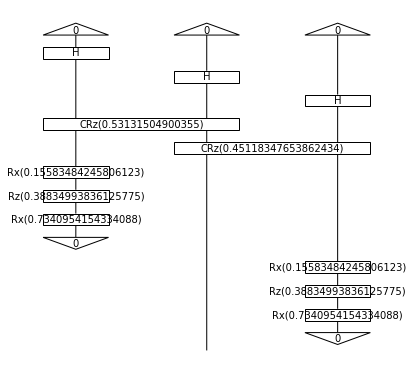

man startles kid.
startles >> man @ Id(s @ n.l) >> Id(s) @ kid


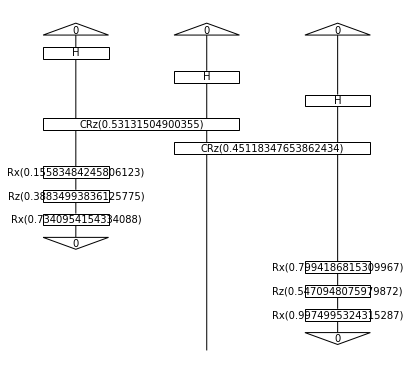

man grieves woman.
grieves >> man @ Id(s @ n.l) >> Id(s) @ woman


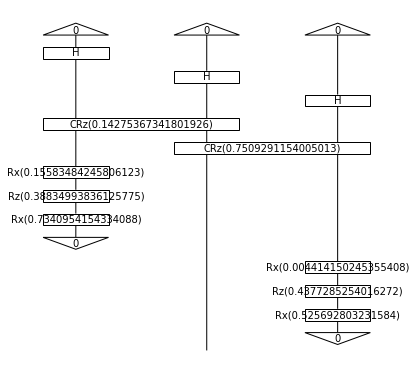

man grieves man.
grieves >> man @ Id(s @ n.l) >> Id(s) @ man


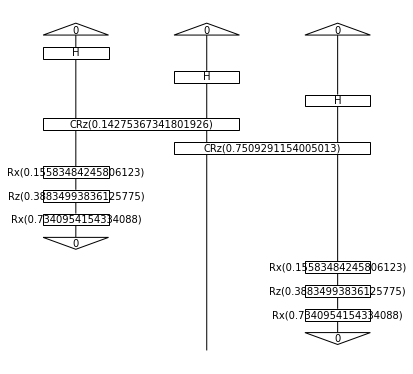

man grieves kid.
grieves >> man @ Id(s @ n.l) >> Id(s) @ kid


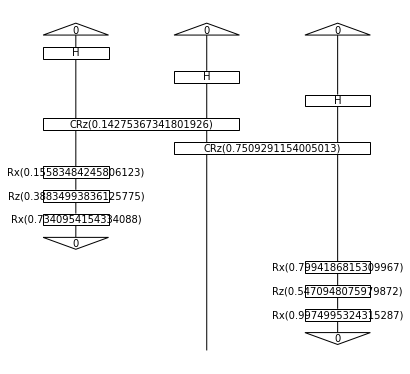

man entertains woman.
entertains >> man @ Id(s @ n.l) >> Id(s) @ woman


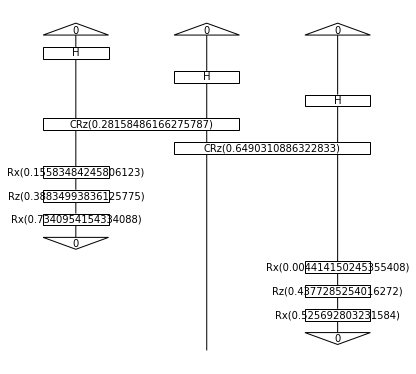

man entertains man.
entertains >> man @ Id(s @ n.l) >> Id(s) @ man


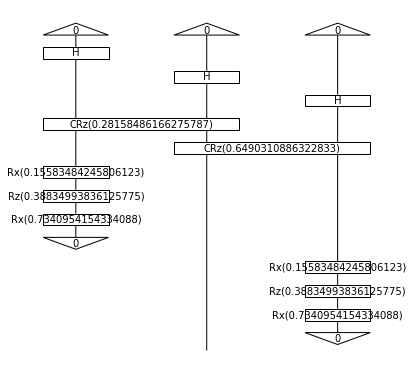

man entertains kid.
entertains >> man @ Id(s @ n.l) >> Id(s) @ kid


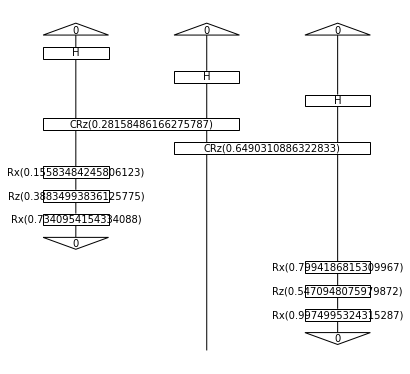

man irritates woman.
irritates >> man @ Id(s @ n.l) >> Id(s) @ woman


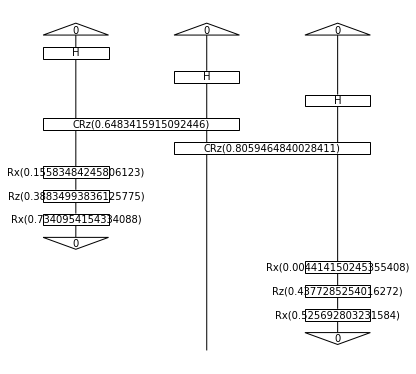

man irritates man.
irritates >> man @ Id(s @ n.l) >> Id(s) @ man


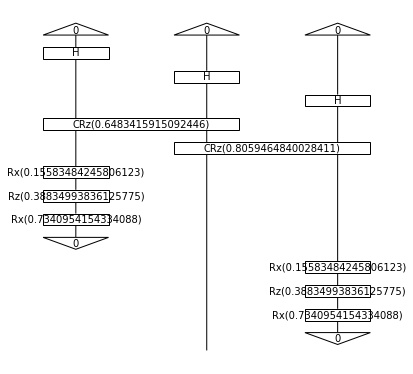

man irritates kid.
irritates >> man @ Id(s @ n.l) >> Id(s) @ kid


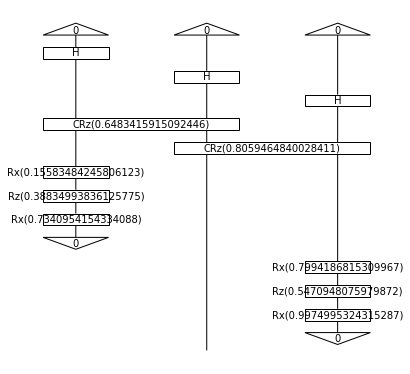

kid startles woman.
startles >> kid @ Id(s @ n.l) >> Id(s) @ woman


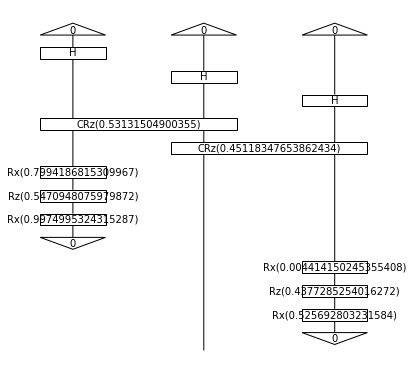

kid startles man.
startles >> kid @ Id(s @ n.l) >> Id(s) @ man


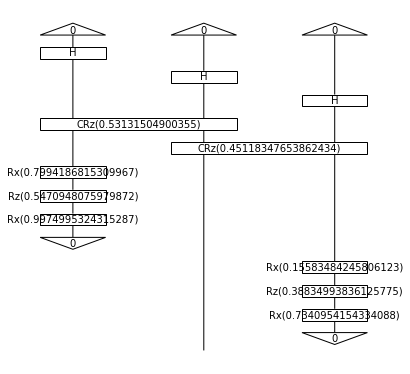

kid startles kid.
startles >> kid @ Id(s @ n.l) >> Id(s) @ kid


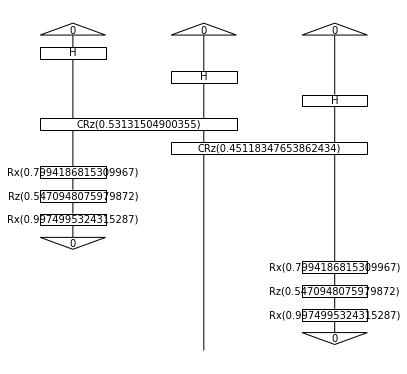

kid grieves woman.
grieves >> kid @ Id(s @ n.l) >> Id(s) @ woman


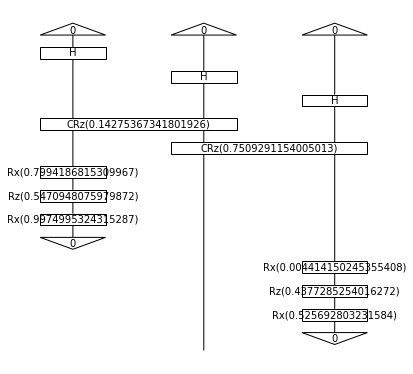

kid grieves man.
grieves >> kid @ Id(s @ n.l) >> Id(s) @ man


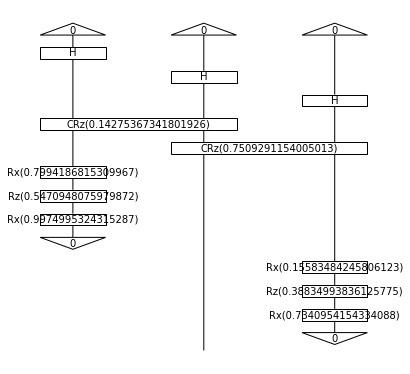

kid grieves kid.
grieves >> kid @ Id(s @ n.l) >> Id(s) @ kid


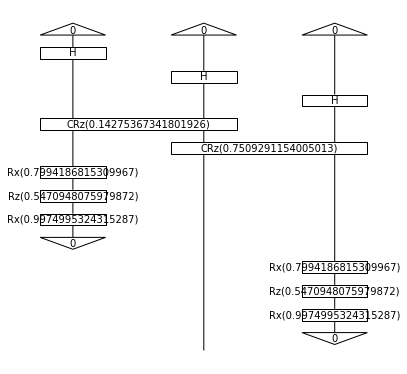

kid entertains woman.
entertains >> kid @ Id(s @ n.l) >> Id(s) @ woman


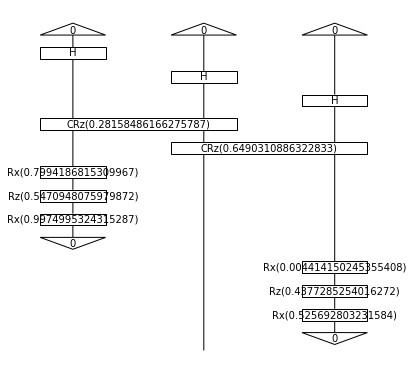

kid entertains man.
entertains >> kid @ Id(s @ n.l) >> Id(s) @ man


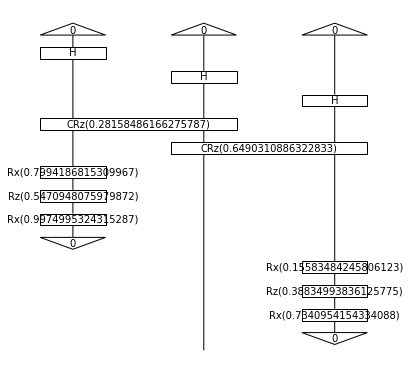

kid entertains kid.
entertains >> kid @ Id(s @ n.l) >> Id(s) @ kid


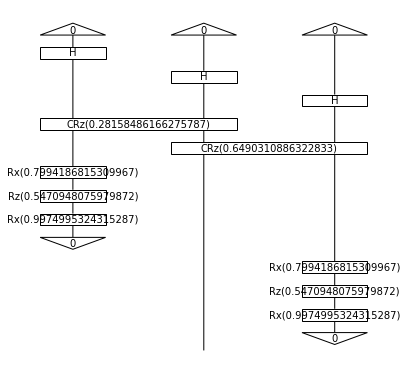

kid irritates woman.
irritates >> kid @ Id(s @ n.l) >> Id(s) @ woman


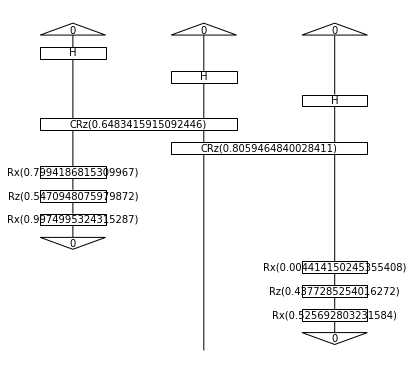

kid irritates man.
irritates >> kid @ Id(s @ n.l) >> Id(s) @ man


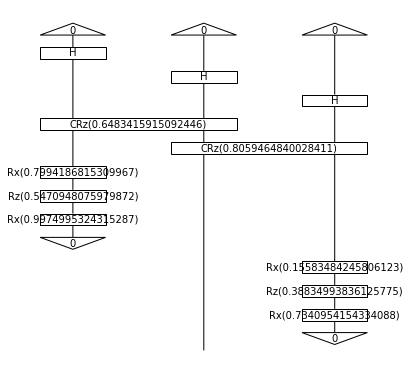

kid irritates kid.
irritates >> kid @ Id(s @ n.l) >> Id(s) @ kid


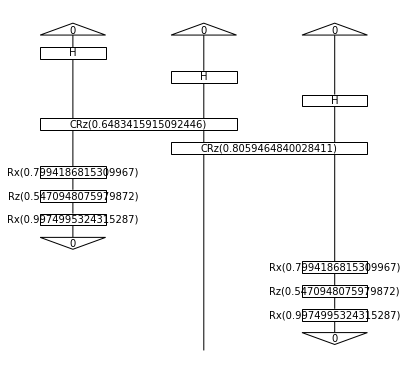

morose woman grieves woman.
morose >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


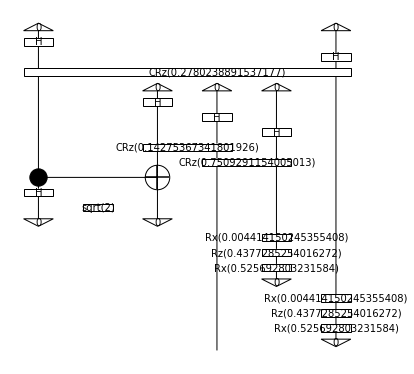

morose woman grieves man.
morose >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


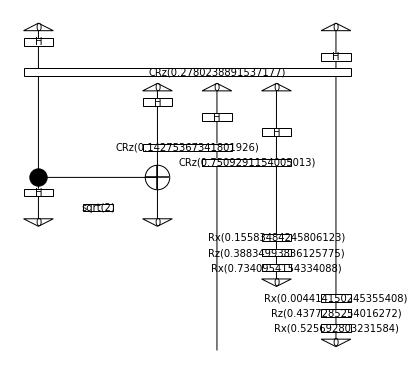

morose woman grieves kid.
morose >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


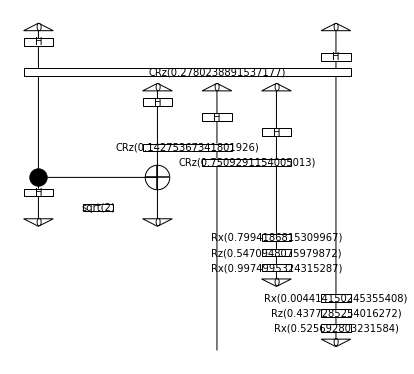

morose man grieves woman.
morose >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


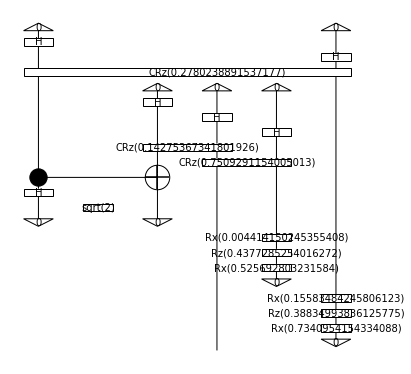

morose man grieves man.
morose >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


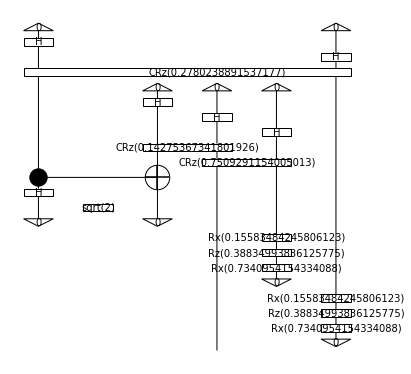

morose man grieves kid.
morose >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


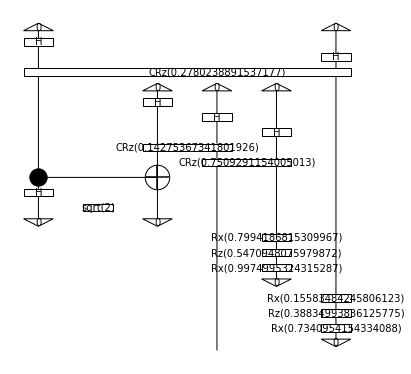

morose kid grieves woman.
morose >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


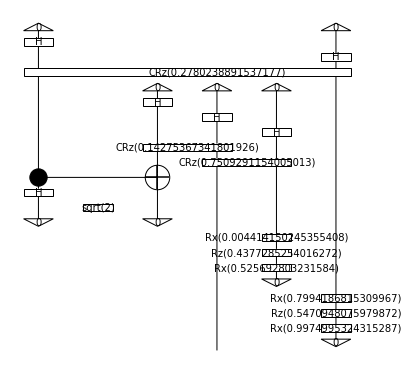

morose kid grieves man.
morose >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


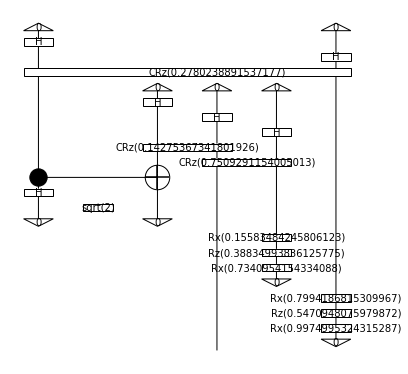

morose kid grieves kid.
morose >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


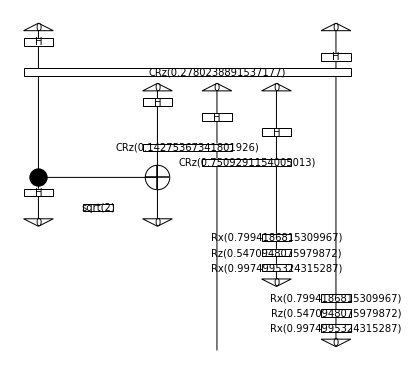

irascible woman irritates woman.
irascible >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


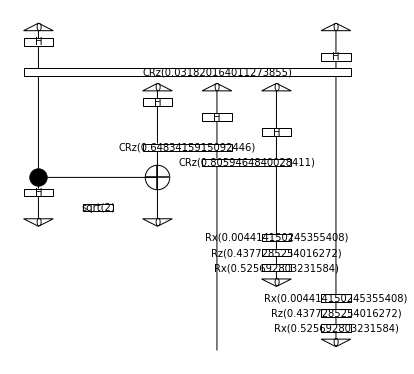

irascible woman irritates man.
irascible >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


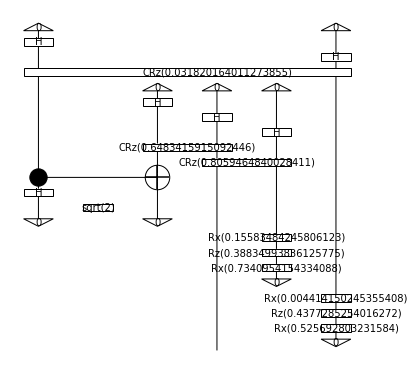

irascible woman irritates kid.
irascible >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


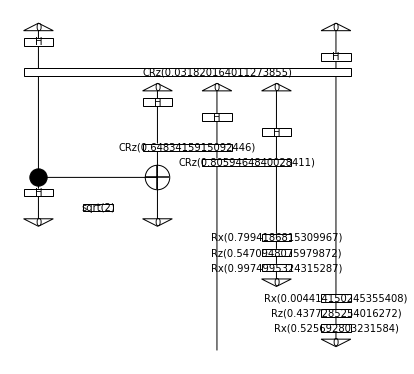

irascible man irritates woman.
irascible >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


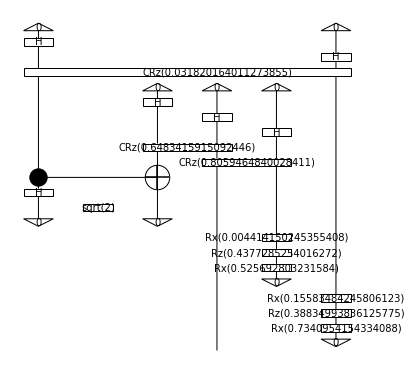

irascible man irritates man.
irascible >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


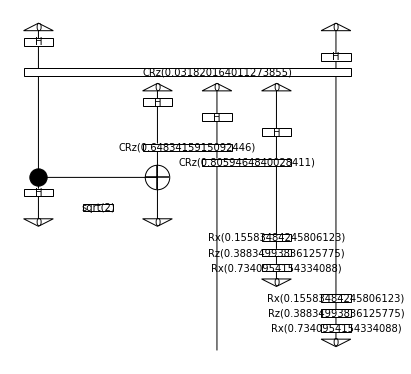

irascible man irritates kid.
irascible >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


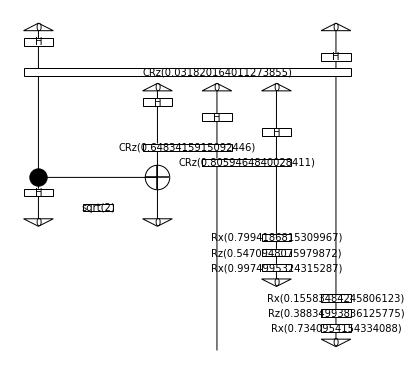

irascible kid irritates woman.
irascible >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


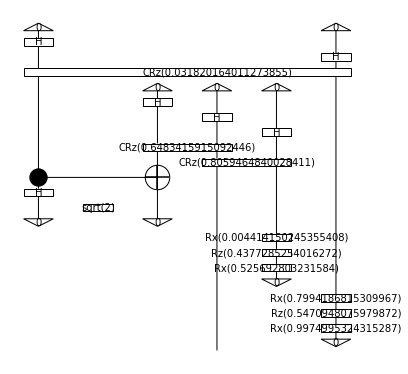

irascible kid irritates man.
irascible >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


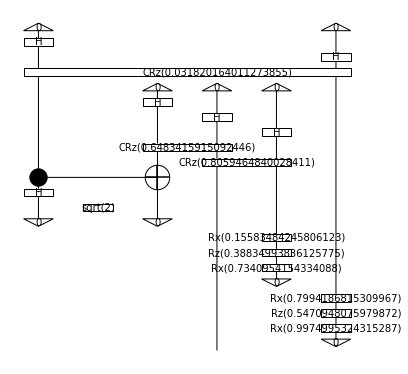

irascible kid irritates kid.
irascible >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


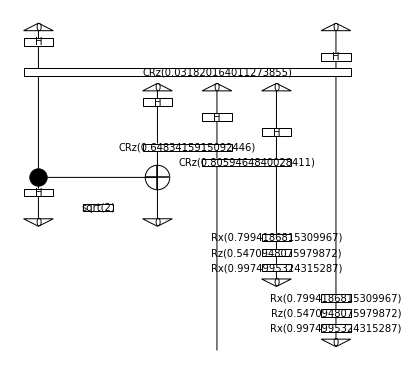

frightened woman startles woman.
frightened >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


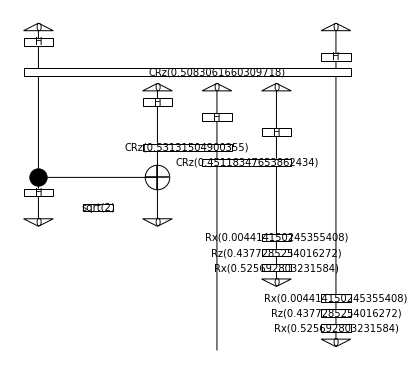

frightened woman startles man.
frightened >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


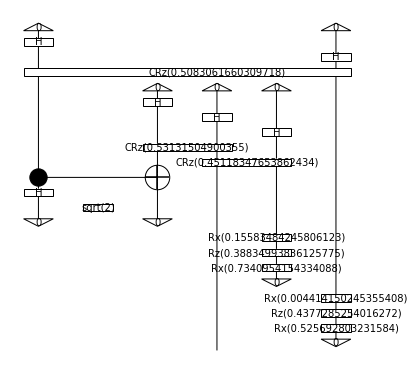

frightened woman startles kid.
frightened >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


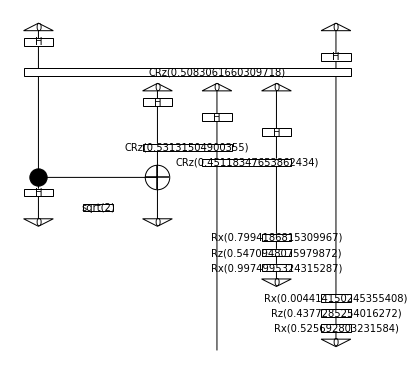

frightened man startles woman.
frightened >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


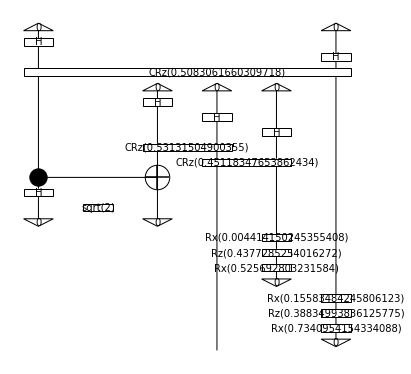

frightened man startles man.
frightened >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


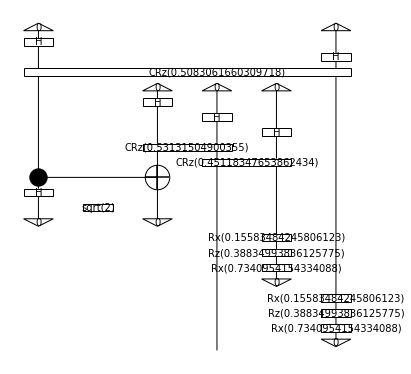

frightened man startles kid.
frightened >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


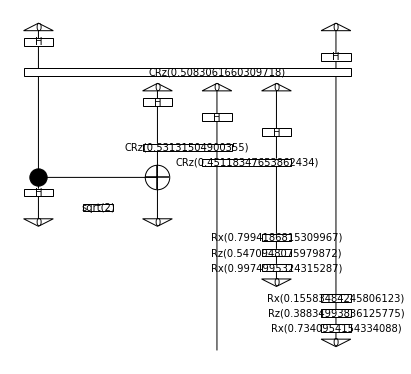

frightened kid startles woman.
frightened >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


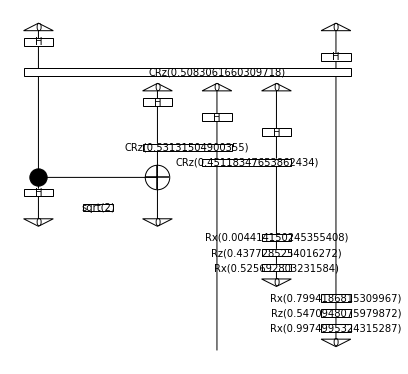

frightened kid startles man.
frightened >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


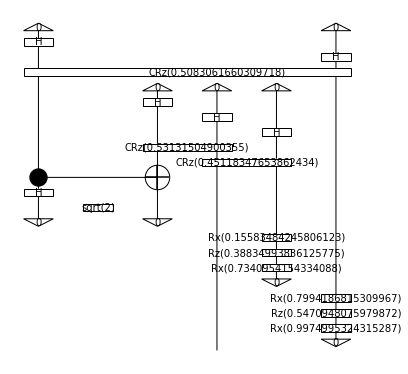

frightened kid startles kid.
frightened >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


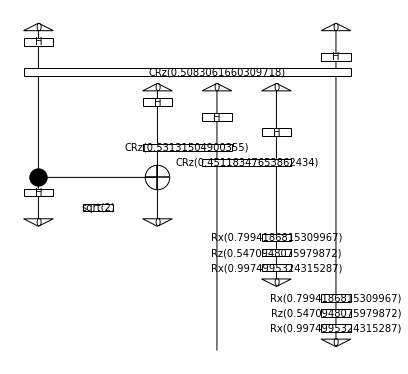

cheerful woman entertains woman.
cheerful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


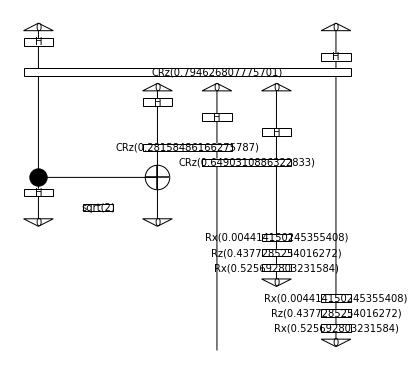

cheerful woman entertains man.
cheerful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


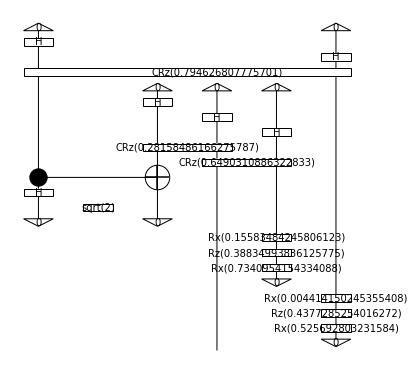

cheerful woman entertains kid.
cheerful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


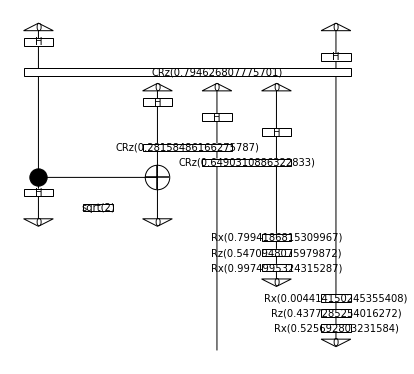

cheerful man entertains woman.
cheerful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


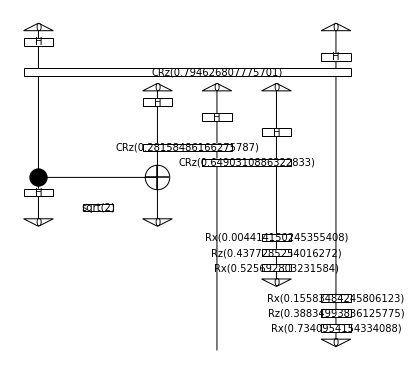

cheerful man entertains man.
cheerful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


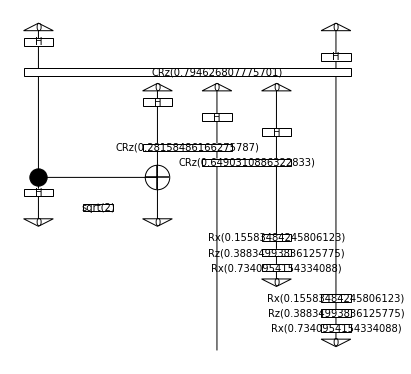

cheerful man entertains kid.
cheerful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


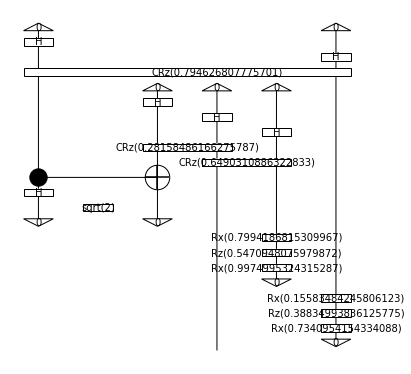

cheerful kid entertains woman.
cheerful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


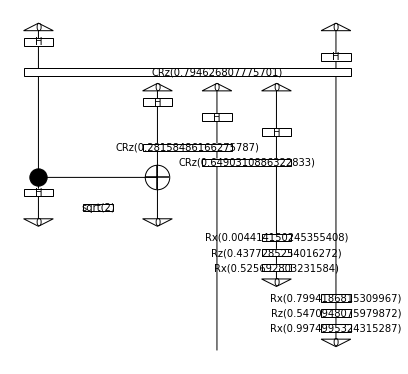

cheerful kid entertains man.
cheerful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


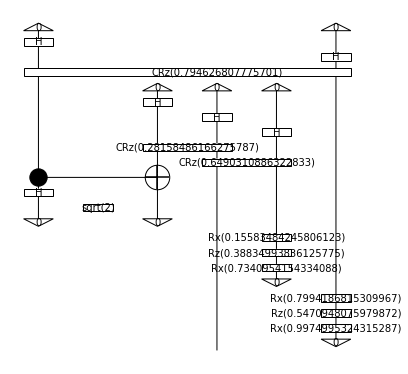

cheerful kid entertains kid.
cheerful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


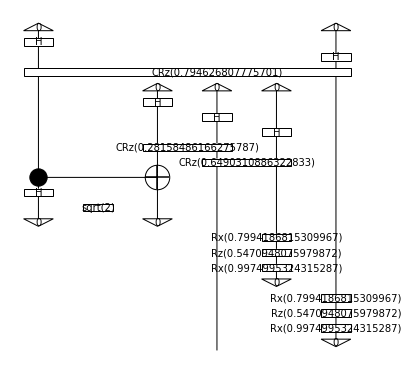

joyful woman entertains woman.
joyful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


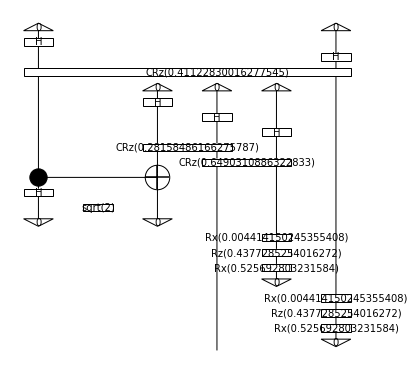

joyful woman entertains man.
joyful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


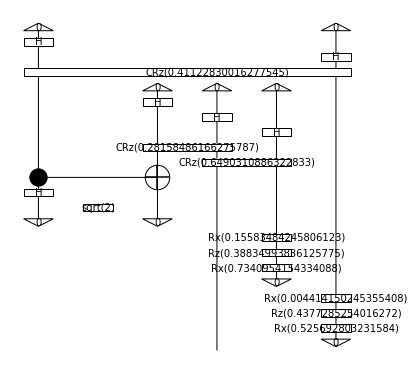

joyful woman entertains kid.
joyful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


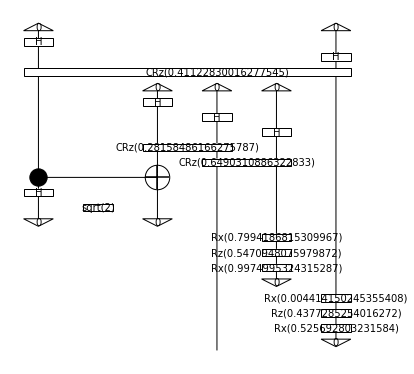

joyful man entertains woman.
joyful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


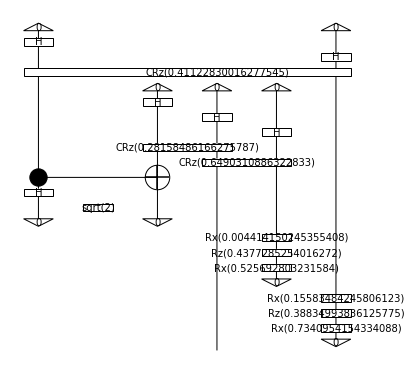

joyful man entertains man.
joyful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


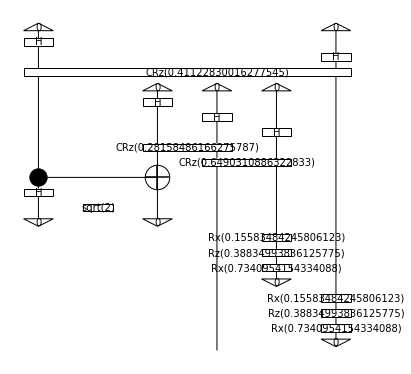

joyful man entertains kid.
joyful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


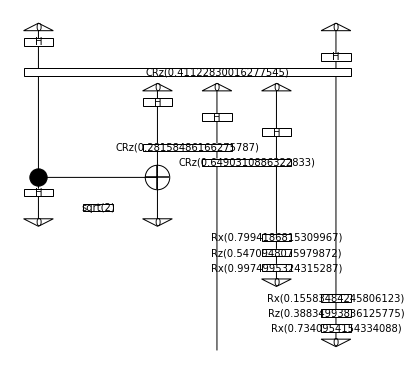

joyful kid entertains woman.
joyful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


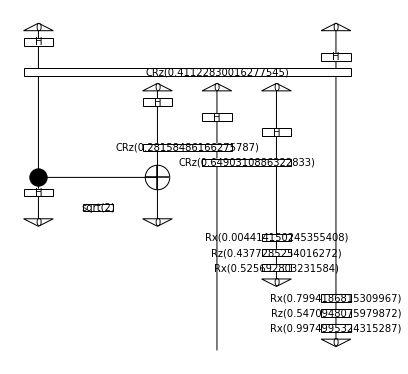

joyful kid entertains man.
joyful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


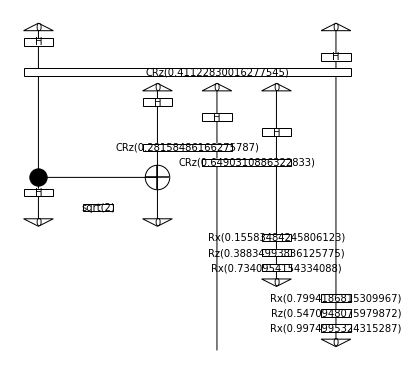

joyful kid entertains kid.
joyful >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


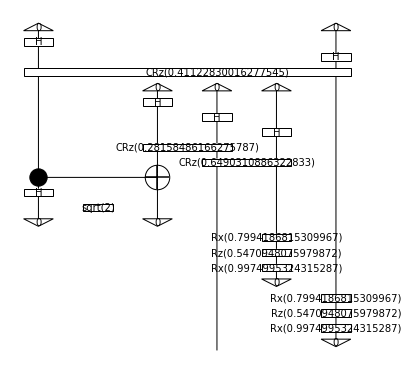

gloomy woman grieves woman.
gloomy >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


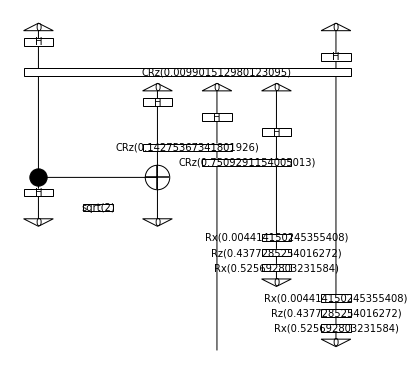

gloomy woman grieves man.
gloomy >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


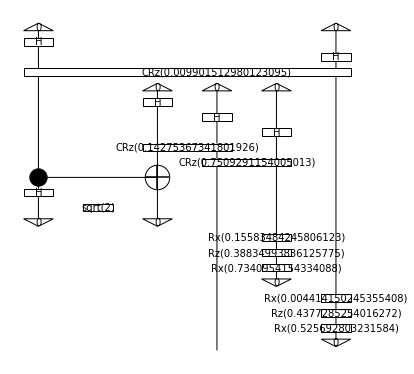

gloomy woman grieves kid.
gloomy >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


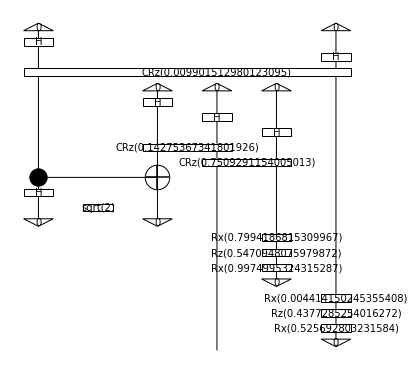

gloomy man grieves woman.
gloomy >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


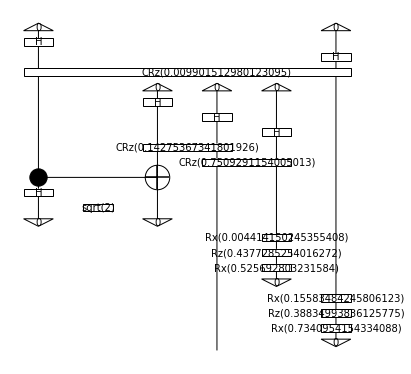

gloomy man grieves man.
gloomy >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


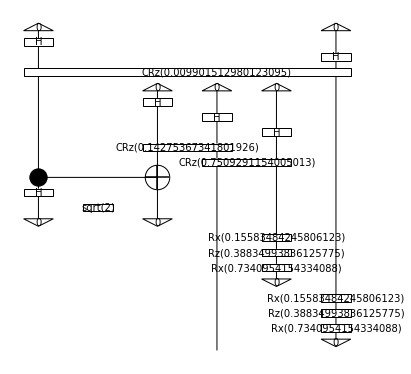

gloomy man grieves kid.
gloomy >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


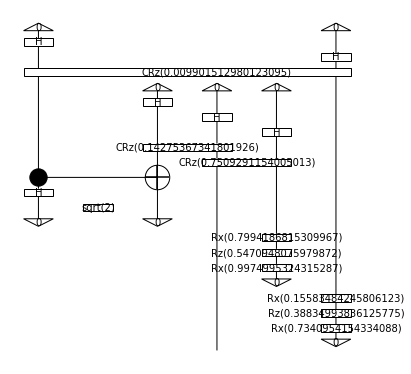

gloomy kid grieves woman.
gloomy >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


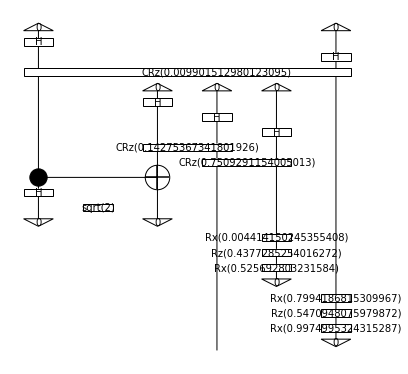

gloomy kid grieves man.
gloomy >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


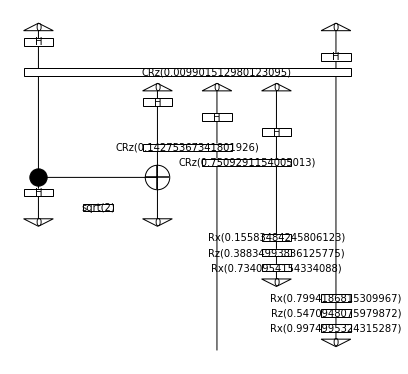

gloomy kid grieves kid.
gloomy >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


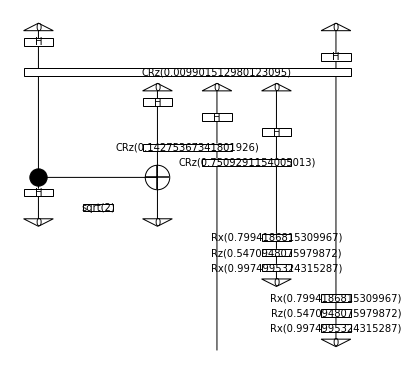

downcast man grieves man.
downcast >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


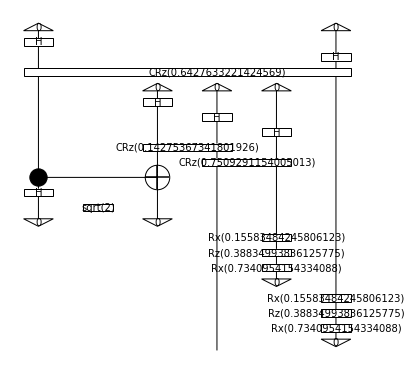

downcast man grieves woman.
downcast >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


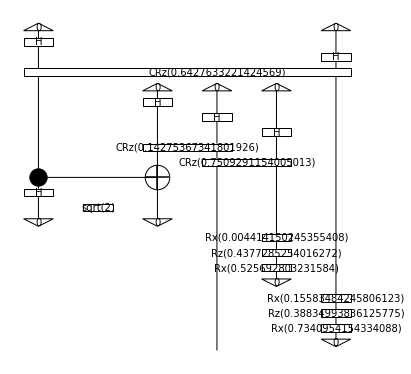

downcast man grieves kid.
downcast >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


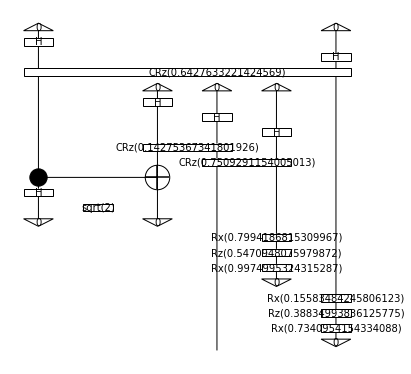

downcast woman grieves man.
downcast >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


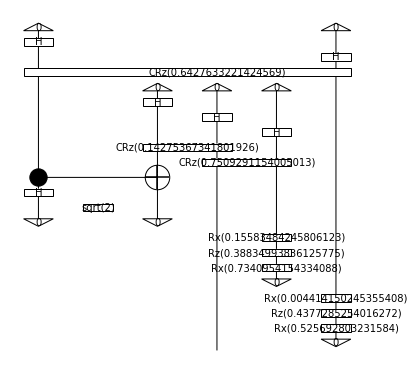

downcast woman grieves woman.
downcast >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


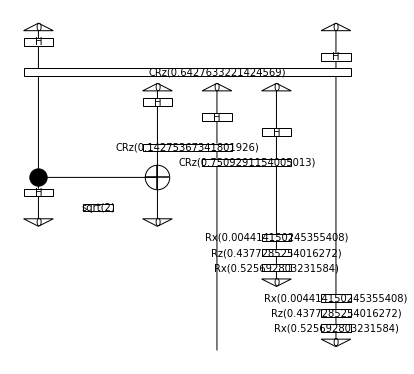

downcast woman grieves kid.
downcast >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


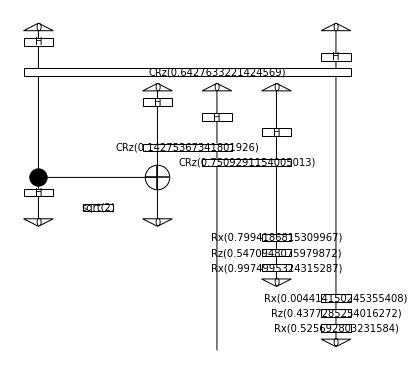

downcast kid grieves man.
downcast >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


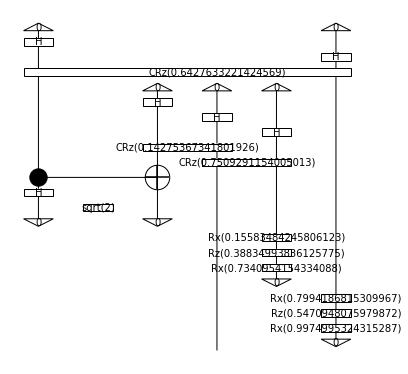

downcast kid grieves woman.
downcast >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


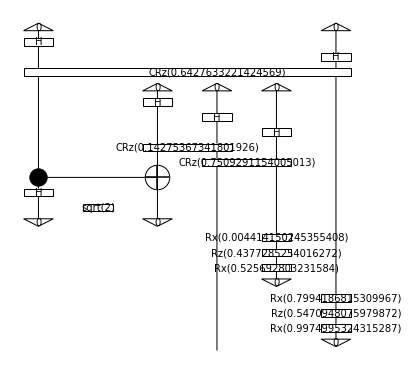

downcast kid grieves kid.
downcast >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


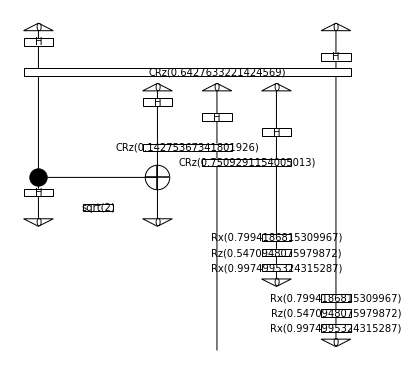

miserable man grieves man.
miserable >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


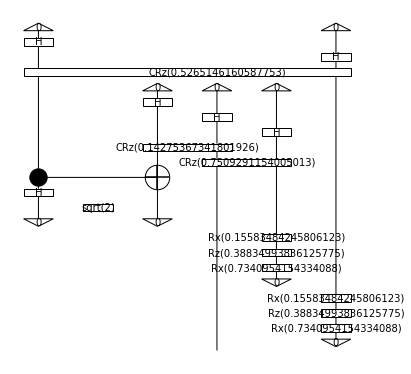

miserable man grieves woman.
miserable >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


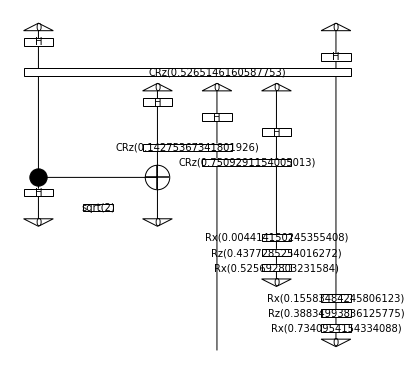

miserable man grieves kid.
miserable >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


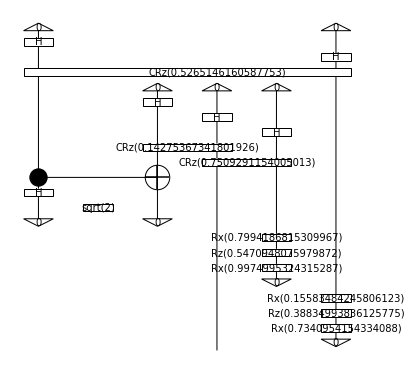

miserable woman grieves man.
miserable >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


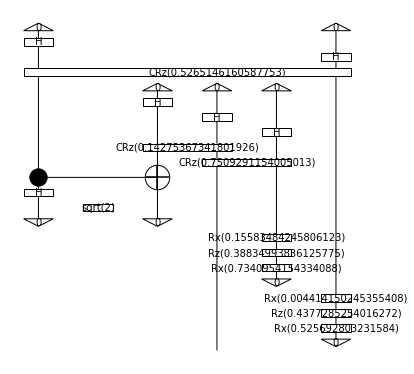

miserable woman grieves woman.
miserable >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


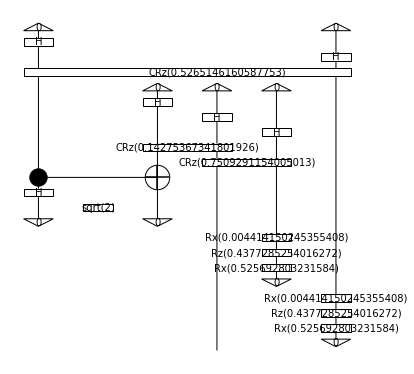

miserable woman grieves kid.
miserable >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


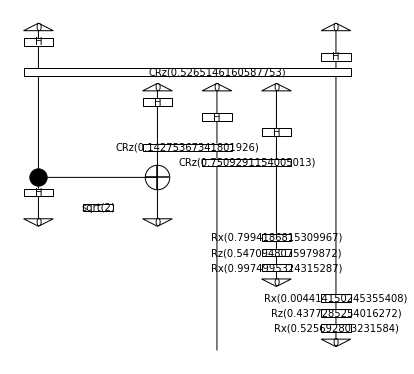

miserable kid grieves man.
miserable >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


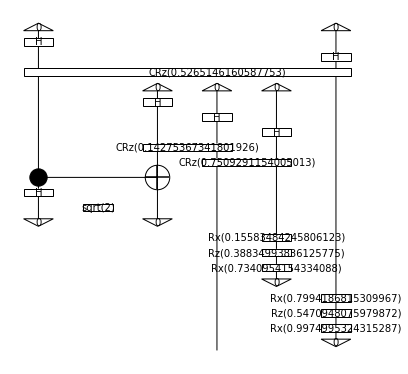

miserable kid grieves woman.
miserable >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


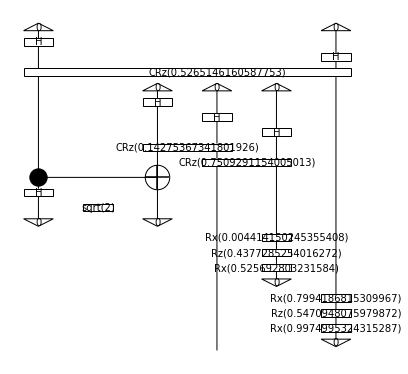

miserable kid grieves kid.
miserable >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


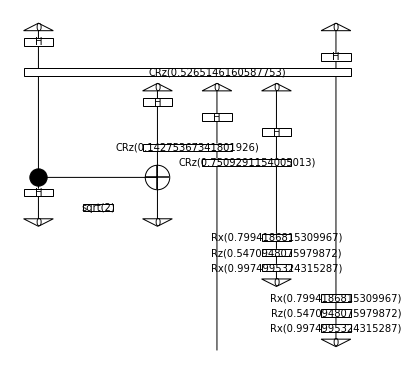

furious woman irritates woman.
furious >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


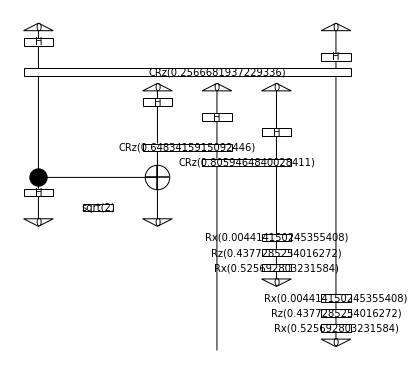

furious woman irritates man.
furious >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


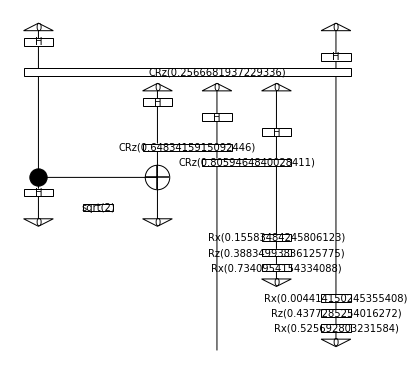

furious woman irritates kid.
furious >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


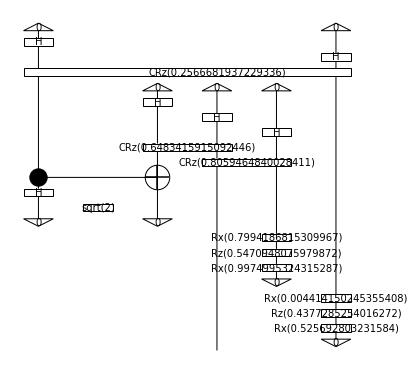

furious man irritates woman.
furious >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


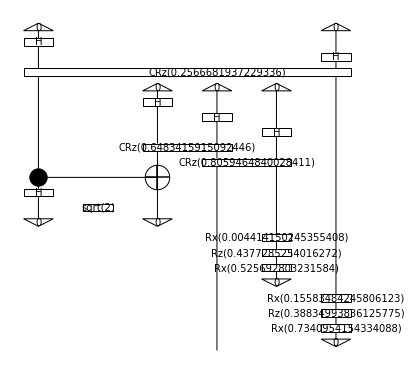

furious man irritates man.
furious >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


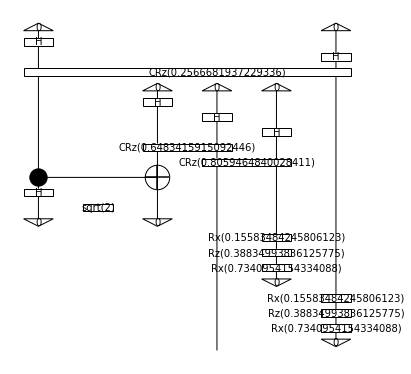

furious man irritates kid.
furious >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


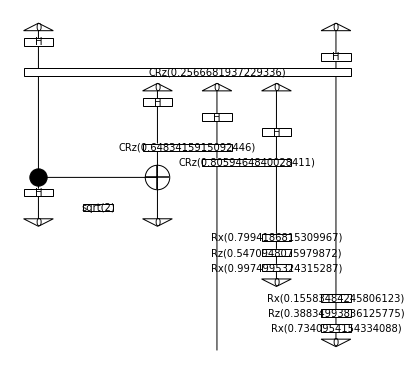

furious kid irritates woman.
furious >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


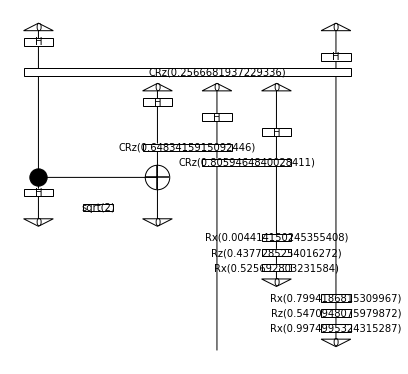

furious kid irritates man.
furious >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


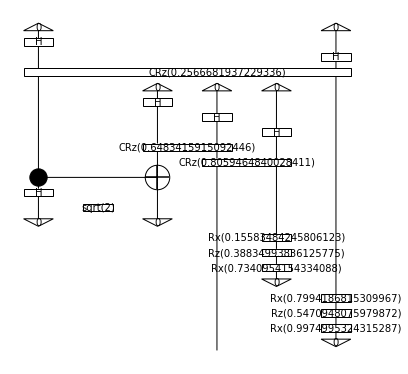

furious kid irritates kid.
furious >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


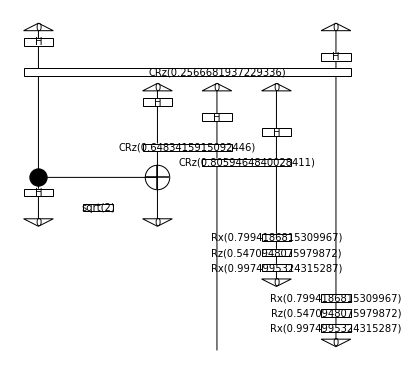

terrified woman startles woman.
terrified >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


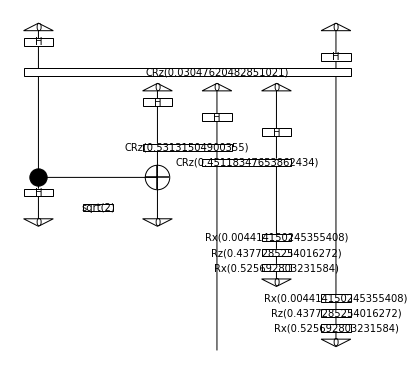

terrified woman startles man.
terrified >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


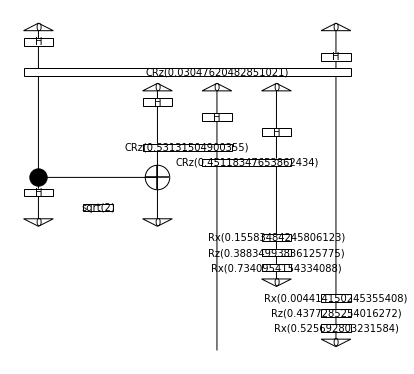

terrified woman startles kid.
terrified >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


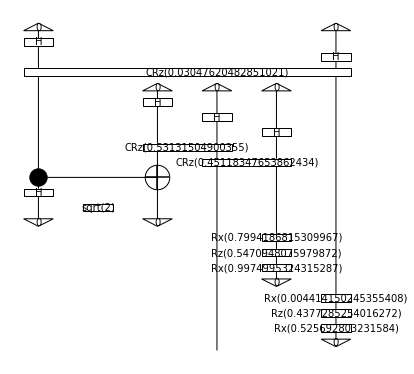

terrified man startles woman.
terrified >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


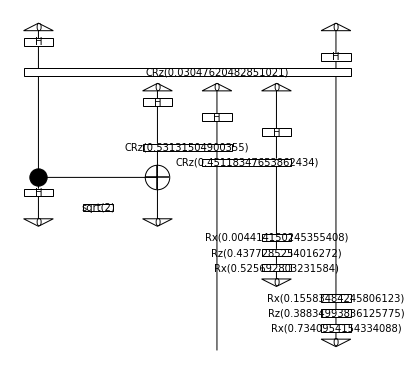

terrified man startles man.
terrified >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


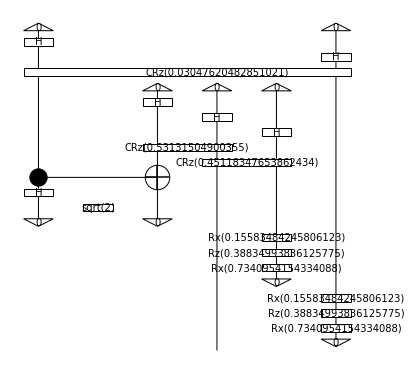

terrified man startles kid.
terrified >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


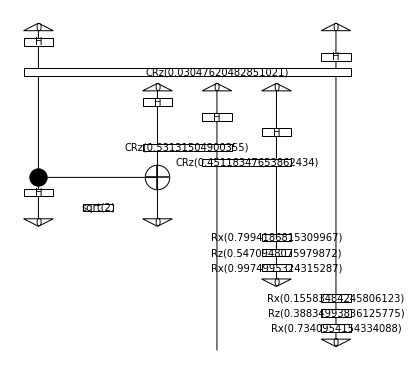

terrified kid startles woman.
terrified >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


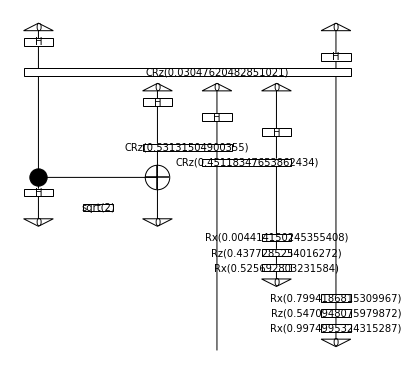

terrified kid startles man.
terrified >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


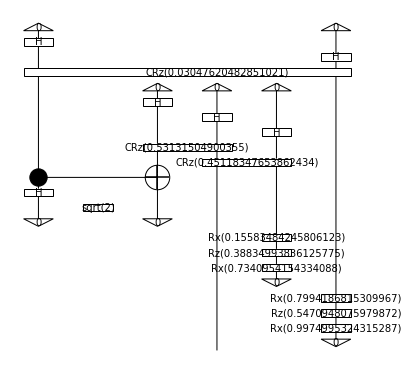

terrified kid startles kid.
terrified >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


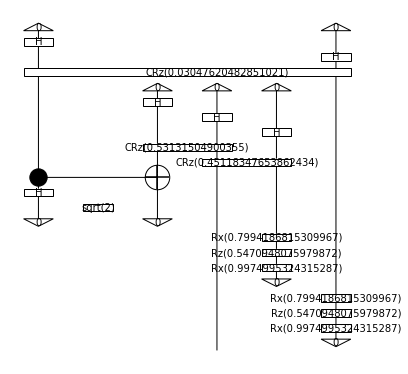

old woman startles woman.
old >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


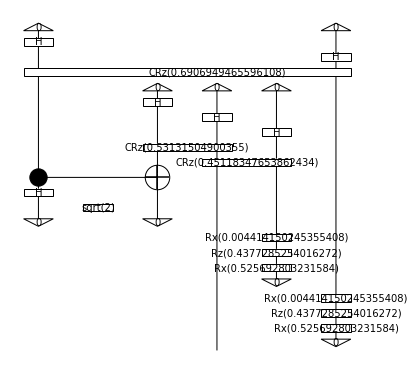

old woman startles man.
old >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


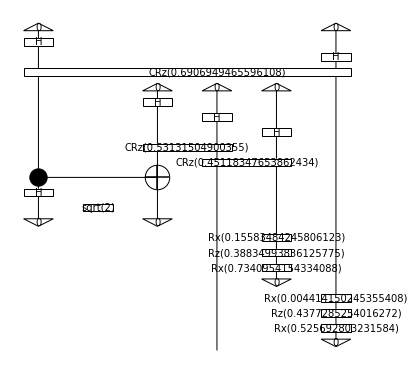

old woman startles kid.
old >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


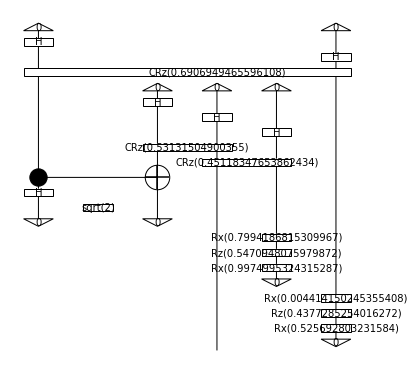

old woman grieves woman.
old >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


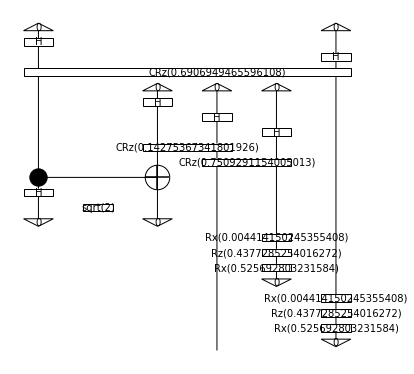

old woman grieves man.
old >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


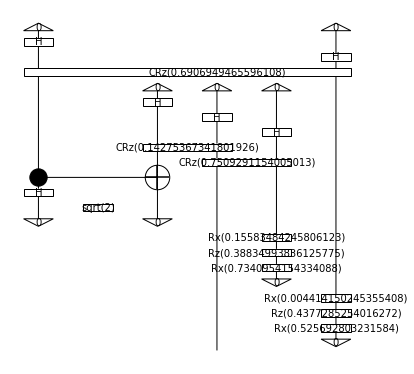

old woman grieves kid.
old >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


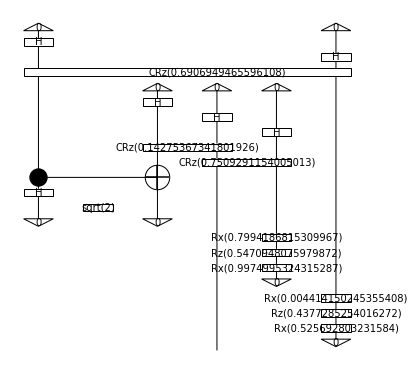

old woman entertains woman.
old >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


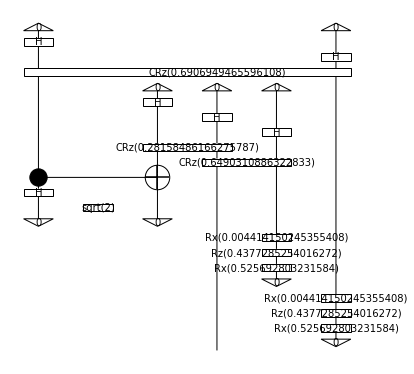

old woman entertains man.
old >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


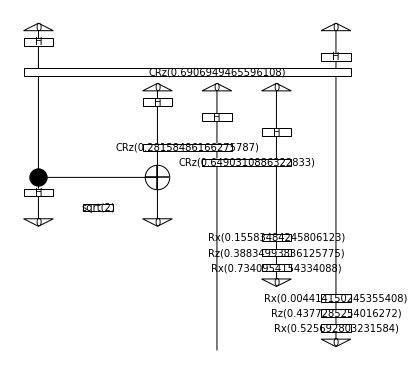

old woman entertains kid.
old >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


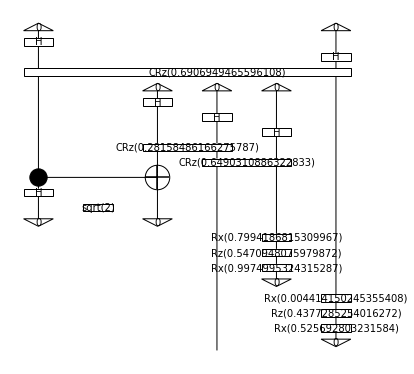

old woman irritates woman.
old >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


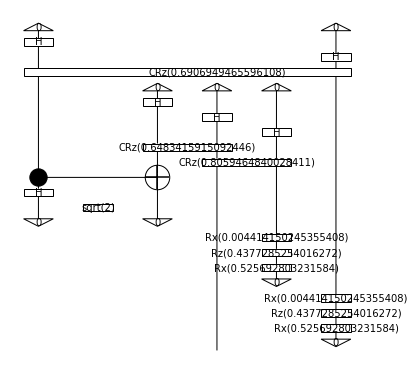

old woman irritates man.
old >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


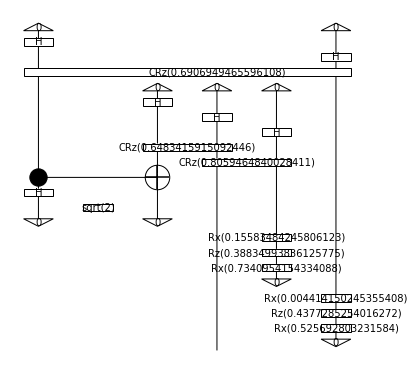

old woman irritates kid.
old >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


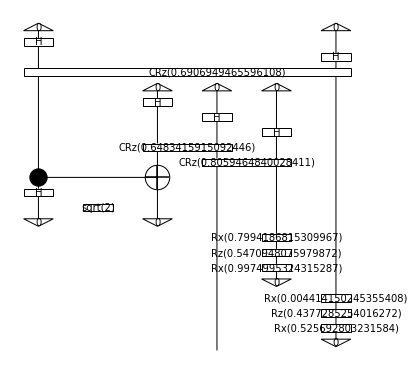

old man startles woman.
old >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


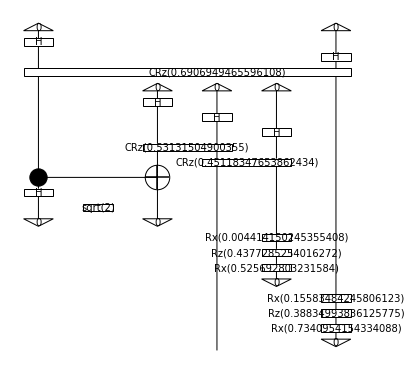

old man startles man.
old >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


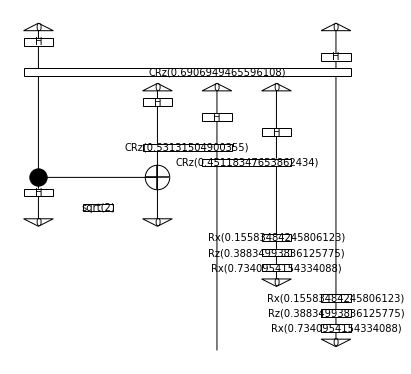

old man startles kid.
old >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


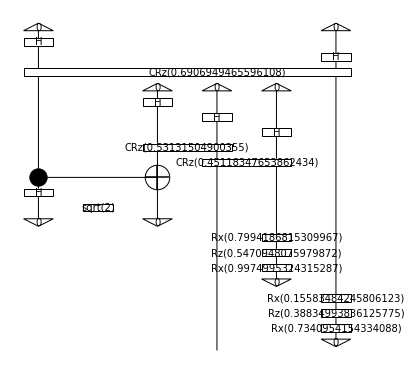

old man grieves woman.
old >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


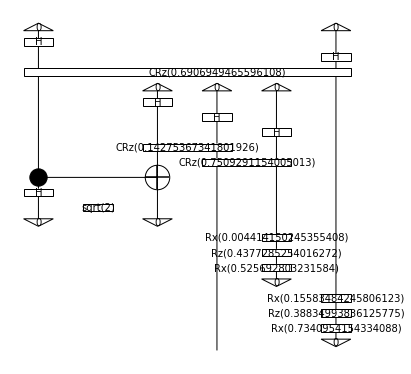

old man grieves man.
old >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


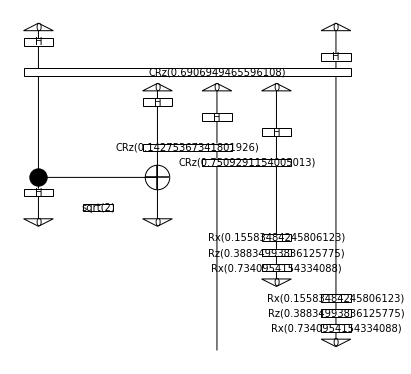

old man grieves kid.
old >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


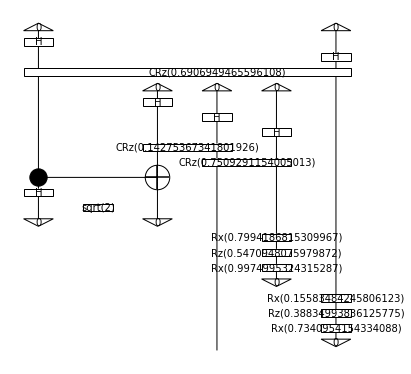

old man entertains woman.
old >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


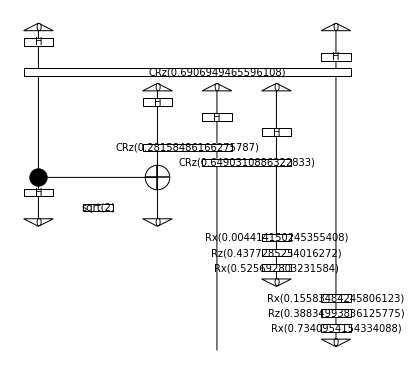

old man entertains man.
old >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


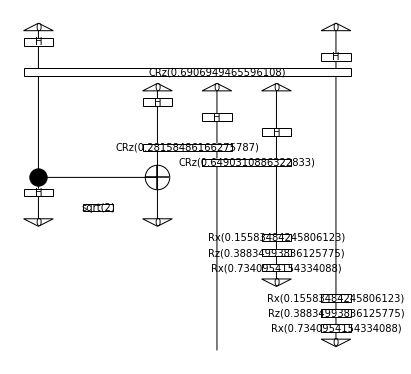

old man entertains kid.
old >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


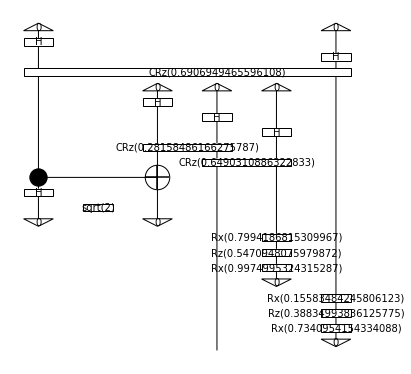

old man irritates woman.
old >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


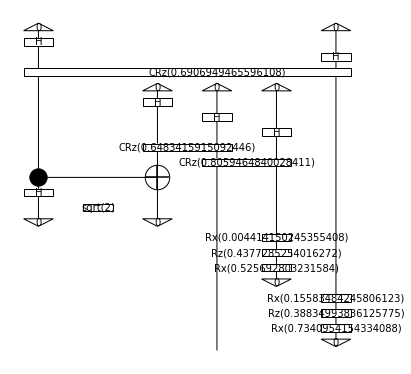

old man irritates man.
old >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


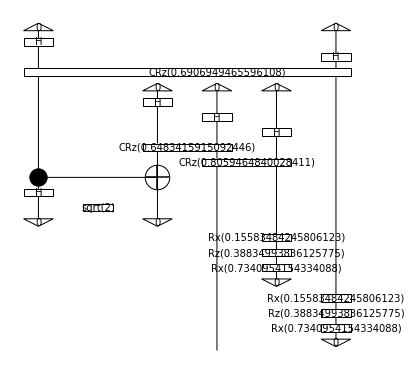

old man irritates kid.
old >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


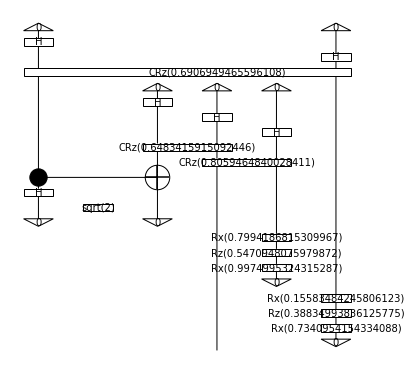

young woman startles woman.
young >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


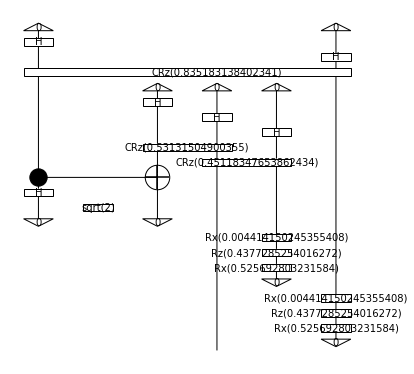

young woman startles man.
young >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


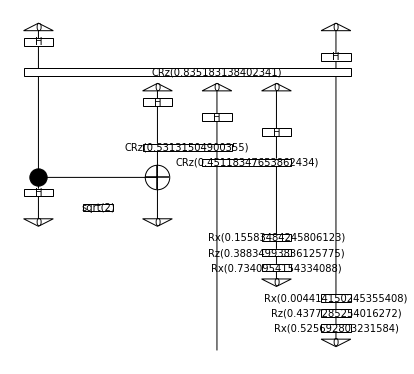

young woman startles kid.
young >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


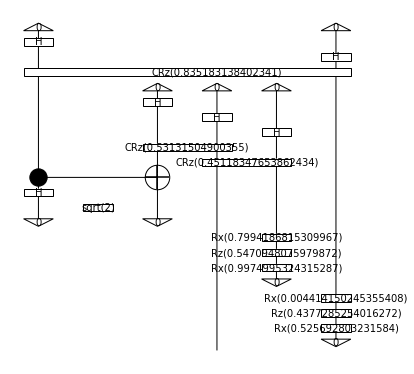

young woman grieves woman.
young >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


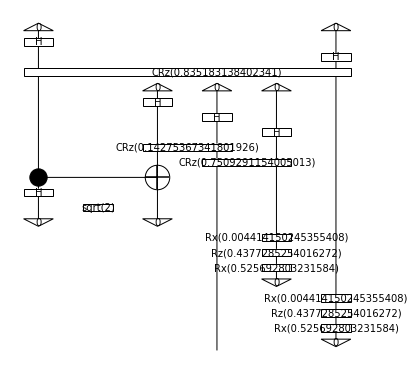

young woman grieves man.
young >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


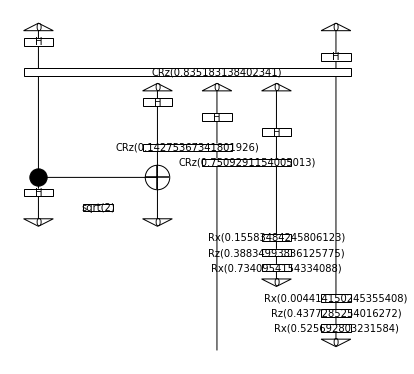

young woman grieves kid.
young >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


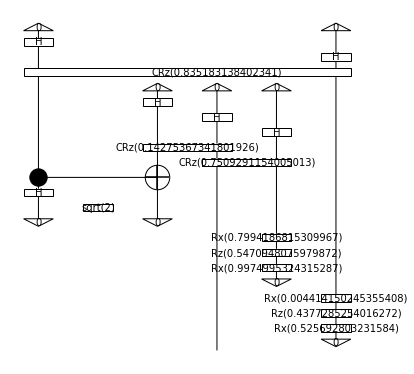

young woman entertains woman.
young >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


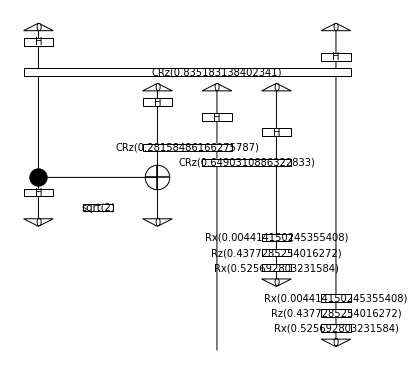

young woman entertains man.
young >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


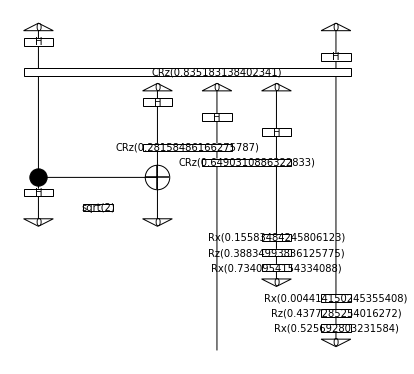

young woman entertains kid.
young >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


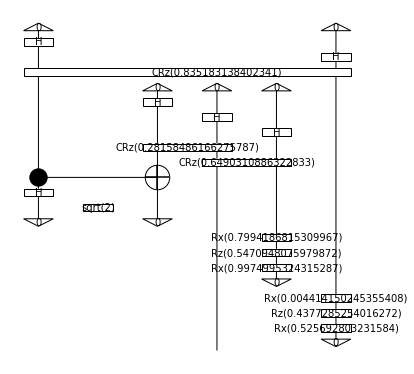

young woman irritates woman.
young >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ woman


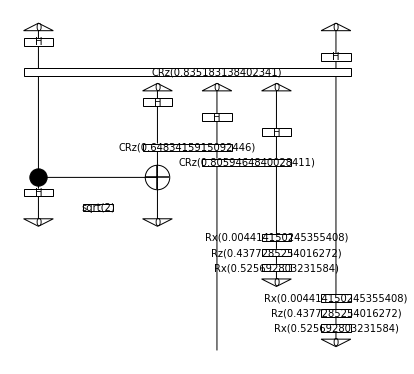

young woman irritates man.
young >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ woman


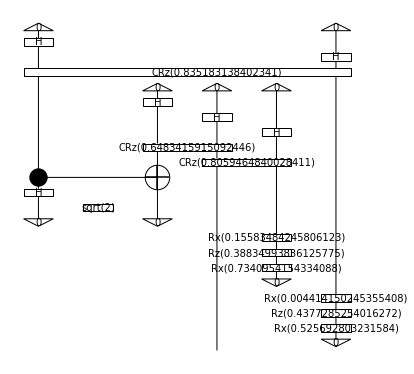

young woman irritates kid.
young >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ woman


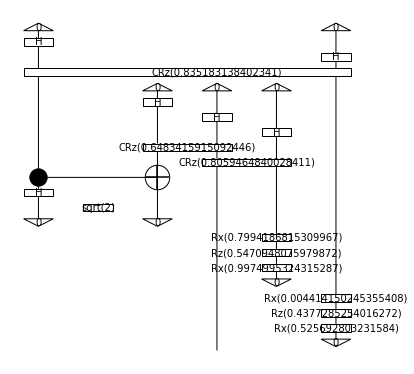

young man startles woman.
young >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


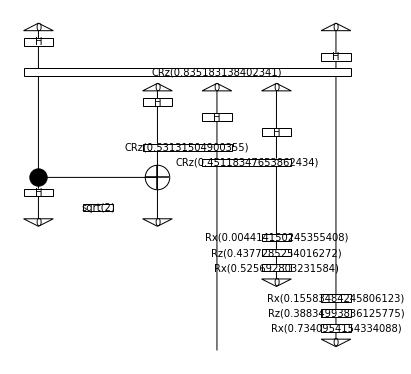

young man startles man.
young >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


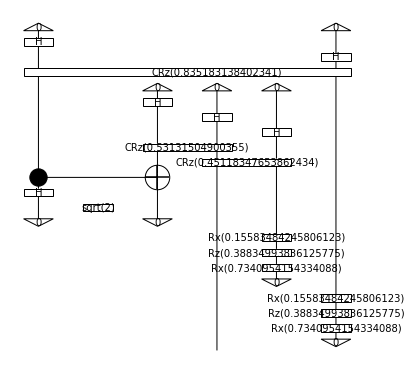

young man startles kid.
young >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


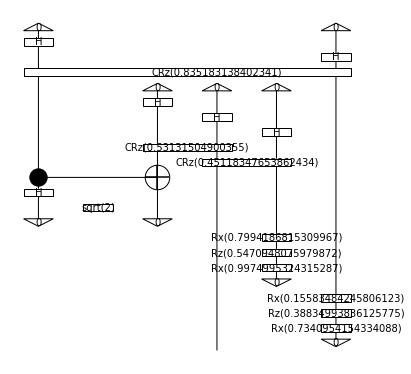

young man grieves woman.
young >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


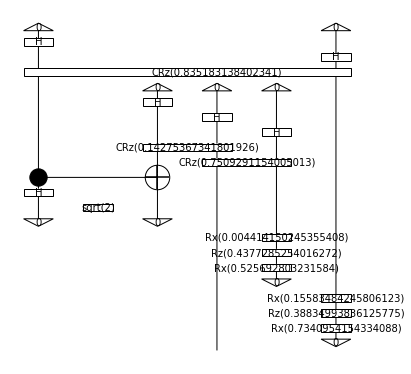

young man grieves man.
young >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


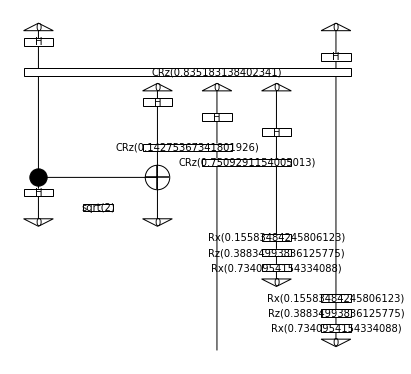

young man grieves kid.
young >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


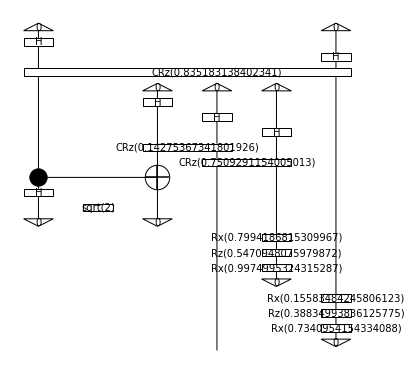

young man entertains woman.
young >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


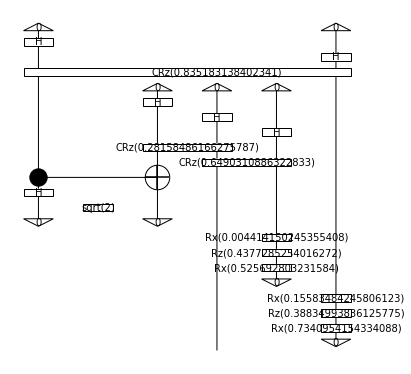

young man entertains man.
young >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


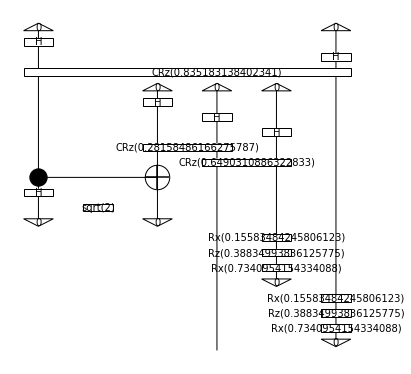

young man entertains kid.
young >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


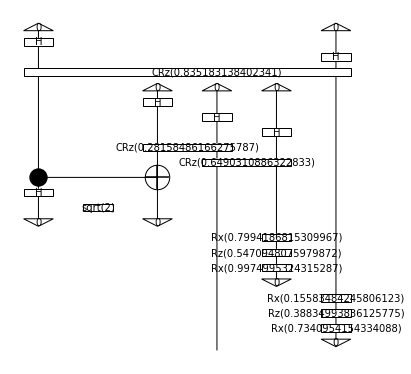

young man irritates woman.
young >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ man


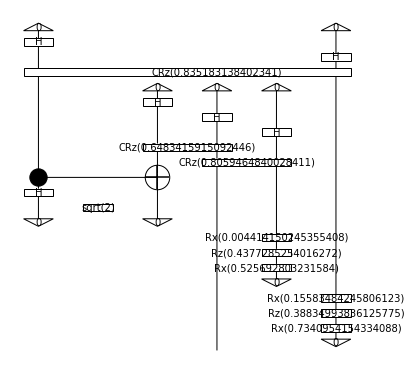

young man irritates man.
young >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ man


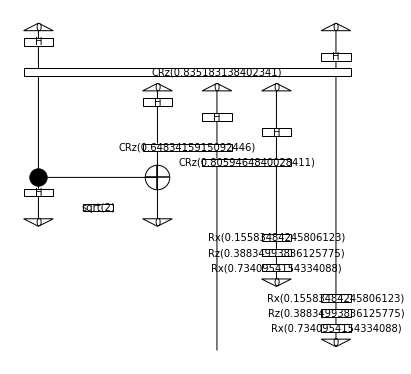

young man irritates kid.
young >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ man


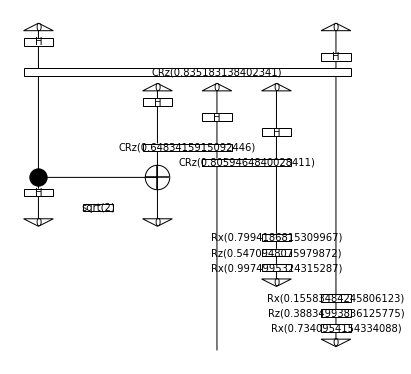

young kid grieves man.
young >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


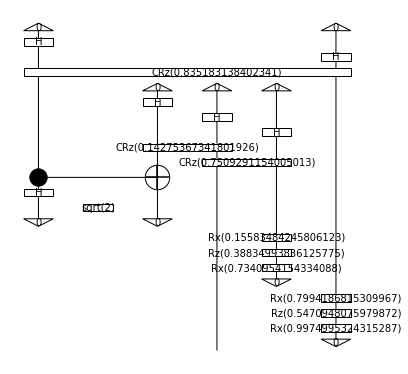

young kid grieves woman.
young >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


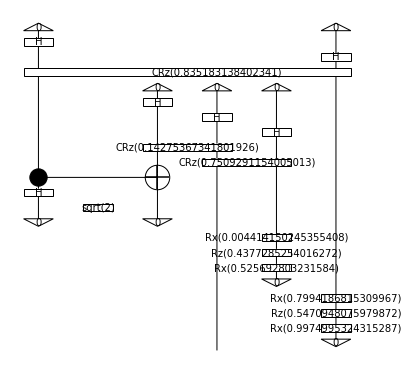

young kid grieves kid.
young >> Id(n) @ grieves @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


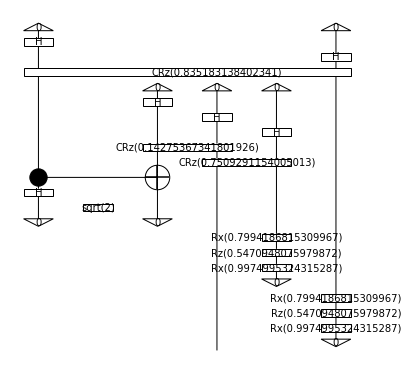

young kid startles man.
young >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


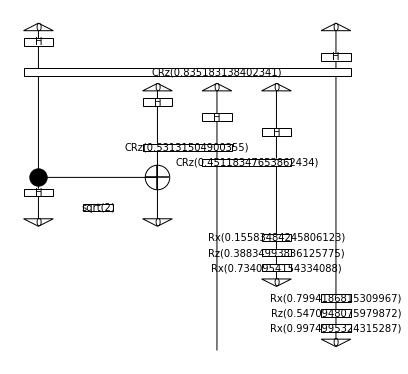

young kid startles woman.
young >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


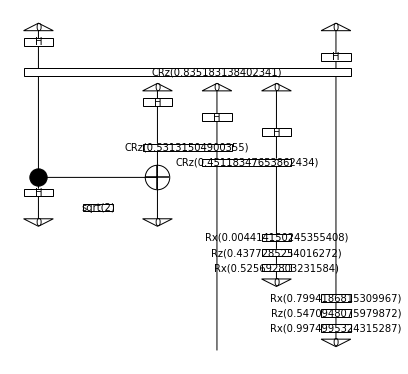

young kid startles kid.
young >> Id(n) @ startles @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


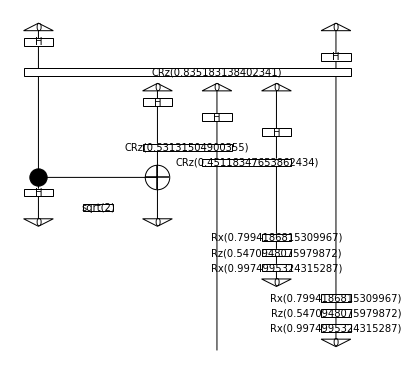

young kid entertains man.
young >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


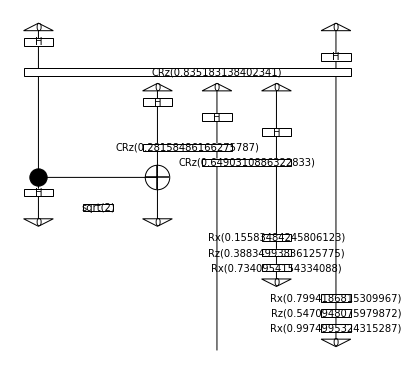

young kid entertains woman.
young >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


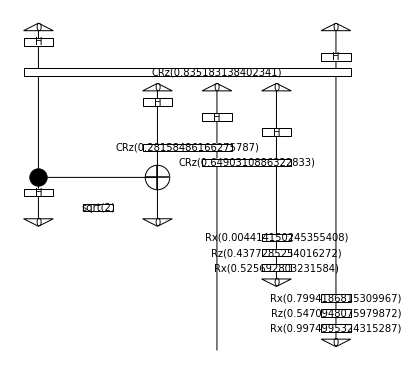

young kid entertains kid.
young >> Id(n) @ entertains @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


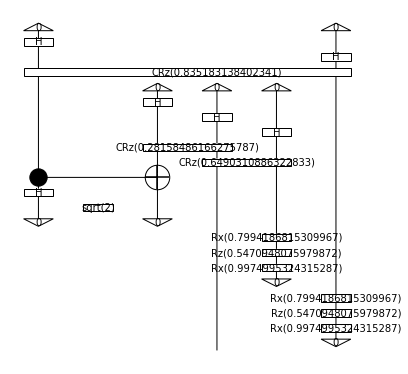

young kid irritates man.
young >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ man @ Id(n.l) >> Id(s) @ kid


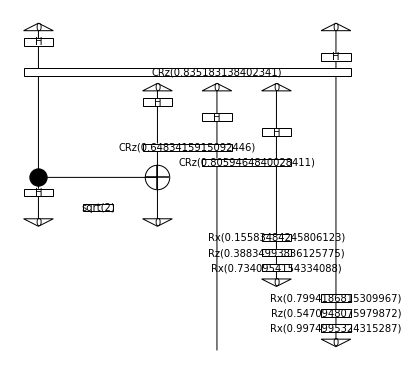

young kid irritates woman.
young >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ woman @ Id(n.l) >> Id(s) @ kid


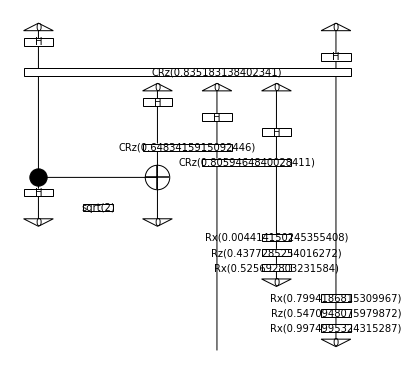

young kid irritates kid.
young >> Id(n) @ irritates @ Id(n.l) >> Cup(n, n.r) @ Id(s @ n.l @ n.l) >> Id(s) @ kid @ Id(n.l) >> Id(s) @ kid


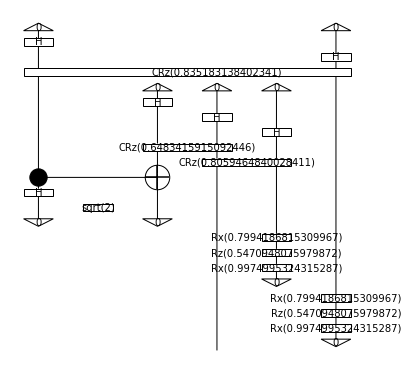

woman irritates irascible woman.
irritates >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ irascible >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


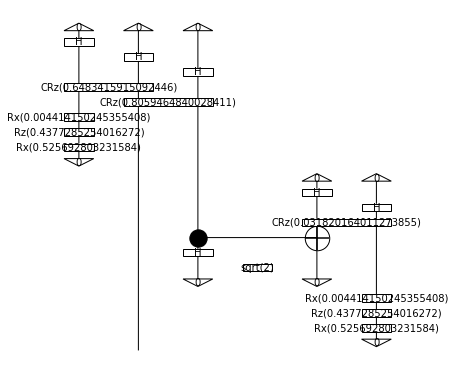

woman irritates irascible man.
irritates >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ irascible >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


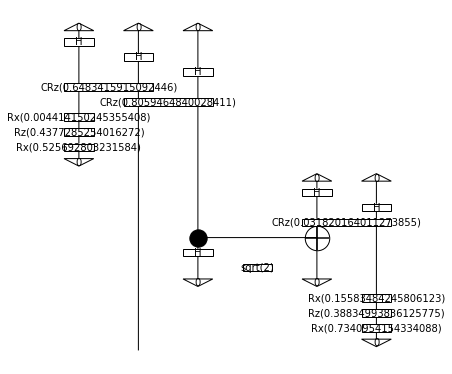

woman irritates irascible kid.
irritates >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ irascible >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


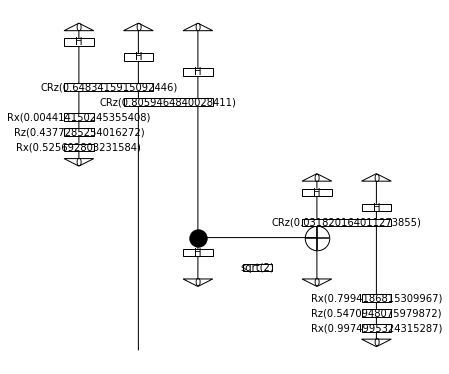

man irritates irascible woman.
irritates >> man @ Id(s @ n.l) >> Id(s @ n.l) @ irascible >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


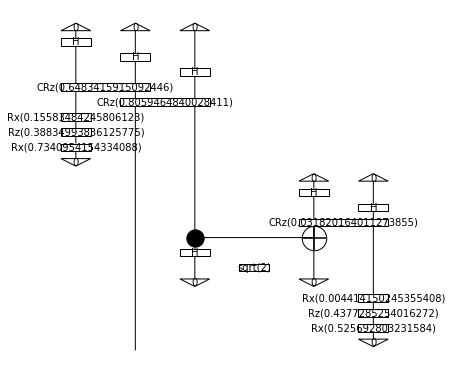

man irritates irascible man.
irritates >> man @ Id(s @ n.l) >> Id(s @ n.l) @ irascible >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


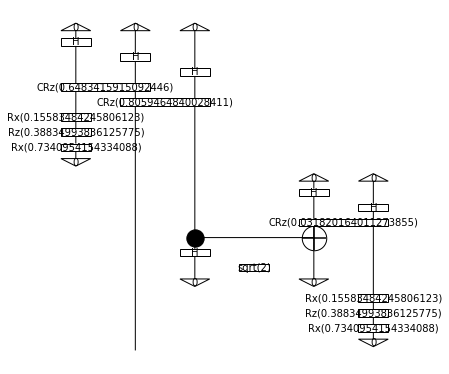

man irritates irascible kid.
irritates >> man @ Id(s @ n.l) >> Id(s @ n.l) @ irascible >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


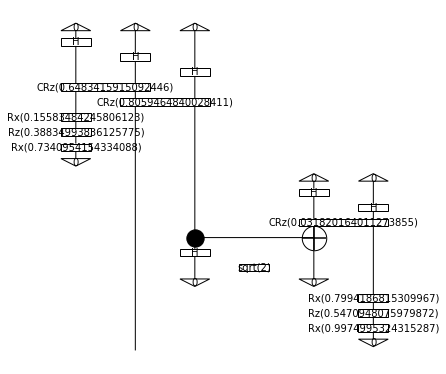

kid irritates irascible woman.
irritates >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ irascible >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


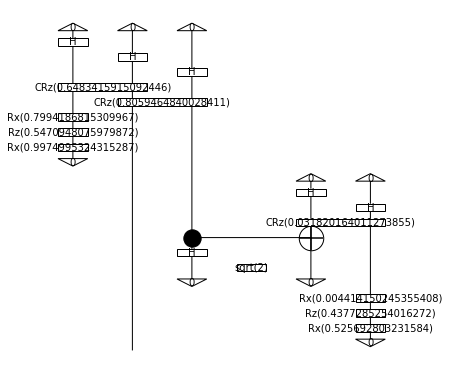

kid irritates irascible man.
irritates >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ irascible >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


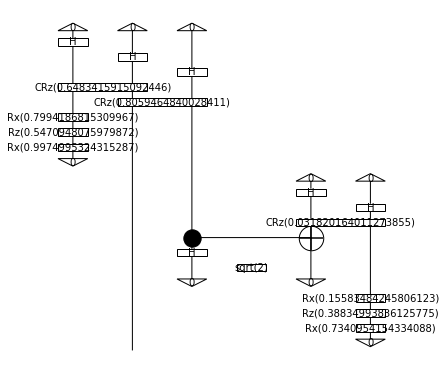

kid irritates irascible kid.
irritates >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ irascible >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


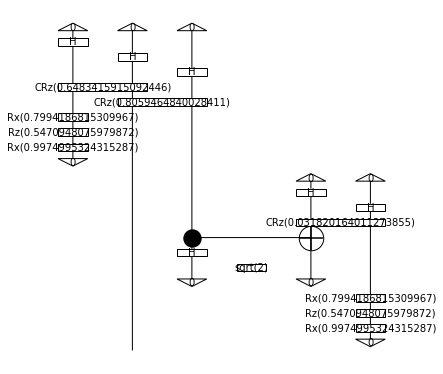

woman startles frightened woman.
startles >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ frightened >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


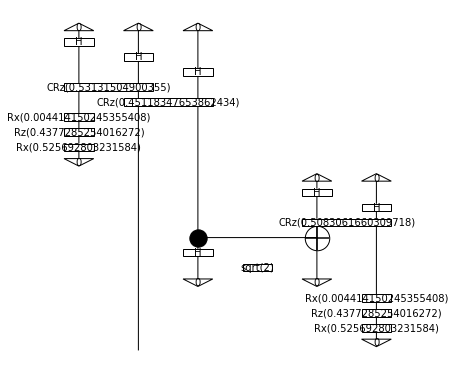

woman startles frightened man.
startles >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ frightened >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


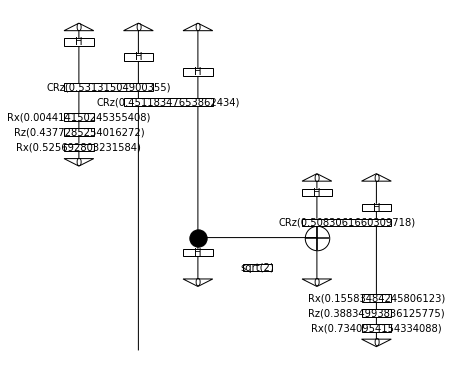

woman startles frightened kid.
startles >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ frightened >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


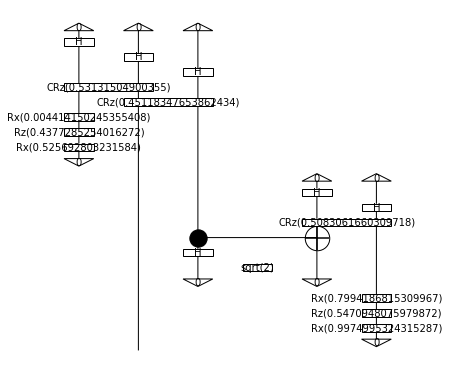

man startles frightened woman.
startles >> man @ Id(s @ n.l) >> Id(s @ n.l) @ frightened >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


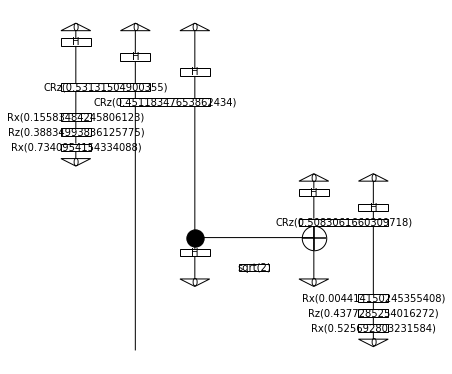

man startles frightened man.
startles >> man @ Id(s @ n.l) >> Id(s @ n.l) @ frightened >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


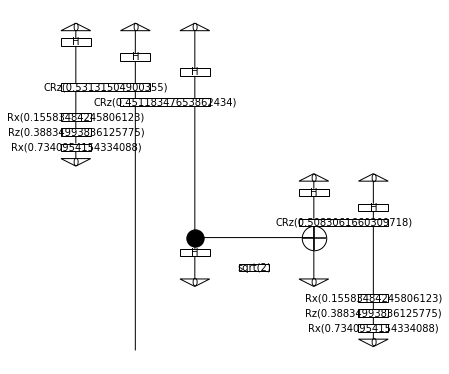

man startles frightened kid.
startles >> man @ Id(s @ n.l) >> Id(s @ n.l) @ frightened >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


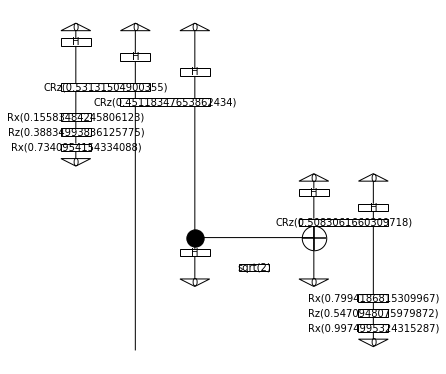

kid startles frightened woman.
startles >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ frightened >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


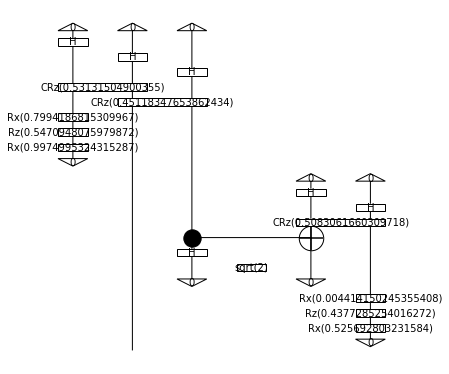

kid startles frightened man.
startles >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ frightened >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


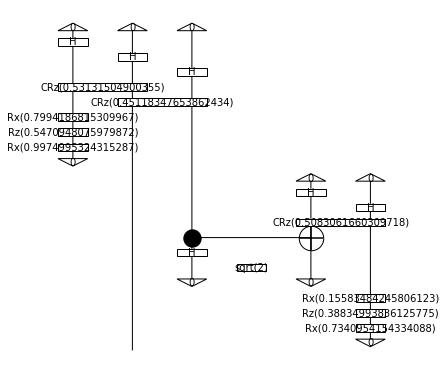

kid startles frightened kid.
startles >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ frightened >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


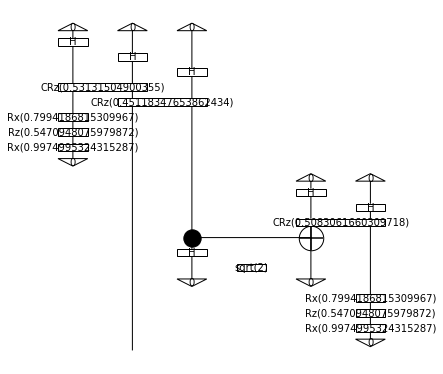

woman entertains cheerful woman.
entertains >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ cheerful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


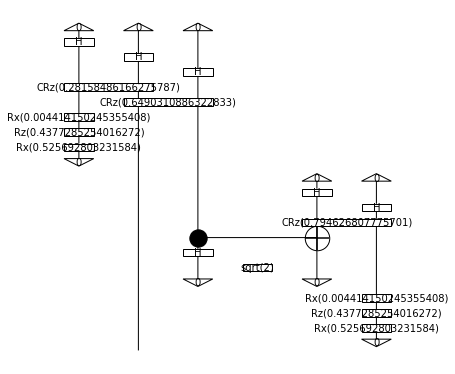

woman entertains cheerful man.
entertains >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ cheerful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


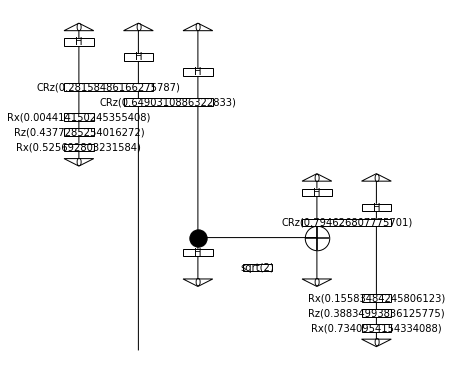

woman entertains cheerful kid.
entertains >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ cheerful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


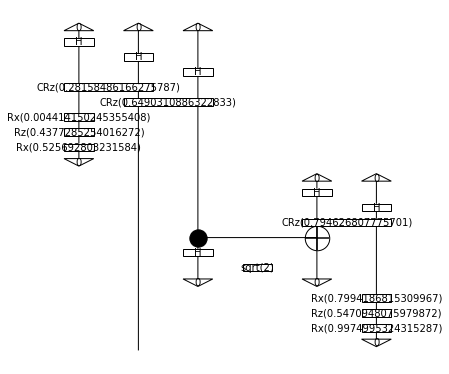

man entertains cheerful woman.
entertains >> man @ Id(s @ n.l) >> Id(s @ n.l) @ cheerful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


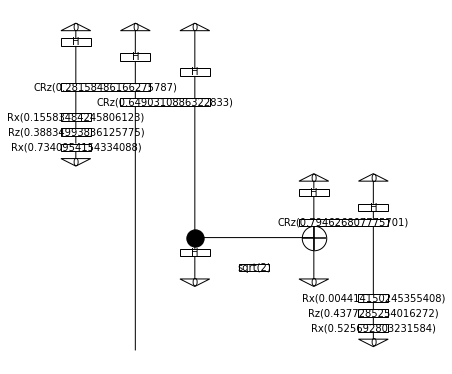

man entertains cheerful man.
entertains >> man @ Id(s @ n.l) >> Id(s @ n.l) @ cheerful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


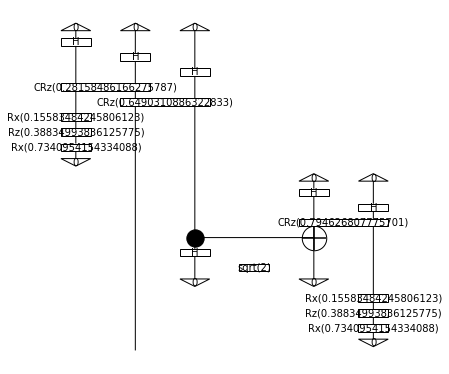

man entertains cheerful kid.
entertains >> man @ Id(s @ n.l) >> Id(s @ n.l) @ cheerful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


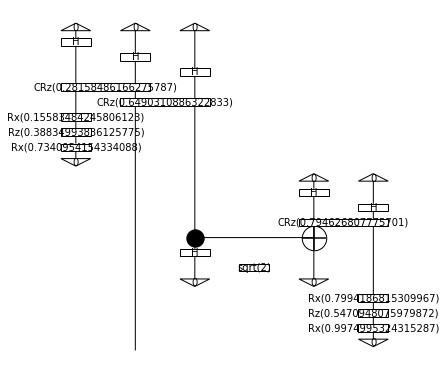

kid entertains cheerful woman.
entertains >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ cheerful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


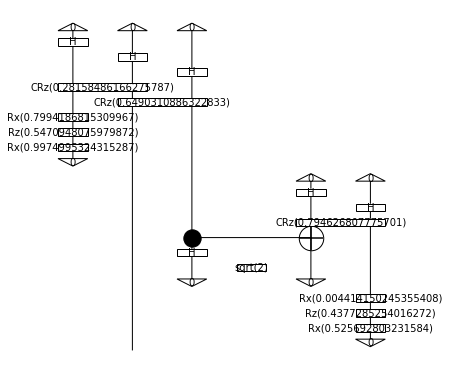

kid entertains cheerful man.
entertains >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ cheerful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


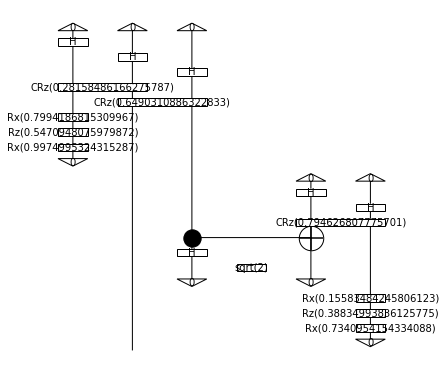

kid entertains cheerful kid.
entertains >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ cheerful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


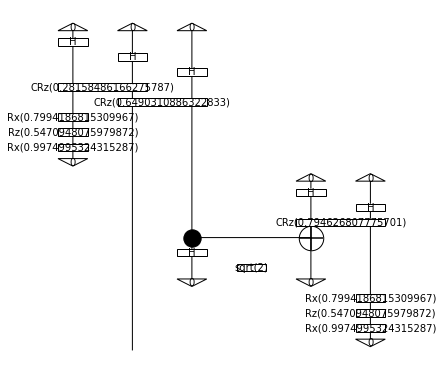

woman entertains joyful woman.
entertains >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ joyful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


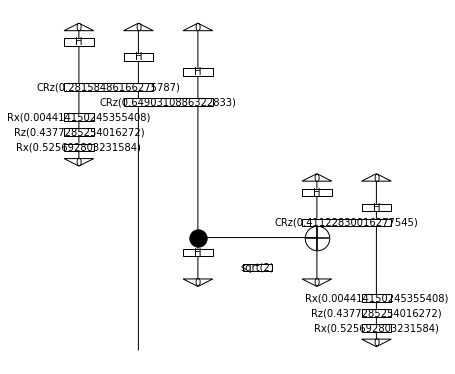

woman entertains joyful man.
entertains >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ joyful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


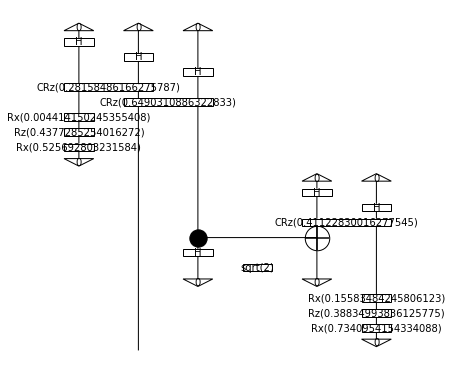

woman entertains joyful kid.
entertains >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ joyful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


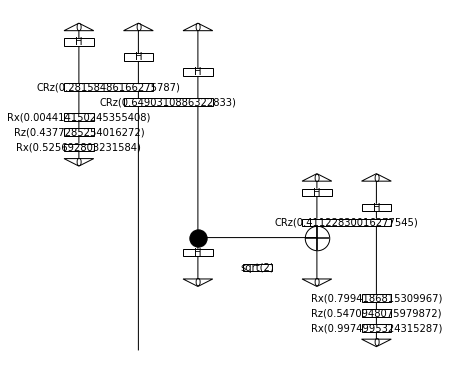

man entertains joyful woman.
entertains >> man @ Id(s @ n.l) >> Id(s @ n.l) @ joyful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


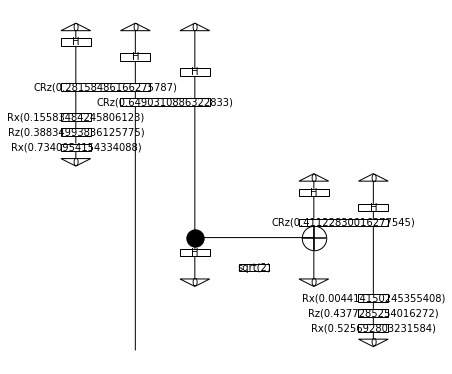

man entertains joyful man.
entertains >> man @ Id(s @ n.l) >> Id(s @ n.l) @ joyful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


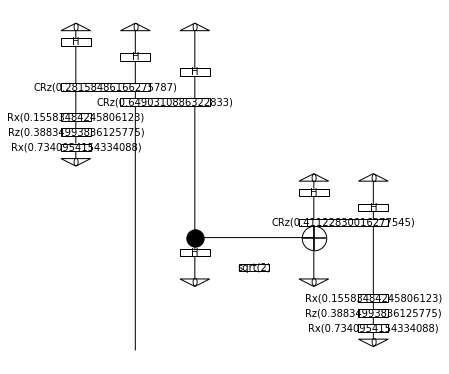

man entertains joyful kid.
entertains >> man @ Id(s @ n.l) >> Id(s @ n.l) @ joyful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


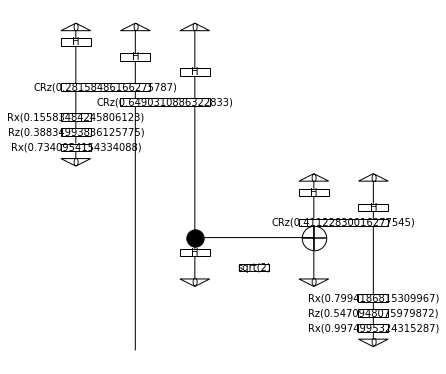

kid entertains joyful woman.
entertains >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ joyful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


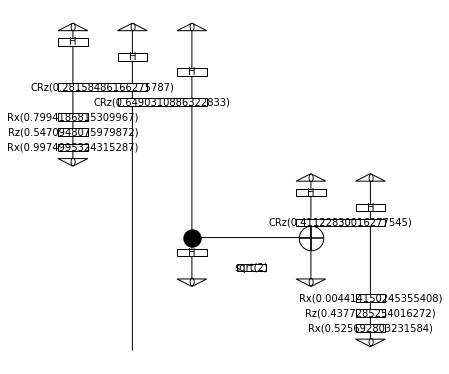

kid entertains joyful man.
entertains >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ joyful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


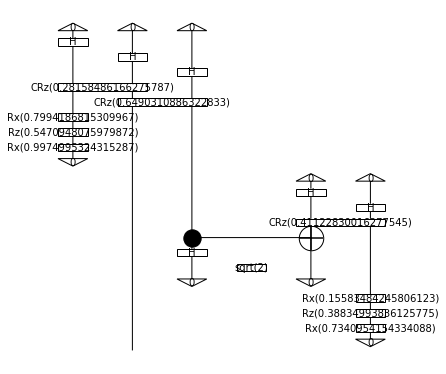

kid entertains joyful kid.
entertains >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ joyful >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


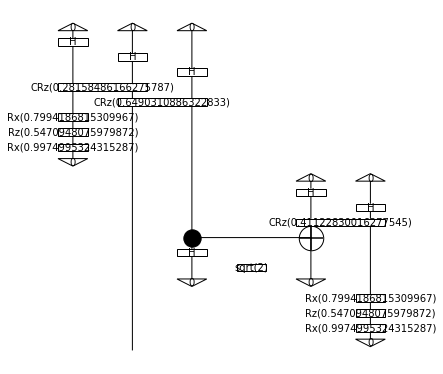

woman irritates furious woman.
irritates >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ furious >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


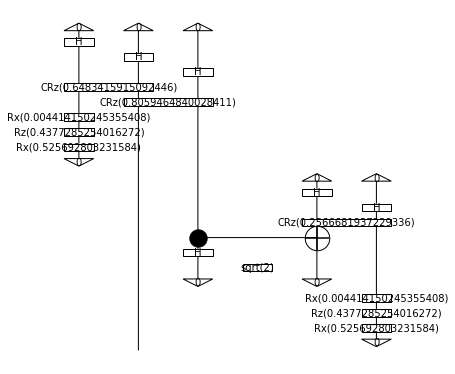

woman irritates furious man.
irritates >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ furious >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


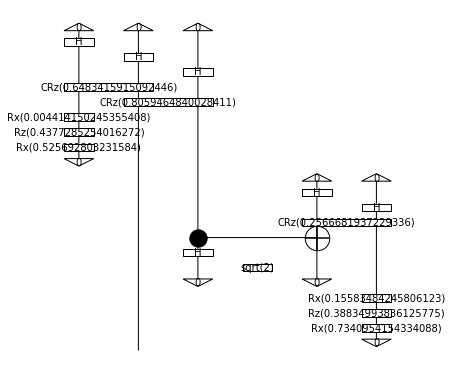

woman irritates furious kid.
irritates >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ furious >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


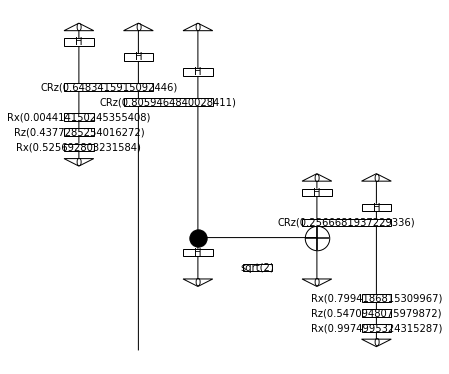

man irritates furious woman.
irritates >> man @ Id(s @ n.l) >> Id(s @ n.l) @ furious >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


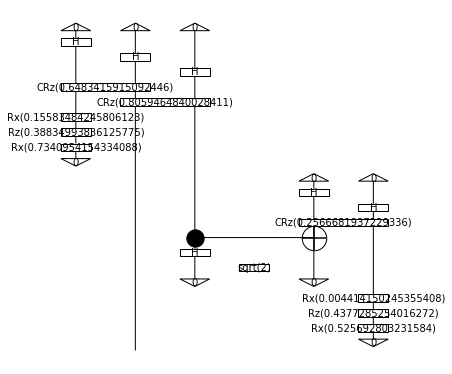

man irritates furious man.
irritates >> man @ Id(s @ n.l) >> Id(s @ n.l) @ furious >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


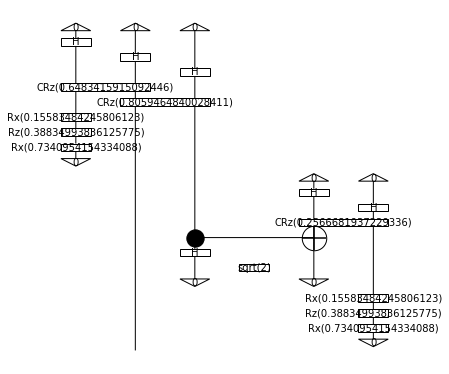

man irritates furious kid.
irritates >> man @ Id(s @ n.l) >> Id(s @ n.l) @ furious >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


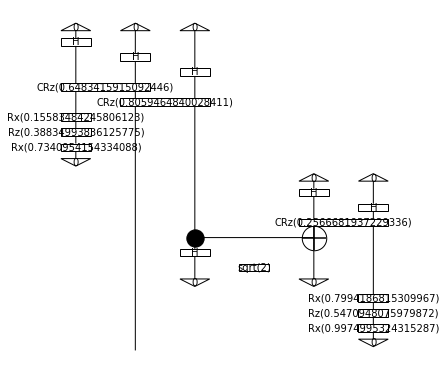

kid irritates furious woman.
irritates >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ furious >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


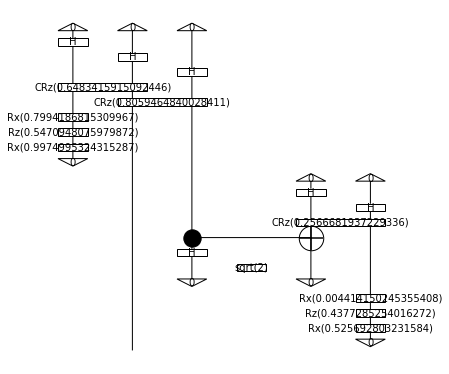

kid irritates furious man.
irritates >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ furious >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


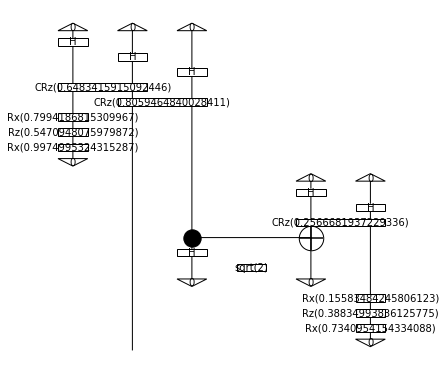

kid irritates furious kid.
irritates >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ furious >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


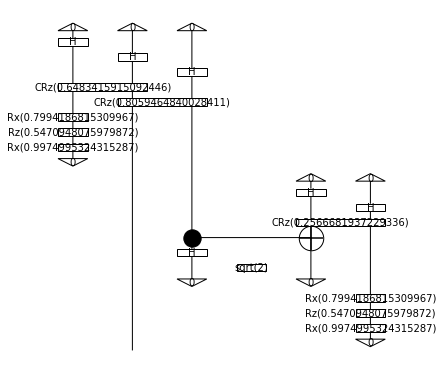

woman startles terrified woman.
startles >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ terrified >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


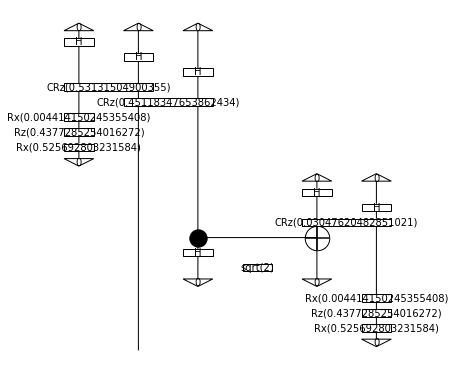

woman startles terrified man.
startles >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ terrified >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


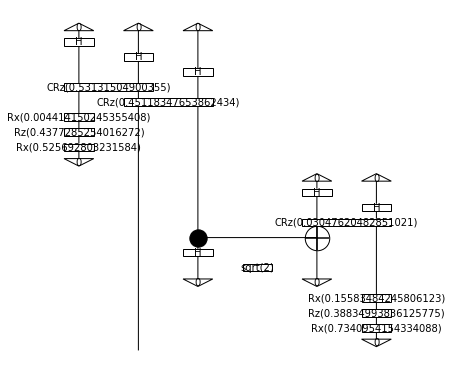

woman startles terrified kid.
startles >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ terrified >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


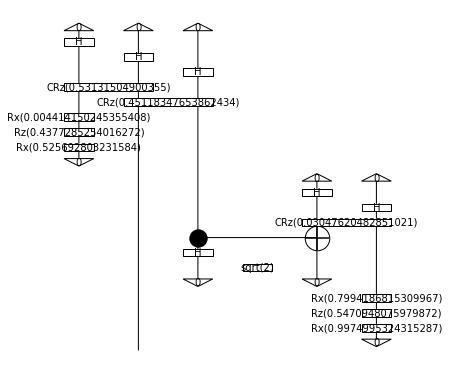

man startles terrified woman.
startles >> man @ Id(s @ n.l) >> Id(s @ n.l) @ terrified >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


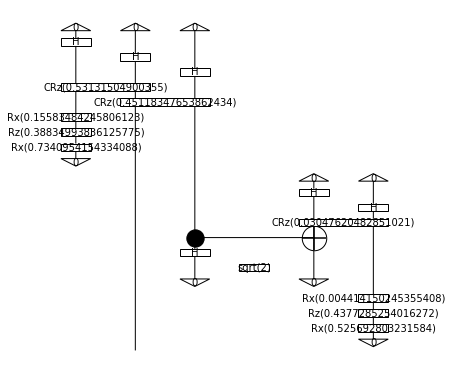

man startles terrified man.
startles >> man @ Id(s @ n.l) >> Id(s @ n.l) @ terrified >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


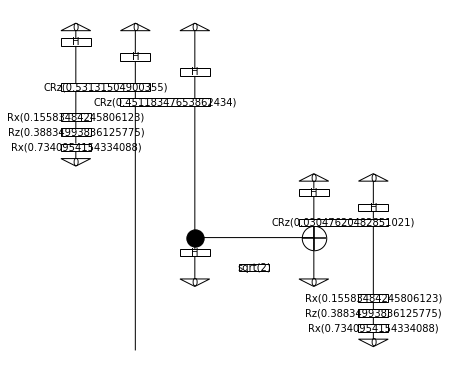

man startles terrified kid.
startles >> man @ Id(s @ n.l) >> Id(s @ n.l) @ terrified >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


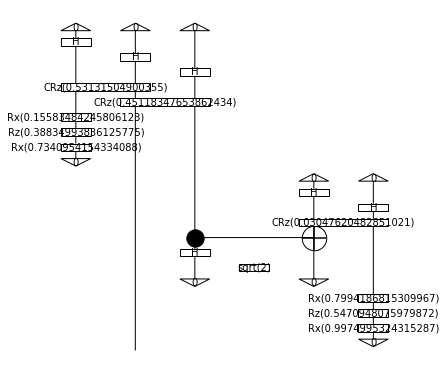

kid startles terrified woman.
startles >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ terrified >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


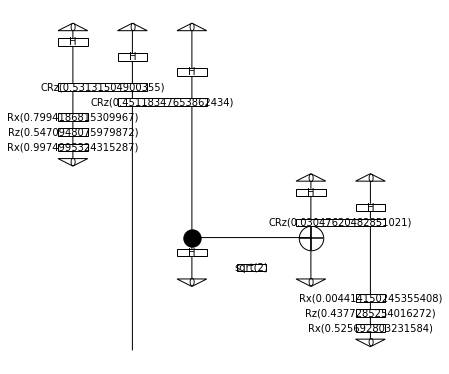

kid startles terrified man.
startles >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ terrified >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


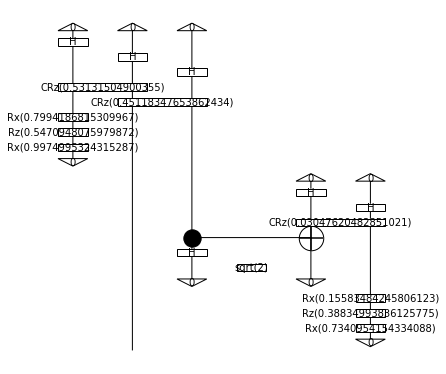

kid startles terrified kid.
startles >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ terrified >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ kid


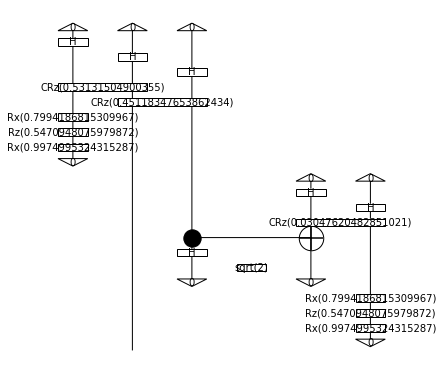

woman startles old woman.
startles >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


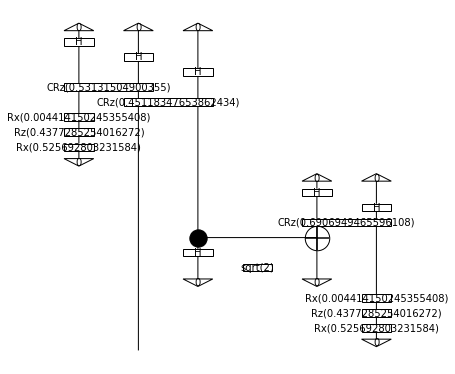

woman startles old man.
startles >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


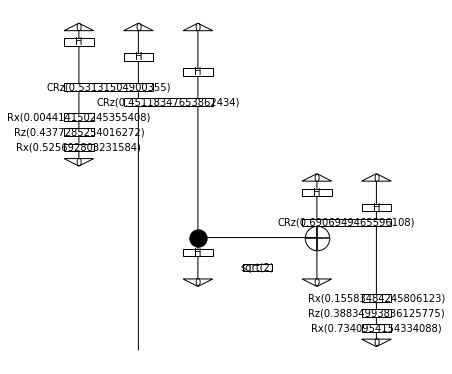

woman grieves old woman.
grieves >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


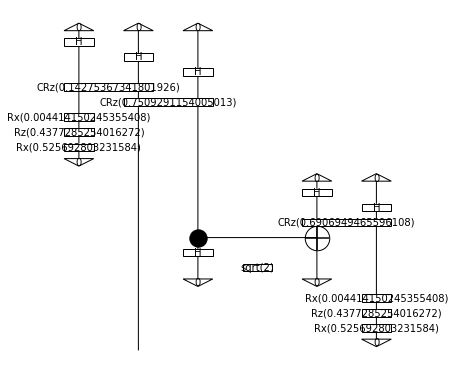

woman grieves old man.
grieves >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


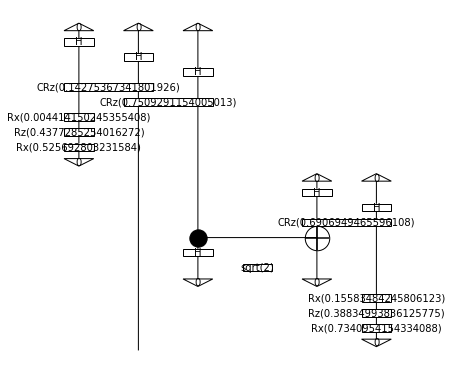

woman entertains old woman.
entertains >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


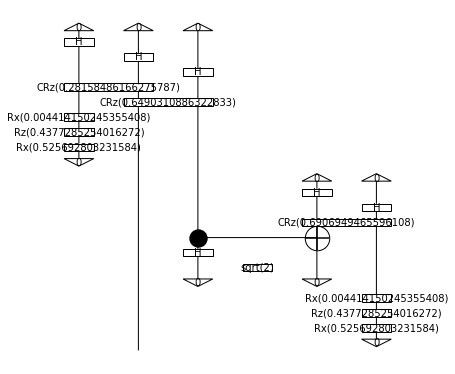

woman entertains old man.
entertains >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


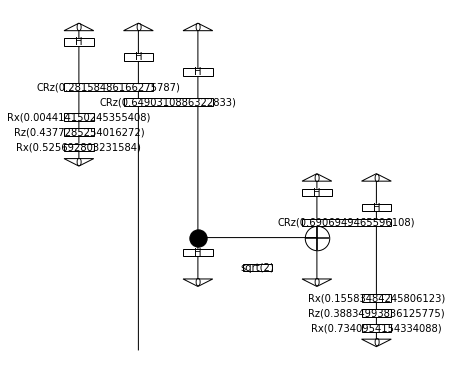

woman irritates old woman.
irritates >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


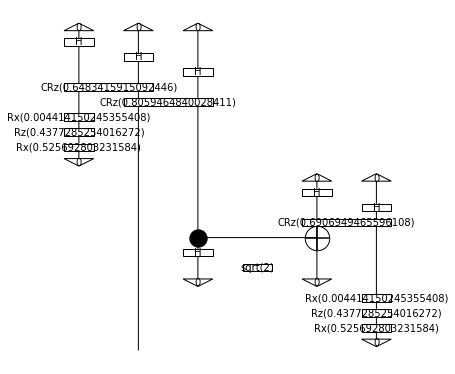

woman irritates old man.
irritates >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


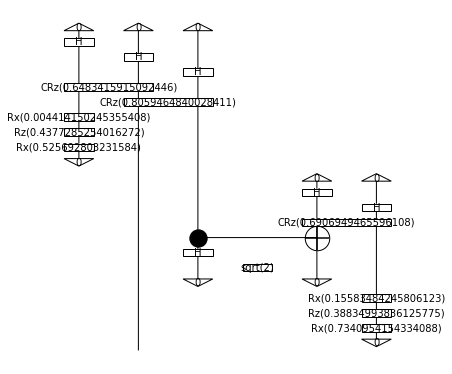

man startles old woman.
startles >> man @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


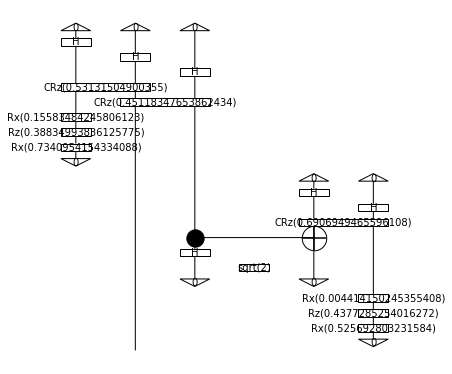

man startles old man.
startles >> man @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


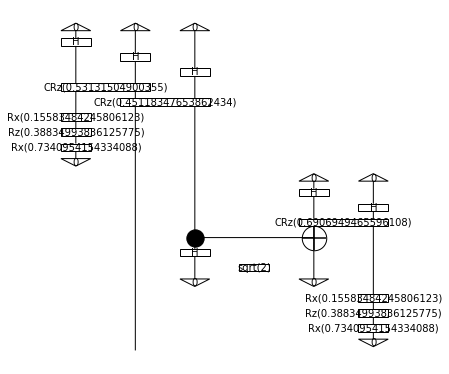

man grieves old woman.
grieves >> man @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


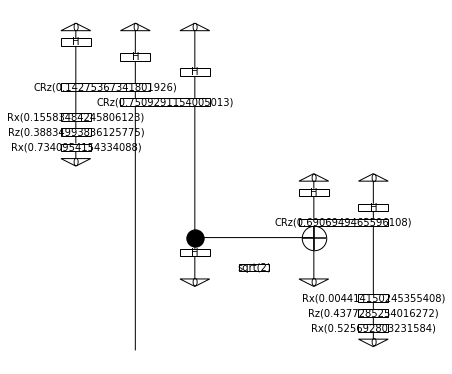

man grieves old man.
grieves >> man @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


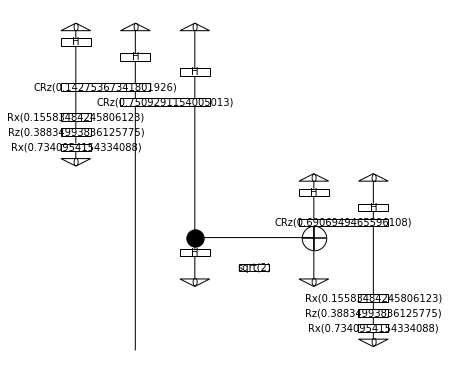

man entertains old woman.
entertains >> man @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


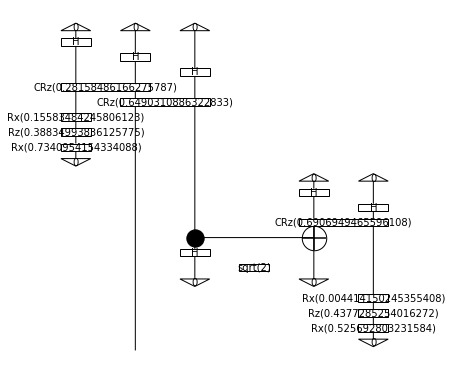

man entertains old man.
entertains >> man @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


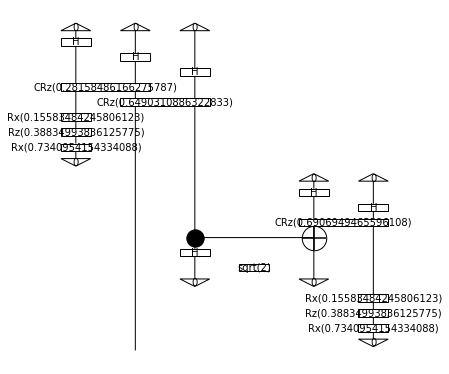

man irritates old woman.
irritates >> man @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


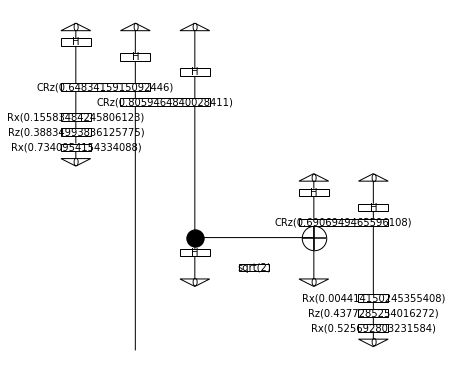

man irritates old man.
irritates >> man @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


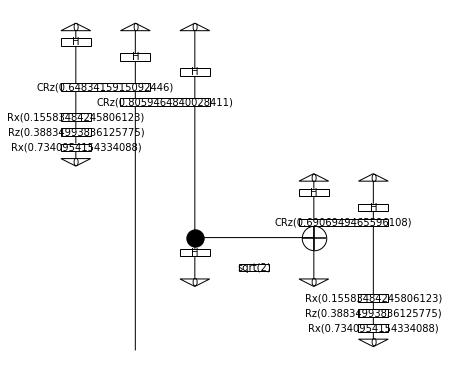

kid startles old woman.
startles >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


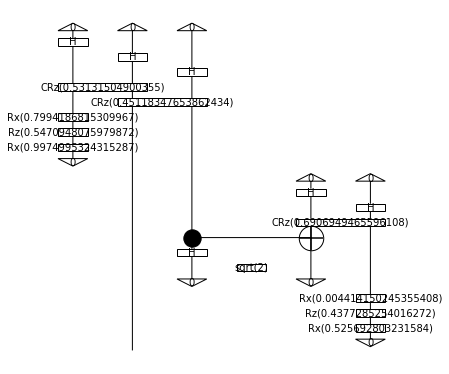

kid startles old man.
startles >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


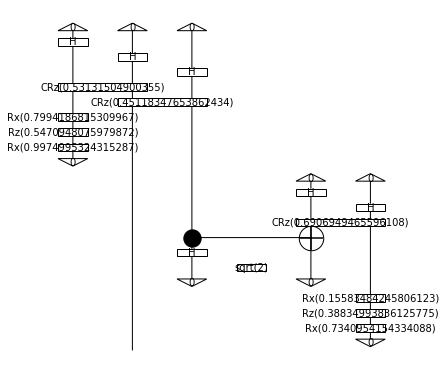

kid grieves old woman.
grieves >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


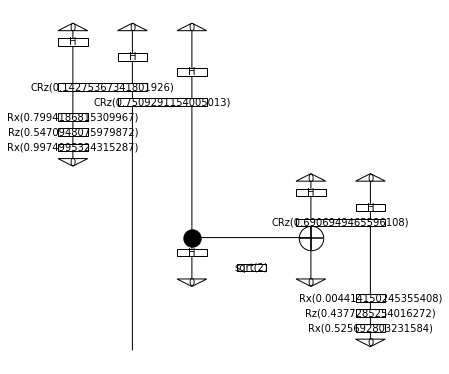

kid grieves old man.
grieves >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


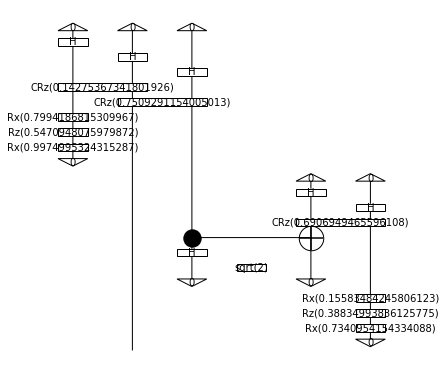

kid entertains old woman.
entertains >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


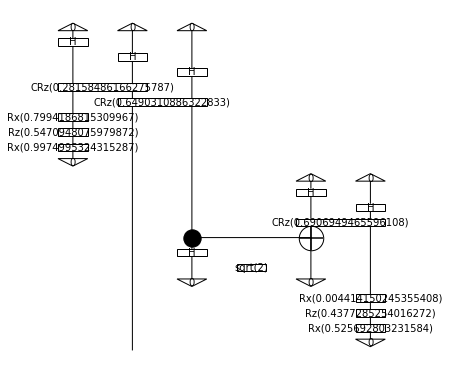

kid entertains old man.
entertains >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


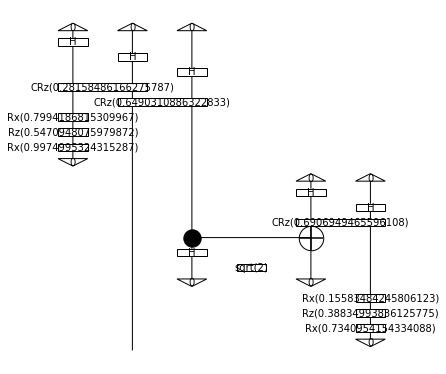

kid irritates old woman.
irritates >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


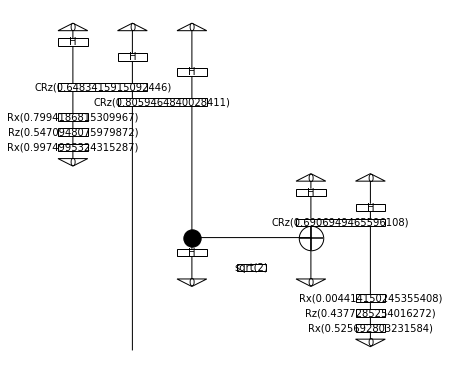

kid irritates old man.
irritates >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ old >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


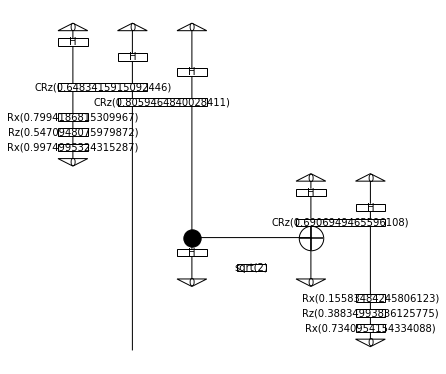

woman startles young woman.
startles >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


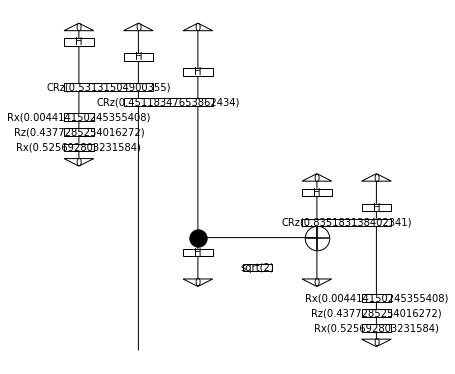

woman startles young man.
startles >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


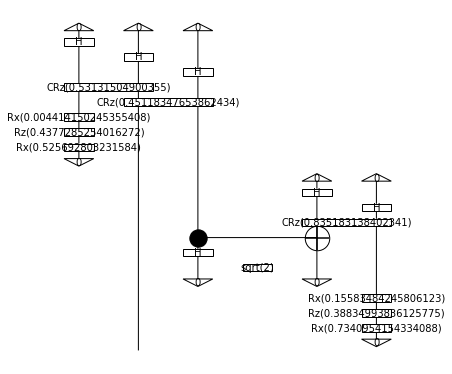

woman grieves young woman.
grieves >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


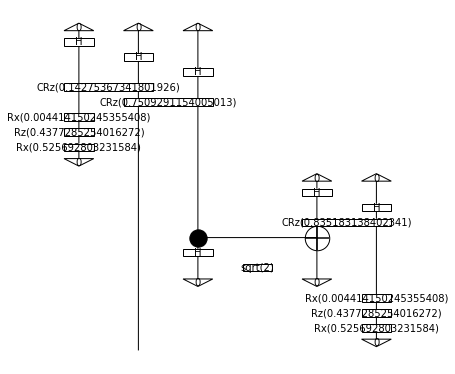

woman grieves young man.
grieves >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


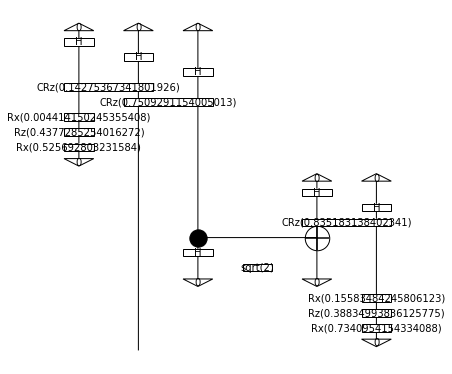

woman entertains young woman.
entertains >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


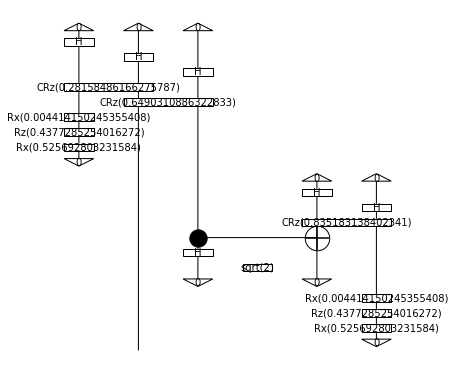

woman entertains young man.
entertains >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


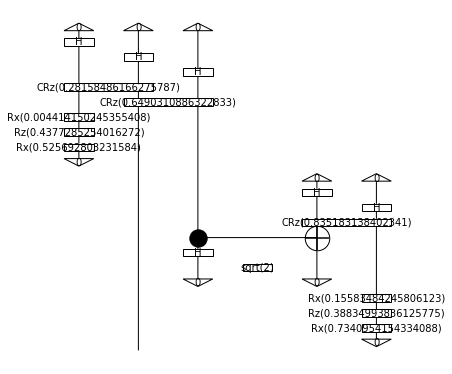

woman irritates young woman.
irritates >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


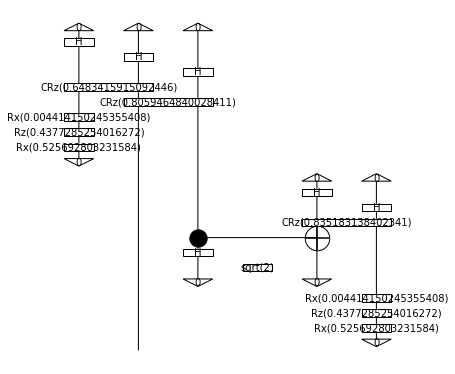

woman irritates young man.
irritates >> woman @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


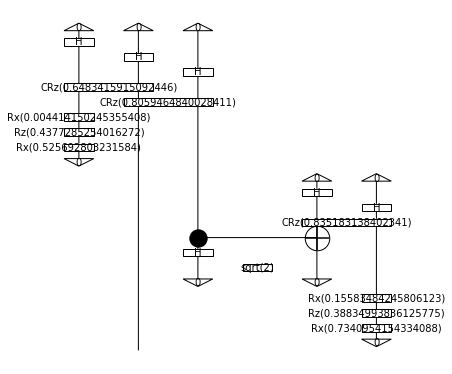

man startles young woman.
startles >> man @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


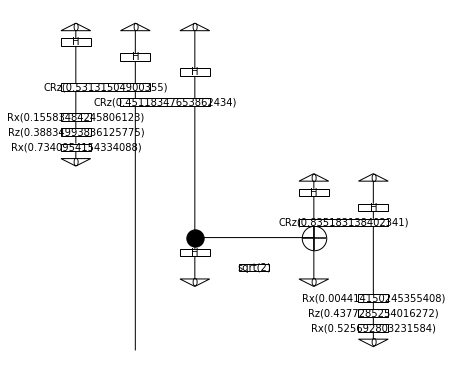

man startles young man.
startles >> man @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


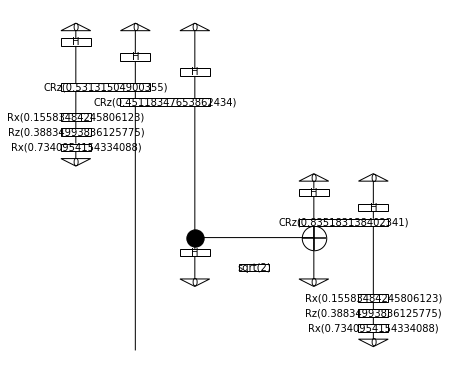

man grieves young woman.
grieves >> man @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


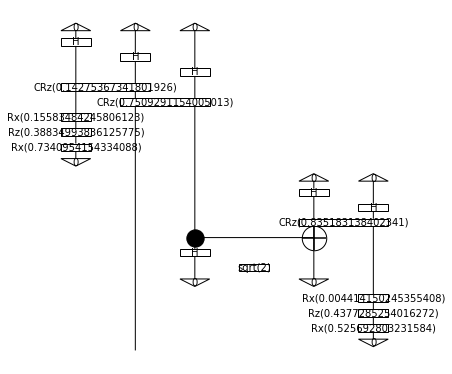

man grieves young man.
grieves >> man @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


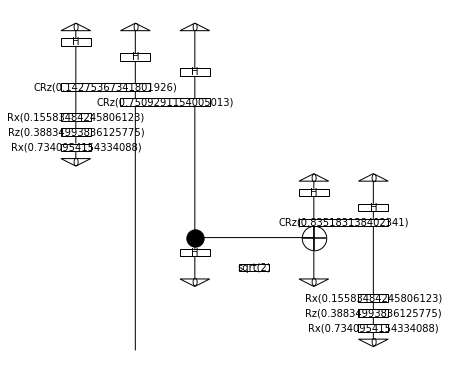

man entertains young woman.
entertains >> man @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


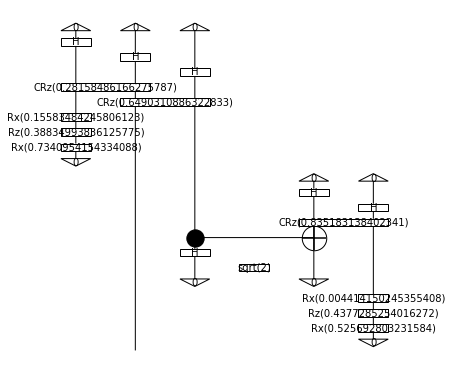

man entertains young man.
entertains >> man @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


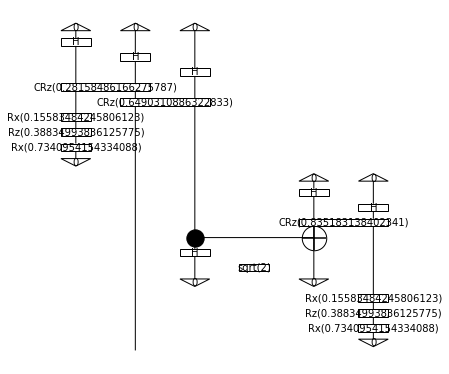

man irritates young woman.
irritates >> man @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


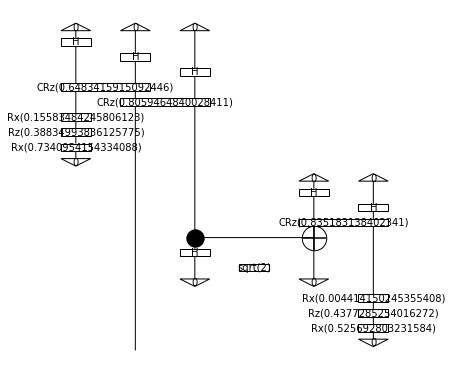

man irritates young man.
irritates >> man @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


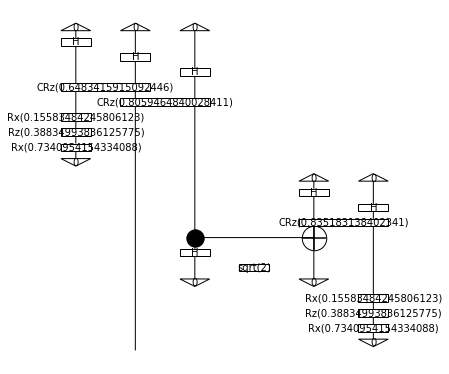

kid startles young woman.
startles >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


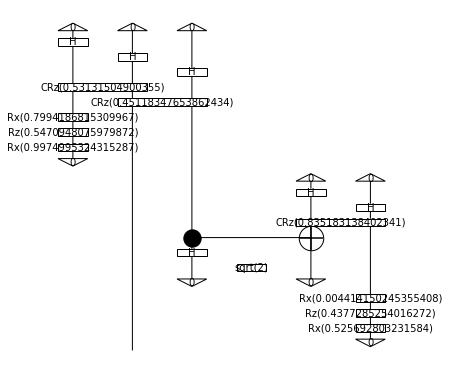

kid startles young man.
startles >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


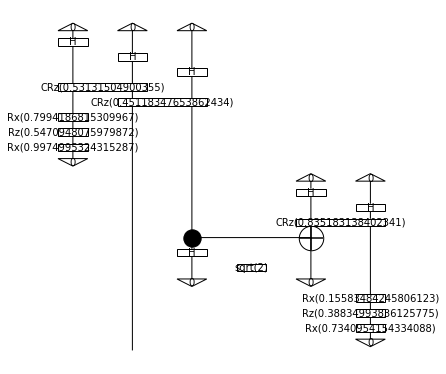

kid grieves young woman.
grieves >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


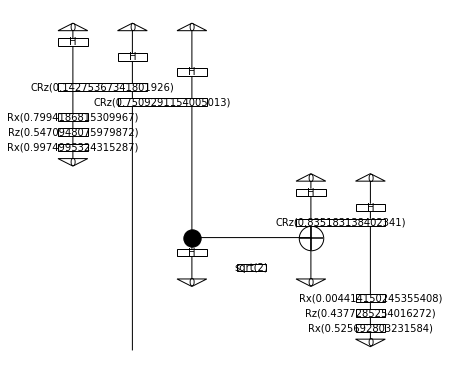

kid grieves young man.
grieves >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


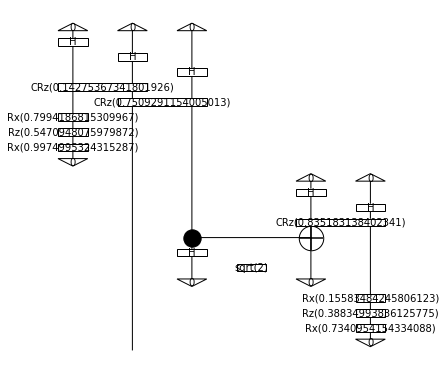

kid entertains young woman.
entertains >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


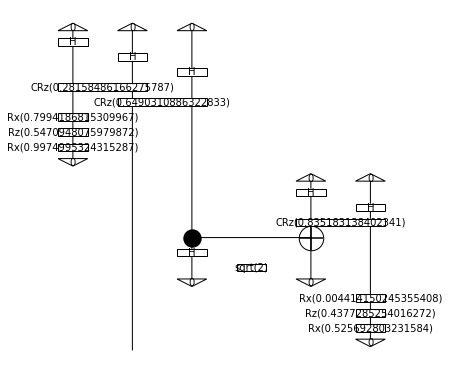

kid entertains young man.
entertains >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


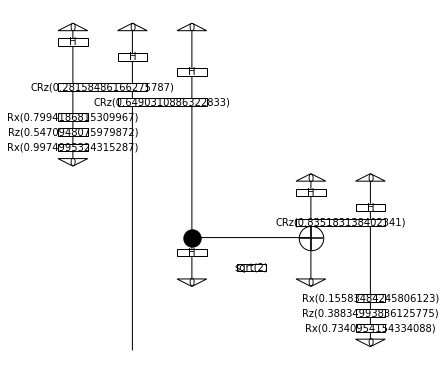

kid irritates young woman.
irritates >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ woman


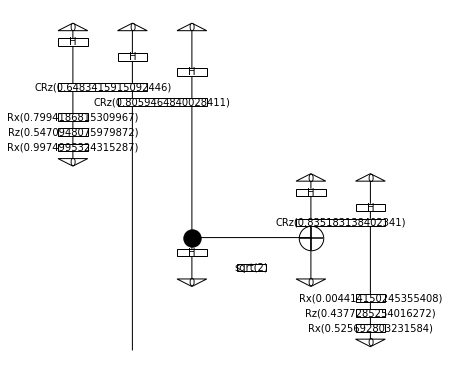

kid irritates young man.
irritates >> kid @ Id(s @ n.l) >> Id(s @ n.l) @ young >> Id(s) @ Cup(n.l, n) @ Id(n.l) >> Id(s) @ man


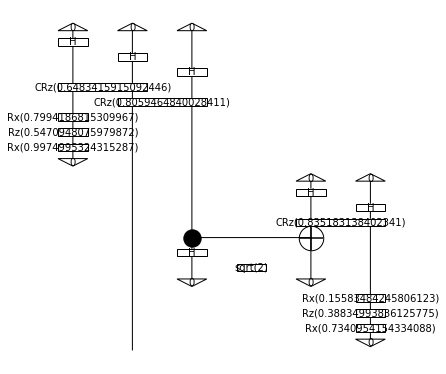

In [40]:
# Print the quantum circuit for each sentence
from qiskit import ClassicalRegister

func = F(rand_shaped_pars)


for sentstr in data_new_psr_dict:
    print(sentstr)
    print(data_new_psr_dict[sentstr])
    circ = func(data_new_psr_dict[sentstr])
    circ.draw(draw_box_labels=True, figsize=(5, 5))
    

## 3. Create training and test dataset

The next step is to divide our dataset into training and test data, so we can perform the classification using a supervised quantum machine learning technique. We need the data, which are the quantum circuits associated to each sentences, and the labels, that encode the sentiment. In this case the labels are the four possible quantum states that can be obtained from measuring a 2-qubit quantum circuit:

- Happy: $ \ 0 \ \rightarrow \ |00\rangle = [1,0,0,0] \ \rightarrow \ p_{00}=1$,
- Sad: $ \ 1 \ \rightarrow \ |01\rangle = [0,1,0,0] \ \rightarrow \ p_{01}=1$,
- Angry: $ \ 2 \ \rightarrow \ |10\rangle = [0,0,1,0] \ \rightarrow \ p_{10}=1$,
- Scared: $ \ 3 \ \rightarrow \ |11\rangle = [0,0,0,1] \ \rightarrow \ p_{11}=1$.

In [33]:
from sklearn.model_selection import train_test_split

psr_diagrams = []
psr_diagrams_dict = {}
psr_labels = []
sentences = []

for sentstr in data_new_psr_dict.keys():
    sentences.append(sentstr)
    diagram = data_new_psr_dict[sentstr]
    psr_diagrams.append(diagram)
    psr_diagrams_dict[sentstr] = diagram
    label = int(labels_dict[sentstr])
    psr_labels.append(label)

train_data_psr, test_data_psr, orig_train_labels, orig_test_labels = \
    train_test_split(psr_diagrams, psr_labels, test_size=0.25, random_state=42)
train_sent, test_sent, train_labels_sent, test_labels_sent = \
    train_test_split(sentences, psr_labels, test_size=0.25, random_state=42)

In [38]:
"""import random

def balance(sents, labels, tol=10):
    
    count0, count1 = labels.count(0), labels.count(1)
    if abs(count0 - count1) <= tol:
        return sents, labels
    elif count0 > count1:
        #j = labels.index(0)
        j = random.choice([k for k in range(len(labels)) if labels[k] == 0])
        labels.pop(j)
        sents.pop(j)
        return balance(sents, labels, tol=tol)
    else:
        #j = labels.index(1)
        j = random.choice([k for k in range(len(labels)) if labels[k] == 1])
        labels.pop(j)
        sents.pop(j)
        return balance(sents, labels, tol=tol)
"""

'import random\n\ndef balance(sents, labels, tol=10):\n    \n    count0, count1 = labels.count(0), labels.count(1)\n    if abs(count0 - count1) <= tol:\n        return sents, labels\n    elif count0 > count1:\n        #j = labels.index(0)\n        j = random.choice([k for k in range(len(labels)) if labels[k] == 0])\n        labels.pop(j)\n        sents.pop(j)\n        return balance(sents, labels, tol=tol)\n    else:\n        #j = labels.index(1)\n        j = random.choice([k for k in range(len(labels)) if labels[k] == 1])\n        labels.pop(j)\n        sents.pop(j)\n        return balance(sents, labels, tol=tol)\n'

In [39]:
def num_to_vec(x):
    if x:
        return [0,1] #True
    else:
        return [1,0]

data_sets_labels = {}
for i, cla in enumerate(['happy', 'sad', 'angry', 'scared']):
    data_sets_labels[cla] = {}
    
    tr_labels = [num_to_vec(i == t) for t in orig_train_labels]
    data_sets_labels[cla]['train'] = tr_labels
    
    te_labels = [num_to_vec(i == t) for t in orig_test_labels]
    data_sets_labels[cla]['test'] = te_labels

## 4. Optimization functions

The next step is to define the functions that we will use for the optimization. We will resort to a classical optimizer to perform this variational optimization, more concretely the SPSA. The cost function for this algorithm is the cross entropy, which is used to measure the distance between two probability distributions. For two probability distributions $S$ and $L$, the cross entropy $D$ is defined as

\begin{equation}
    D(S,L) = - \sum_i L_i \log (S_i).
\end{equation}

In our problem we have the labels that account for the ideal probability distribution $L$ associated to each sentiment, while the output of the variational algorithm is the distribution $S$.

Now we are going to define a function to compute the cross entropy for our problem, as well as the probabilities associated to each quantum circuit and the train and test errors.

In [ ]:
from pytket.extensions.qiskit import AerBackend
from discopy.quantum import Measure
backend = AerBackend()
max_n_shots = 8192  # maximum shots possible

In [ ]:
def get_probs(unshaped_params):
    func = F(reshape_params(unshaped_params, par_shapes))
    train_circuits = [(func(circ) >> Measure()) for circ in train_data_psr]
    results = Circuit.eval(*train_circuits, backend=backend, n_shots=max_n_shots, compilation=backend.default_compilation_pass(2))
    results_tweaked = [np.abs(np.array(res.array) - 1e-9) for res in results]
    pred_labels_distrs = [res.flatten() / np.sum(res) for res in results_tweaked]
    return pred_labels_distrs

def get_cost(pred_labels_distrs):
    cross_entropies = np.array([np.sum(train_labels[s] * np.log2(pred_labels_distrs[s])) for s in range(len(train_labels))])
    return -1 / len(train_data_psr) * np.sum(cross_entropies)

def get_train_error(pred_labels_distrs):
    correct = 0
    assert len(pred_labels_distrs[0].flatten()) == 2
    for i, res in enumerate(pred_labels_distrs):
        pred_result = np.argmax(res.flatten())
        train_result = np.argmax(train_labels[i])
        if train_result == pred_result:
            correct += 1
    return 100 - correct * 100 / len(train_data_psr)

def get_test_error(unshaped_params):
    func = F(reshape_params(unshaped_params, par_shapes))
    test_circuits = [(func(circ) >> Measure()) for circ in test_data_psr]
    results = Circuit.eval(*test_circuits, backend=backend, n_shots=max_n_shots, compilation=backend.default_compilation_pass(2))
    results_tweaked = [np.abs(np.array(res.array) - 1e-9) for res in results]
    assert len(results_tweaked[0].flatten()) == 2
    correct = 0
    pred_labels = []
    for i, res in enumerate(results_tweaked):
        pred_result = np.argmax(res.flatten())
        test_result = np.argmax(test_labels[i])
        pred_labels.append(pred_result)
        if test_result == pred_result:
            correct += 1
    return 100 - correct * 100 / len(test_data_psr), pred_labels

Once we have the cost function, we define a customized SPSA optimizer suitable for our task.

In [ ]:
#**********************************************************************************
# Minimization algorithm
#**********************************************************************************

# This is building on the minimizeSPSA function from the noisyopt package (https://github.com/andim/noisyopt);
# here only adjusted for our purposes. As this is an example notebook for a final run of the experiment
# the dev set is not used here.

def my_spsa(get_probs, get_cost, get_train_error, get_test_error, x0,
            bounds=None, niter=100, shots=1024, a=1.0, c=1.0, alpha=0.602, gamma=0.101,
            print_iter=False, correct_func_value=True,
            filename='spsa_output', iters_selected=[]):
    A = 0.01 * niter
    N = len(x0)
    if bounds is None:
        project = lambda x: x
    else:
        bounds = np.asarray(bounds)
        project = lambda x: np.clip(x, bounds[:, 0], bounds[:, 1])    
    param_history = []
    func_history = []
    error_history = []
    pred_label_history = []
    pred_labels_test_error = dict()
    test_error_list = []
    x = x0    
    
    # Loop over iterations
    for k in range(niter):
        if print_iter:
            print('-------------', '\n', 'iteration: ', k, sep='')
        start = time()
        
        # determine stepping parameters
        ak = a/(k+1.0+A)**alpha
        ck = c/(k+1.0)**gamma
        delta = np.random.choice([-1, 1], size=N)
        
        # move in + direction from previous x
        xplus = project(x + ck*delta)        
        if print_iter:
            print('Call for xplus')
        results_tweaked_plus = get_probs(xplus)
        funcplus = get_cost(results_tweaked_plus)
        
        # move in - direction from previous x
        xminus = project(x - ck*delta)
        if print_iter:
            print('Call for xminus')
        results_tweaked_minus = get_probs(xminus)
        funcminus = get_cost(results_tweaked_minus)
        
        # new step
        grad = (funcplus - funcminus) / (xplus-xminus)
        x = project(x - ak*grad)
        param_history.append(x)
        
        # determine current func and error
        if correct_func_value or k == (niter - 1):  # In order to save time the cost at x is only evaluated for final step
            if print_iter:
                print('Call for current_func_value')
            results_tweaked = get_probs(x)
            current_func_value = get_cost(results_tweaked)
            error = get_train_error(results_tweaked)
            pred_label_history.append(results_tweaked)
        else:
            current_func_value = funcplus
            error = get_train_error(results_tweaked_plus)
            pred_label_history.append(results_tweaked_plus)
        
        # calculate test error if a 'selected iteration' 
        if k in iters_selected:
            print('Calculate test error for iteration:', k)
            res = get_test_error(x)
            test_error_list.append(res[0])
            pred_labels_test_error.update({k: res[1]})
        
        func_history.append(current_func_value)
        error_history.append(error)

        # save to file
        dump_data = {
            'param_history': param_history,
            'func_history': func_history,
            'error_history': error_history,
            'predlabel_history': pred_label_history,
            'iters_selected': iters_selected,
            'test_error_list': test_error_list,
            'pred_labels_test_error': pred_labels_test_error
        }
        with open(filename+'.pickle', 'wb') as file_handle:
            pickle.dump(dump_data, file_handle)
        
        if print_iter:
            print('Time taken for this iteration: ', time() - start)
    return param_history, func_history, error_history, test_error_list

Finally, we can run the optimizer and obtain the results.

In [ ]:
#************************************
# Quantum run: training and error calculation
#************************************
from time import time
import pickle

bounds = [[0.0, 1.0] for ii in range(len(rand_unshaped_pars))]
c_fix = 0.1   
a_est = 0.015  

n_runs = 1
niter = 100

final_params = {}

for j, cla in enumerate(['happy', 'sad', 'angry', 'scared']):
    print("\n\n\n Begginning for ", cla)
    
    train_labels = data_sets_labels[cla]['train']
    test_labels = data_sets_labels[cla]['test']
    param_histories = []
    
    cost_histories = np.zeros((n_runs, niter))
    error_train_histories = np.zeros((n_runs, niter))

    # For test error calculation (for reasons of time cost not for all iterations)
    iters_selected = [(i+1)*10-1 for i in range(int(niter/10))]
    iters_selected.insert(0, 0)
    error_test_histories = np.zeros((n_runs, len(iters_selected)))

    for i in range(n_runs):
        print('---------------------------------')
        print('Start run ', i+1)
        rand_unshaped_pars = randparams(par_shapes)
        start = time()
        res = my_spsa(get_probs, get_cost, get_train_error, get_test_error, rand_unshaped_pars,
                      bounds=bounds, niter=niter, shots=1, a=a_est, c=c_fix,
                      print_iter=True, correct_func_value=False, filename=(cla + 'MC_task_SPSAOutput_Run_1vall' + str(i)),
                      iters_selected=iters_selected)
        param_histories.append(res[0])   
        cost_histories[i, :] = res[1]
        error_train_histories[i, :] = res[2]
        error_test_histories[i, :] = res[3]
        print('run', i+1, 'done')
        print('Time taken: ', time() - start)

In [ ]:
#****************************************************
# Averaging
#****************************************************

# In case N_runs > 1, one may want to calculate cost and errors averaged over several runs...

# In this example notebook however not done, hence:
cost_history = cost_histories[0, :]
error_train_history = error_train_histories[0, :]
error_test_history = error_test_histories[0, :]

In [ ]:
#****************************************************
# Summary plot
#****************************************************
from matplotlib import pyplot as plt

plt.rcParams.update({"text.usetex": True})
fig, ax1 = plt.subplots(figsize=(13, 8))

ax1.plot(range(len(cost_history)), cost_history, '-k', markersize=4, label='cost')
ax1.set_ylabel(r"Cost", fontsize='x-large')
ax1.set_xlabel(r"SPSA~iterations", fontsize='x-large')
ax1.legend(loc='upper center', fontsize='x-large')

ax2 = ax1.twinx()
ax2.set_ylabel(r"Error in \%", fontsize='x-large')
ax2.plot(range(len(error_train_history)), error_train_history, '-g', markersize=4, label='training error')
ax2.plot(iters_selected, error_test_history, 'xb', markersize=7, label='testing error')
ax2.legend(loc='upper right', fontsize='x-large')

plt.title('MC task, quantum run -- results', fontsize='x-large')
plt.savefig('MC_task_Results.png', dpi=300, facecolor='white')  
plt.show()

In [ ]:
## Testing saved values
"""import pickle
happy = pickle.load(open('happyMC_task_SPSAOutput_Run_1vall0.pickle', "rb"))
sad = pickle.load(open('sadMC_task_SPSAOutput_Run_1vall0.pickle', "rb"))
scared = pickle.load(open('scaredMC_task_SPSAOutput_Run_1vall0.pickle', "rb"))
angry = pickle.load(open('angryMC_task_SPSAOutput_Run_1vall0.pickle', "rb"))
final_params = {'happy': happy['param_history'][-1], 'sad': sad['param_history'][-1], 'scared': scared['param_history'][-1], 'angry': angry['param_history'][-1]}
"""

In [ ]:
## Testing balanced saved values
import pickle
happy = pickle.load(open('happySPSAOutput_Run_balanced0.pickle', "rb"))
#sad = pickle.load(open('sadSPSAOutput_Run_balanced0.pickle', "rb"))
scared = pickle.load(open('scaredSPSAOutput_Run_balanced0.pickle', "rb"))
angry = pickle.load(open('angrySPSAOutput_Run_balanced0.pickle', "rb"))
final_params = {'happy': happy['param_history'][-1], 'scared': scared['param_history'][-1], 'angry': angry['param_history'][-1]}

data_sets, data_labels = pickle.load(open("balanced_datasets.p", "rb"))

In [ ]:
data_labels

In [ ]:
#final_train_predictions = [(0,'') for _ in range(len(orig_train_labels))] # list of tuples of the form (probability, class)
final_test_predictions = [(0,'') for _ in range(len(orig_test_labels))]

test_predictions_dict = {}

individual_train_predictions = {}
individual_test_predictions = {}
classes = ['happy', 'sad', 'angry', 'scared']
for j, cla in enumerate(classes):
    params = final_params[cla]
    func = F(reshape_params(params, par_shapes))
    
    train_labels = data_sets_labels[cla]['train']
    test_labels = data_sets_labels[cla]['test']
    
    
    final_train_circuits = [(func(circ) >> Measure()) for circ in train_data_psr]
    final_test_circuits = [(func(circ) >> Measure() ) for circ in test_data_psr]
    train_results = Circuit.eval(*final_train_circuits, backend=backend, n_shots=max_n_shots, compilation=backend.default_compilation_pass(2))
    test_results = Circuit.eval(*final_test_circuits, backend=backend, n_shots=max_n_shots, compilation=backend.default_compilation_pass(2))
    
    train_results_tweaked = [np.abs(np.array(res.array) - 1e-9) for res in train_results]
    test_results_tweaked = [np.abs(np.array(res.array) - 1e-9) for res in test_results]
    pred_train_results = [res.flatten() / np.sum(res) for res in train_results_tweaked] 
    pred_test_results = [res.flatten() / np.sum(res) for res in test_results_tweaked]
    
    test_predictions_dict[cla] = ([np.argmax(r) for r in pred_test_results], test_labels)
    
    
    
    #Since each tuple (p, j) in these lists represents a probability that sentence i is in class j, this update keeps 
    #track of the most likely prediction so far
    final_train_predictions = [max(final_train_predictions[i], (pred_train_results[i][1], j)) for i in range(len(pred_train_results))]
    final_test_predictions = [max(final_test_predictions[i], (pred_test_results[i][1], j)) for i in range(len(pred_test_results))]
    
    individual_train_predictions[cla] = [np.argmax(pred) for pred in pred_train_results]
    individual_test_predictions[cla] = [np.argmax(pred) for pred in pred_test_results]

In [ ]:
#individual accuracy

for cla in classes:
    train_pred = individual_train_predictions[cla]
    train_actual = data_sets_labels[cla]['train']
    
    acc = [train_pred[i] == np.argmax(train_actual[i]) for i in range(len(train_pred))]
    print("\n\nfor", cla, ": train accuracy =", sum(acc)/len(acc))
    

    test_pred = individual_test_predictions[cla]
    test_actual = data_sets_labels[cla]['test']
    
    acc = [test_pred[i] == np.argmax(test_actual[i]) for i in range(len(test_pred))]
    print("for", cla, ": test accuracy =", sum(acc)/len(acc))
    
    

In [ ]:
from sklearn.metrics import confusion_matrix
for cla in classes:
    
    print("\n\n for", cla, "\n", confusion_matrix([np.argmax(t) for t in test_predictions_dict[cla][1]], test_predictions_dict[cla][0])) #true, pred

Overall:

In [ ]:
correct = 0
for i, res in enumerate(final_train_predictions):
    pred_result = res[1]
    train_result = orig_train_labels[i]
    print(train_sent[i])
    #print(res.flatten())
    #print(pred_result,train_result)
    if train_result == pred_result:
        correct += 1
    #print(f'Result: {train_array, train_result}, Predicted result: {res, pred_result}')
print('Correct overall predictions (train):',correct/len(train_results_tweaked))

correct = 0
for i, res in enumerate(final_test_predictions):
    pred_result = res[1]
    test_result = orig_test_labels[i]
    if test_result == pred_result:
        correct += 1
print('Correct overall predictions (test):',correct/len(test_results_tweaked))

In [ ]:
import pickle
pickle.dump(final_params, open("final_param.p", "wb"))

In [ ]:
1/0

In [ ]:
final_params = res[0][-1]
func = F(reshape_params(final_params, par_shapes))
final_train_circuits = [(func(circ) >> Measure()) for circ in train_data_psr]
final_test_circuits = [(func(circ) >> Measure()) for circ in test_data_psr]
train_results = Circuit.eval(*final_train_circuits, backend=backend, n_shots=max_n_shots, compilation=backend.default_compilation_pass(2))
test_results = Circuit.eval(*final_test_circuits, backend=backend, n_shots=max_n_shots, compilation=backend.default_compilation_pass(2))
train_results_tweaked = [np.abs(np.array(res.array) - 1e-9) for res in train_results]
test_results_tweaked = [np.abs(np.array(res.array) - 1e-9) for res in test_results]
pred_train_results = [res.flatten() / np.sum(res) for res in train_results_tweaked]
pred_test_results = [res.flatten() / np.sum(res) for res in test_results_tweaked]

In [ ]:
correct = 0
for i, res in enumerate(pred_train_results):
    pred_result = np.argmax(res.flatten())
    train_result = np.argmax(train_labels[i])
    #print(train_sent[i])
    #print(res.flatten())
    #print(pred_result,train_result)
    if train_result == pred_result:
        correct += 1
    #print(f'Result: {train_array, train_result}, Predicted result: {res, pred_result}')
print('Correct predictions (train):',correct/len(train_results_tweaked))

In [ ]:
correct = 0
for i, res in enumerate(test_results_tweaked):
    pred_result = np.argmax(res.flatten())
    test_result = np.argmax(test_labels[i])
    if test_result == pred_result:
        correct += 1
print('Correct predictions (test):',correct/len(test_results_tweaked))

### Qiskit SPSA implementation

In [66]:
from qiskit import BasicAer, execute

backend = BasicAer.get_backend('qasm_simulator')
max_shots = 8192

def get_qiskit_circuit(circ, func=None, sent=None, transpile=False):
    assert sent or circ, "need at least one"
    assert not transpile, "transpile not implemented yet"
    if not circ:
        circ = func(data_new_psr_dict[sent])
        
    qc = tk_to_qiskit(circ.to_tk())
    out_reg = ClassicalRegister(1)
    qc.add_register(out_reg)
    qc.measure(2, out_reg[0]) #sentence qubit is 2 for this problem
    
    return qc

def post_select(results, eff='000'):
    ks = [k for k in results.keys() if k.split()[1] == eff]
    return {k.split()[0]:v for (k,v) in results.items() if k in ks}

def parse_results(results):
    post_selected_results = post_select(results)
    
    if '0' not in post_selected_results:
        post_selected_results['0'] = 0
    if '1' not in post_selected_results:
        post_selected_results['1'] = 0
        
    total = post_selected_results['0'] + post_selected_results['1']
    
    assert total > 0, 'total was 0 after postselection - try running with more shots'
    
    
    return [post_selected_results['0']/total,  post_selected_results['1']/total]
    

In [67]:
print(result.get_counts())
print(post_select(result.get_counts()))
parse_results(result.get_counts())

{'0 101': 838, '0 011': 941, '1 100': 853, '1 111': 829, '0 000': 944, '1 010': 967, '0 100': 158, '0 110': 943, '1 001': 853, '1 101': 73, '1 110': 140, '1 000': 196, '0 010': 196, '0 111': 62, '0 001': 102, '1 011': 97}
{'0': 944, '1': 196}


[0.8280701754385965, 0.17192982456140352]

In [68]:
from qiskit.algorithms.optimizers import SPSA

def old_cost(unshaped_params):
    probs = get_probs(unshaped_params)
    cross_entropies = np.array([np.sum(train_labels[s] * np.log2(pred_labels_distrs[s])) for s in range(len(train_labels))])
    return -1 / len(train_data_psr) * np.sum(cross_entropies) 


def get_cost(unshaped_params):
    func = F(reshape_params(unshaped_params, par_shapes))
    train_circuits = [get_qiskit_circuit(func(circ)) for circ in train_data_psr]
    
    circuit_results = [execute(qc, backend, shots=max_shots).result().get_counts() for qc in train_circuits]
    #do a check here for non zero post selection
    
    results = [parse_results(r) for r in circuit_results]
    
    results_tweaked = [np.abs(np.array(res.array) - 1e-9) for res in results] #from before
    pred_labels_distrs = [res.flatten() / np.sum(res) for res in results_tweaked]
    
    cross_entropies = np.array([np.sum(train_labels[s] * np.log2(pred_labels_distrs[s])) for s in range(len(train_labels))])
    return -1 / len(train_data_psr) * np.sum(cross_entropies)


rand_unshaped_pars = randparams(par_shapes)
num_vars = len(rand_unshaped_pars)



bounds = bounds = [[0.0, 1.0] for _ in range(len(rand_unshaped_pars))]

opt = SPSA(maxiter=100)
#opt.print_options()
#opt.calibrate(get_cost, initial_point=rand_unshaped_pars)
print("training")
vals, c, iterations = opt.optimize(num_vars, get_cost, initial_point=rand_unshaped_pars, variable_bounds=bounds)#, gradient_function=grad_func) 

training


AssertionError: total was 0 after postselection - try running with more shots